# Project 3: Regression and Classification with the Ames Housing Data


Fiona Dee - May/June 2021

NOTE:  
**Black headlines** are information, instructions or other text provided with the project.  
<span style="color:purple">**Purple headlines** are my commentary</span>  

---
---

<a id='index'></a>
### <span style="color:purple">Index</span>

[Import statements](#import)  
[Define Functions](#functions)  
  
##### Question 1
1. [Load Data & exclude non-residential properties](#load)
2. [Variables: initial checks](#initial_check)
3. [Grouping variables: Renovatable/non](#group_variables)
4. [Groups of features: Analysis & Visualisations](#analyise_grouped_variables)
5. [Feature selection: Fixed](#feature_selection_fixed)
6. [Split data into test & train, plus Standardise](#test_train_split_fixed)
7. [Train models](#train_model_fixed)
8. [Question 1 Summary](#q1_summary)


##### Question 2
1. [Feature selection: Renovatable](#feature_selection_reno)  
2. [Split data into test & train, plus Standardise](#test_train_split_reno)  
3. [Train models](#train_model_reno) 
4. [Question 2 Summary](#q2_summary)


##### Options for alternative analysis/predictions [link to section](#further_analysis)



---
---

### Background Information about the project

You work for a real estate company interested in using data science to determine the best properties to buy and re-sell. Specifically, your company would like to identify the characteristics of residential houses that estimate the sale price and the cost-effectiveness of doing renovations.

There are three components to the project:

1. Estimate the sale price of properties based on their "fixed" characteristics, such as neighborhood, lot size, number of stories, etc.


2. Estimate the impact of possible renovations to properties from the variation in sale price not explained by the fixed characteristics.  

3. Bonus Question: Determine the features in the housing data that best predict "abnormal" sales (foreclosures, etc.).

#### The full description of the data features can be found in a separate file in the project-3 repo: data_description.txt

#### For question one and two you will likely need to test different models to arrive at your "best model" for each question. This should not be an exhaustive exercise as the cleaning and eda ahead is significant enough by itself.  



#### This project uses the [Ames housing data recently made available on kaggle](https://www.kaggle.com/c/house-prices-advanced-regression-techniques).


---
<a id='import'></a>
### <span style="color:purple">Import statements</span>

[back to index](#index)


In [1]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

sns.set_style('whitegrid')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [2]:
# show all columns of dataframes
pd.set_option("display.max_columns", None)

---
<a id='functions'></a>
### <span style="color:purple">Define Functions</span>

[back to index](#index)


In [3]:
# check basic info about column
def check_column(column_name):
    print('***',house[column_name].name, '***')
    print('data type:', house[column_name].dtype)
    print('count nulls:', house[column_name].isna().sum())
    print('count NA:', sum(house[column_name] == 'NA'))
    print('\n value counts:\n', house[column_name].value_counts().sort_index())
    

In [4]:
# change 'NA' to new value & change column to new dtype
def column_NA_replace_dtype(column_name, replace_with=np.nan, to_type='float'):
    
    house[column_name].replace(to_replace='NA', 
                               value=replace_with, 
                               inplace=True)

    house[column_name] = house[column_name].astype(to_type)
    check_column(column_name)


In [5]:
# plot distribution of continuous variable
def plot_box_kde(column_name):
    sns.boxplot(data=house[column_name], orient='h')
    sns.displot(data=house[column_name], kde=True)


In [6]:
# plot a corner heatmap for correlation values
def plot_corr(data, size1=20, size2=20):

    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(data, dtype=bool))

    plt.figure(figsize=(size1, size2))
    
    sns.heatmap(
        data,
        cmap='vlag', #palette being used
        annot=True, #annotate each square
        mask=mask, #get rid of redundant info, need only one half of matrix
        vmin=-1.,
        vmax=1.,
        linewidths=.01
    )
    plt.title('Correlation matrix');


In [7]:
# Plot actual against predictions
def plot_predictions(y_tr, y_tr_p, y_te, y_te_p, plot_title):
    g = sns.scatterplot(x=y_tr_p, y=y_tr, label='Training data')
    sns.scatterplot(x=y_te_p, y=y_te, label='Test data', color='r')
    plt.legend(loc='upper left')
    g.set(xlabel='Predicted values', ylabel='Real values', title=plot_title);


In [8]:
# Plot residuals against predicted
def plot_residuals(y_tr, y_tr_p, y_te, y_te_p, plot_title):
    # residual = observed - predicted
    res_tr = y_tr - y_tr_p
    res_te = y_te - y_te_p
    g = sns.scatterplot(x=y_tr_p, y=res_tr, label='Training data')
    sns.scatterplot(x=y_te_p, y=res_te, label='Test data', color='r')
    plt.legend(loc='upper left')
    g.set(xlabel='Predicted values', ylabel='Residuals', title=plot_title);


In [9]:
# plot distribution of residuals
def plot_residual_dist(y_te, y_te_p):
    residuals = y_te - y_te_p
    print('mean:', residuals.mean(), 'median:', residuals.median(), 'std:', residuals.std())
    sns.displot(data=residuals);


In [10]:
# put features, coefs & abs coef into a sorted dataframe
def coefs_to_dataframe(feature_list, coef_list):
    df = pd.DataFrame({'feature': feature_list,
                      'coefs': coef_list,
                      'abs_coefs': np.abs(coef_list)})
    df.sort_values('abs_coefs', inplace=True, ascending=False)
    return df

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 1. Estimating the value of homes from fixed characteristics.

---
 

#### Q1. You need to build a reliable estimator/model for the price of the house given characteristics of the house that CANNOT be renovated. 


#### Some examples of fixed and renovateble featurs include:

#### Fixed features
- The neighborhood
- Square feet
- Bedrooms, bathrooms
- Basement and garage space

 

#### Renovateable features:(these are some examples of renovateable features that you will include in your model for question two)
- Roof and exterior features
- "Quality" metrics, such as kitchen quality
- "Condition" metrics, such as condition of garage
- Heating and electrical components

 

### **Your goals for question one:**
 - Perform any cleaning, feature engineering, and EDA you deem necessary.
 - Be sure to remove any houses that are not residential from the dataset.
 - Identify **fixed** features that can predict price.
 - Train a model on pre-2010 data and evaluate its performance on the 2010 houses.
 - Characterize your model. How well does it perform? What are the best estimates of price?

 

---
<a id='load'></a>
### <span style="color:purple">Load Data & exclude non-residential properties</span>

[back to index](#index)


In [11]:
# Load the data, keep the 'NA' values from csv, because they are valid values for many variables
house = pd.read_csv('./datasets-p3/housing.csv', keep_default_na=False)

# will need to cull out the invalid 'NA' values from numerical variables

In [12]:
# check size of the dataset, top of table
print(house.shape)
house.head()

(1460, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,2003,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NA,NA,NA,0,2,2008,WD,Normal,208500
1,2,20,RL,80,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NA,NA,NA,0,5,2007,WD,Normal,181500
2,3,60,RL,68,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NA,NA,NA,0,9,2008,WD,Normal,223500
3,4,70,RL,60,9550,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NA,NA,NA,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84,14260,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NA,NA,NA,0,12,2008,WD,Normal,250000


In [13]:
# check bottom of table
house.tail()

## no totals row

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62,7917,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NA,NA,NA,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85,13175,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NA,MnPrv,NA,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66,9042,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NA,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68,9717,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,NA,Attchd,1950,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,NA,NA,NA,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75,9937,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,None,0,Gd,TA,CBlock,TA,TA,No,BLQ,830,LwQ,290,136,1256,GasA,Gd,Y,SBrkr,1256,0,0,1256,1,0,1,1,3,1,TA,6,Typ,0,NA,Attchd,1965,Fin,1,276,TA,TA,Y,736,68,0,0,0,0,NA,NA,NA,0,6,2008,WD,Normal,147500


In [14]:
# check how many residential/non-residential types
house.MSZoning.value_counts()

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64

In [15]:
# check averages of residential/non-residential
house.groupby('MSZoning').mean().T

## interesting but not useful at the moment

MSZoning,C (all),FV,RH,RL,RM
Id,605.2,707.030769,860.4375,737.277150,697.926606
MSSubClass,56.0,90.461538,80.3125,49.374457,84.931193
LotArea,9501.3,6638.861538,7380.0625,11571.814075,6379.775229
OverallQual,3.9,7.200000,5.2500,6.190269,5.454128
OverallCond,4.6,5.030769,5.5625,5.535187,5.995413
YearBuilt,1924.1,2004.507692,1945.6875,1975.461338,1943.256881
YearRemodAdd,1958.2,2004.830769,1971.9375,1985.659427,1976.894495
BsmtFinSF1,222.8,327.892308,312.7500,492.514335,239.839450
BsmtFinSF2,0.0,0.000000,8.6875,53.476108,28.770642
BsmtUnfSF,547.6,663.123077,506.3125,569.921807,529.866972


In [16]:
# remove non-residential types: A, C, I
# leave FV (Floating Village Residential) in for the moment
house.drop(house.index[house.MSZoning == 'C (all)'], inplace = True)
house.shape

(1450, 81)

In [17]:
# # prepare cell to drop FV - comment out initially

# house.drop(house.index[house.MSZoning == 'FV'], inplace = True)
# house.shape


In [18]:
# check overall dtypes
house.dtypes.value_counts()

## check/adjust as part of column by column check

object    46
int64     35
dtype: int64

In [19]:
# check overall columns and null values
house.info()

## all columns have values for all rows 
## - imported 'NA' but need to confirm at each column if those are valid

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1450 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Id             1450 non-null   int64 
 1   MSSubClass     1450 non-null   int64 
 2   MSZoning       1450 non-null   object
 3   LotFrontage    1450 non-null   object
 4   LotArea        1450 non-null   int64 
 5   Street         1450 non-null   object
 6   Alley          1450 non-null   object
 7   LotShape       1450 non-null   object
 8   LandContour    1450 non-null   object
 9   Utilities      1450 non-null   object
 10  LotConfig      1450 non-null   object
 11  LandSlope      1450 non-null   object
 12  Neighborhood   1450 non-null   object
 13  Condition1     1450 non-null   object
 14  Condition2     1450 non-null   object
 15  BldgType       1450 non-null   object
 16  HouseStyle     1450 non-null   object
 17  OverallQual    1450 non-null   int64 
 18  OverallCond    1450 non-null

---
<a id='initial_check'></a>
### <span style="color:purple">Variables: initial checks</span>

[back to index](#index)


In [20]:
# house.columns

In [21]:
# check Id for duplicates 
# - expect 1450 (number of rows with 'C' removed)
print(house.Id.dtype)
house.Id.nunique()

## no duplicate IDs - assume no duplicate rows

int64


1450

##### <span style="color:purple">MSSubClass</span>


In [22]:
# check column, expecting : categorical
check_column('MSSubClass')

*** MSSubClass ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 20     534
30      67
40       4
45      12
50     140
60     299
70      59
75      16
80      58
85      20
90      52
120     87
160     63
180     10
190     29
Name: MSSubClass, dtype: int64


In [23]:
# change to dtype: object
house.MSSubClass = house.MSSubClass.astype(object)
print(house.MSSubClass.dtype)

object


##### <span style="color:purple">MSZoning</span>


In [24]:
# check column, expecting : categorical
check_column('MSZoning')

*** MSZoning ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 FV      65
RH      16
RL    1151
RM     218
Name: MSZoning, dtype: int64


In [25]:
## dtype : ok
## values : ok

##### <span style="color:purple">LotFrontage</span>


In [26]:
# check column, expecting : continuous
check_column('LotFrontage')

*** LotFrontage ***
data type: object
count nulls: 0
count NA: 259

 value counts:
 100     16
101      2
102      4
103      3
104      3
      ... 
96       8
97       2
98       8
99       3
NA     259
Name: LotFrontage, Length: 111, dtype: int64


In [27]:
# change 'NA' to nan & column to float
column_NA_replace_dtype('LotFrontage')

*** LotFrontage ***
data type: float64
count nulls: 259
count NA: 0

 value counts:
 21.0     23
24.0     19
30.0      6
32.0      5
33.0      1
         ..
160.0     1
168.0     1
174.0     2
182.0     1
313.0     2
Name: LotFrontage, Length: 110, dtype: int64


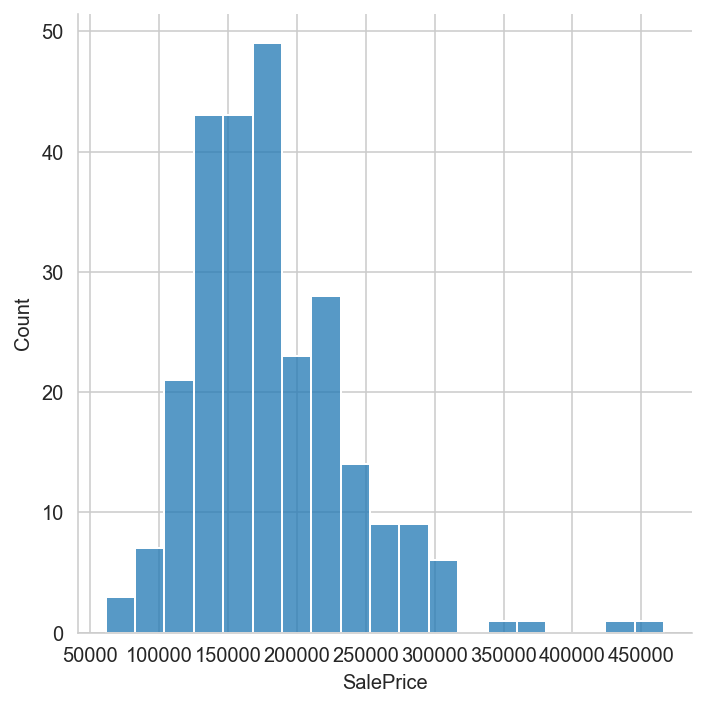

In [28]:
# what is the distribution of SalePrice for the nans - is there a pattern
sns.displot(house[house['LotFrontage'].isna()].SalePrice)

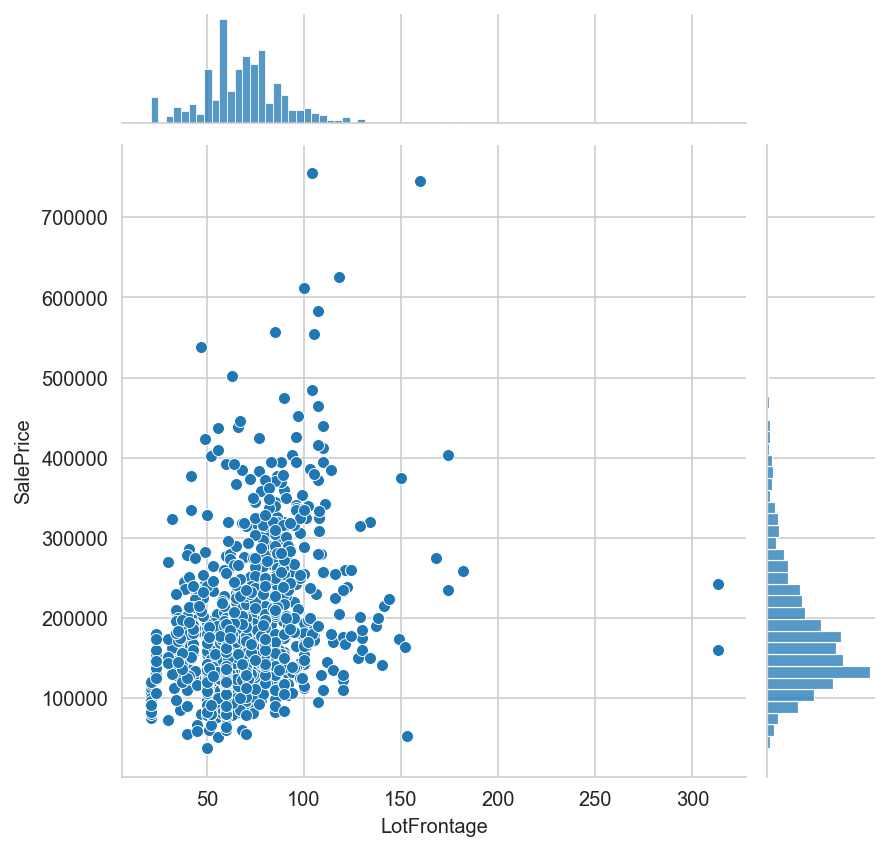

In [29]:
# what is the distribution of SalePrice for LotFrontage values - is there a pattern
sns.jointplot(x=house.LotFrontage, y=house.SalePrice)

## extreme outliers for LotFrontage > 200 - will handle later
## leaving as nan for the moment - will consider to impute or drop later

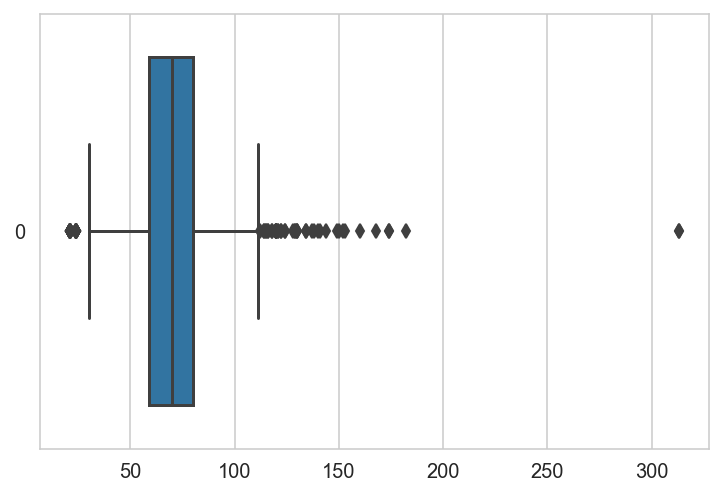

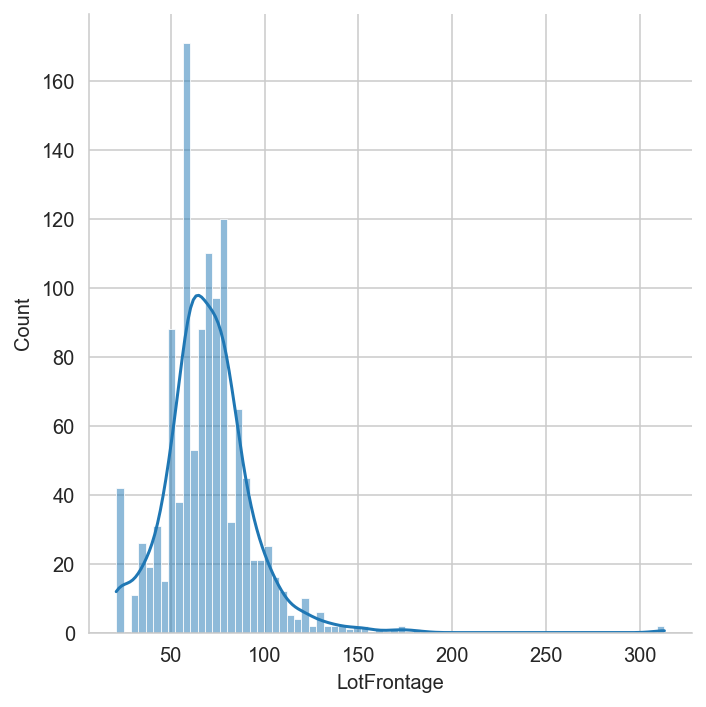

In [30]:
# plot distribution
plot_box_kde('LotFrontage')

##### <span style="color:purple">LotArea</span>


In [31]:
# check column, expecting : continuous
check_column('LotArea')

*** LotArea ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 1300      1
1477      1
1491      1
1526      1
1533      2
         ..
70761     1
115149    1
159000    1
164660    1
215245    1
Name: LotArea, Length: 1070, dtype: int64


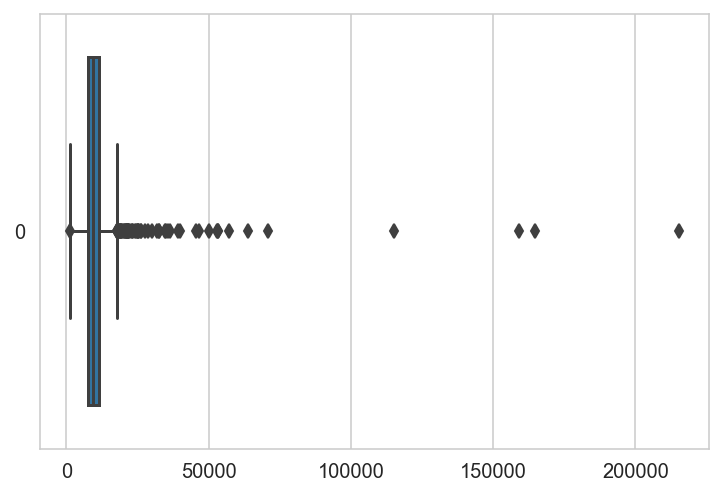

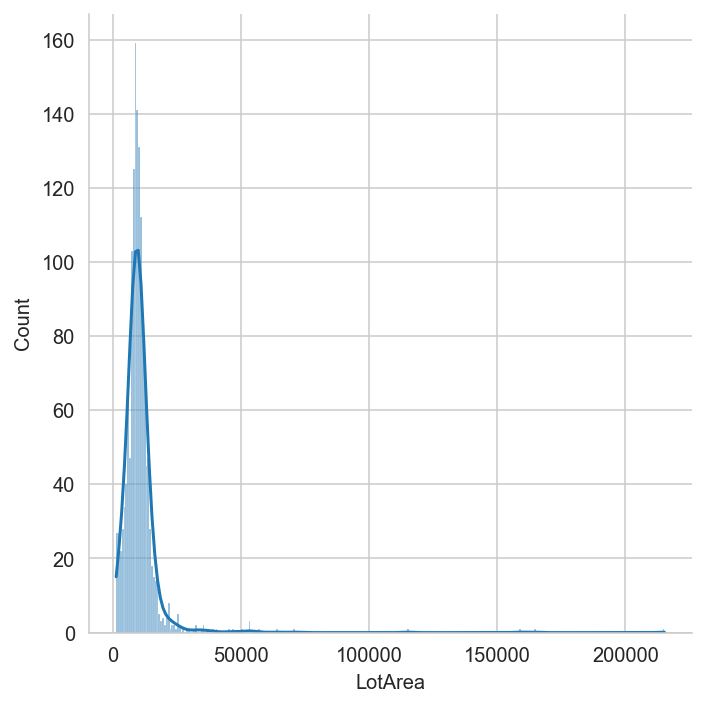

In [32]:
# plot distribution
plot_box_kde('LotArea')

## many outliers, potential extreme outliers LotArea > 100000  - will handle later

##### <span style="color:purple">Street</span>


In [33]:
# check column, expecting : categorical
check_column('Street')

*** Street ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Grvl       4
Pave    1446
Name: Street, dtype: int64


In [34]:
## dtype : ok
## values : ok

##### <span style="color:purple">Alley</span>


In [35]:
# check column, expecting : categorical
check_column('Alley')

*** Alley ***
data type: object
count nulls: 0
count NA: 1361

 value counts:
 Grvl      50
NA      1361
Pave      39
Name: Alley, dtype: int64


In [36]:
## NA is valid value
## dtype : ok
## values : ok

##### <span style="color:purple">LotShape</span>


In [37]:
# check column, expecting : categorical
check_column('LotShape')

*** LotShape ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 IR1    483
IR2     41
IR3     10
Reg    916
Name: LotShape, dtype: int64


In [38]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 4	Reg	Regular
# 3	IR1	Slightly irregular
# 2	IR2	Moderately Irregular
# 1	IR3	Irregular

house.LotShape.replace({'Reg':4, 'IR1':3, 'IR2':2, 'IR3':1}, inplace=True)
house.LotShape.astype('int')
check_column('LotShape')

*** LotShape ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 1     10
2     41
3    483
4    916
Name: LotShape, dtype: int64


##### <span style="color:purple">LandContour</span>


In [39]:
# check column, expecting : categorical
check_column('LandContour')

*** LandContour ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Bnk      62
HLS      49
Low      34
Lvl    1305
Name: LandContour, dtype: int64


In [40]:
## dtype : ok
## values : ok

##### <span style="color:purple">Utilities</span>


In [41]:
# check column, expecting : categorical
check_column('Utilities')

*** Utilities ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 AllPub    1449
NoSeWa       1
Name: Utilities, dtype: int64


In [42]:
## only 2 out of 4 possible categories are used
## majority are of one type - not enough variation to be useful - will handle later

## dtype : ok
## values : ok

##### <span style="color:purple">LotConfig</span>


In [43]:
# check column, expecting : categorical
check_column('LotConfig')

*** LotConfig ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Corner      261
CulDSac      94
FR2          47
FR3           4
Inside     1044
Name: LotConfig, dtype: int64


In [44]:
## dtype : ok
## values : ok

##### <span style="color:purple">LandSlope</span>


In [45]:
# check column, expecting : categorical
check_column('LandSlope')

*** LandSlope ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Gtl    1375
Mod      62
Sev      13
Name: LandSlope, dtype: int64


In [46]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 3	Gtl	Gentle slope
# 2	Mod	Moderate Slope
# 1	Sev	Severe Slope

house.LandSlope.replace({'Sev':1, 'Mod':2, 'Gtl':3}, inplace=True)
house.LandSlope.astype('int')
check_column('LandSlope')

*** LandSlope ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 1      13
2      62
3    1375
Name: LandSlope, dtype: int64


##### <span style="color:purple">Neighborhood</span>


In [47]:
# check column, expecting : categorical
check_column('Neighborhood')

*** Neighborhood ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Blmngtn     17
Blueste      2
BrDale      16
BrkSide     58
ClearCr     28
CollgCr    150
Crawfor     51
Edwards    100
Gilbert     79
IDOTRR      28
MeadowV     17
Mitchel     49
NAmes      225
NPkVill      9
NWAmes      73
NoRidge     41
NridgHt     77
OldTown    112
SWISU       25
Sawyer      74
SawyerW     59
Somerst     86
StoneBr     25
Timber      38
Veenker     11
Name: Neighborhood, dtype: int64


In [48]:
## dtype : ok
## values : look ok

##### <span style="color:purple">Condition1</span>


In [49]:
# check column, expecting : categorical
check_column('Condition1')

*** Condition1 ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Artery      48
Feedr       79
Norm      1252
PosA         8
PosN        19
RRAe        11
RRAn        26
RRNe         2
RRNn         5
Name: Condition1, dtype: int64


In [50]:
## dtype : ok
## values : looks ok - low variability

##### <span style="color:purple">Condition2</span>


In [51]:
# check column, expecting : categorical
check_column('Condition2')

*** Condition2 ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Artery       2
Feedr        5
Norm      1436
PosA         1
PosN         2
RRAe         1
RRAn         1
RRNn         2
Name: Condition2, dtype: int64


In [52]:
## dtype : ok
## values : look ok - low variability

##### <span style="color:purple">BldgType</span>


In [53]:
# check column, expecting : categorical
check_column('BldgType')

*** BldgType ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 1Fam      1211
2fmCon      30
Duplex      52
Twnhs       43
TwnhsE     114
Name: BldgType, dtype: int64


In [54]:
## dtype : ok
## values : looks ok

##### <span style="color:purple">HouseStyle</span>


In [55]:
# check column, expecting : categorical
check_column('HouseStyle')

*** HouseStyle ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 1.5Fin    150
1.5Unf     14
1Story    722
2.5Fin      8
2.5Unf     10
2Story    444
SFoyer     37
SLvl       65
Name: HouseStyle, dtype: int64


In [56]:
## dtype : ok
## values : looks ok

##### <span style="color:purple">OverallQual</span>


In [57]:
# check column, expecting : categorical
check_column('OverallQual')

*** OverallQual ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 1       2
2       2
3      18
4     111
5     396
6     373
7     319
8     168
9      43
10     18
Name: OverallQual, dtype: int64


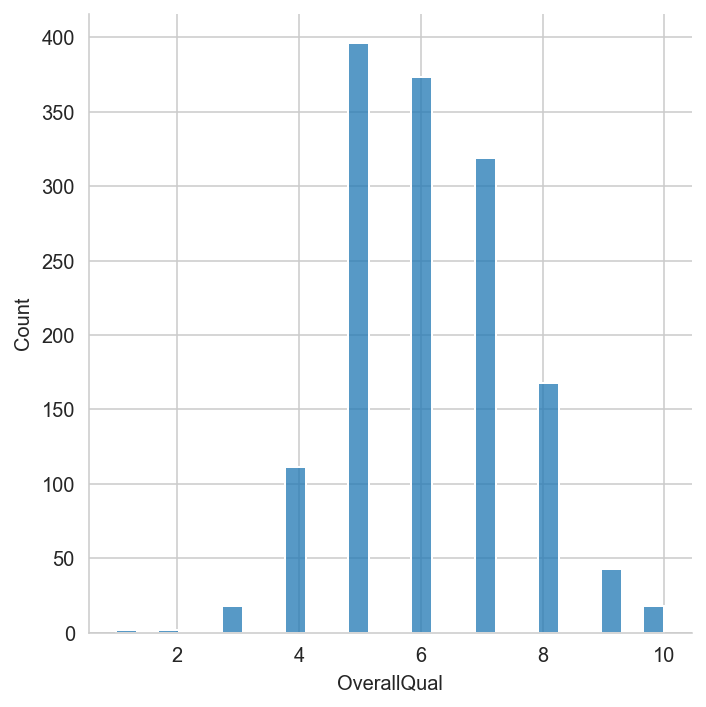

In [58]:
# plot distribution
sns.displot(data=house.OverallQual);

## as expected, peak at average (5)

In [59]:
## dtype : ok
## values : ok, 5=Average

##### <span style="color:purple">OverallCond</span>


In [60]:
# check column, expecting : categorical
check_column('OverallCond')

*** OverallCond ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 1      1
2      4
3     24
4     54
5    819
6    250
7    204
8     72
9     22
Name: OverallCond, dtype: int64


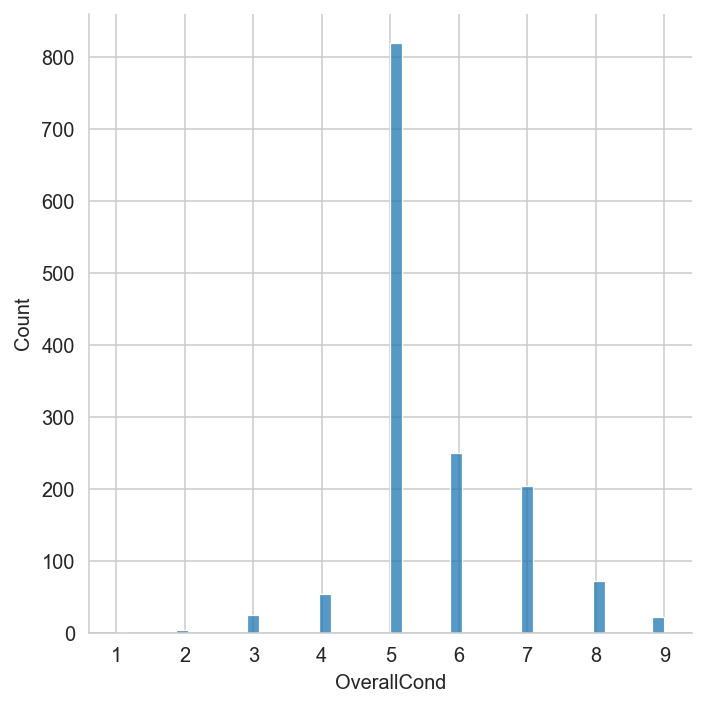

In [61]:
# plot distribution
sns.displot(data=house.OverallCond);

## as expected, peak at average (5)
## peak is almost 3 times higher than next most frequent

In [62]:
## dtype : ok
## values : ok, 5=Average

##### <span style="color:purple">YearBuilt</span>


In [63]:
# check column, expecting : continuous
check_column('YearBuilt')

*** YearBuilt ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 1872     1
1875     1
1880     4
1882     1
1885     2
        ..
2006    67
2007    49
2008    23
2009    18
2010     1
Name: YearBuilt, Length: 112, dtype: int64


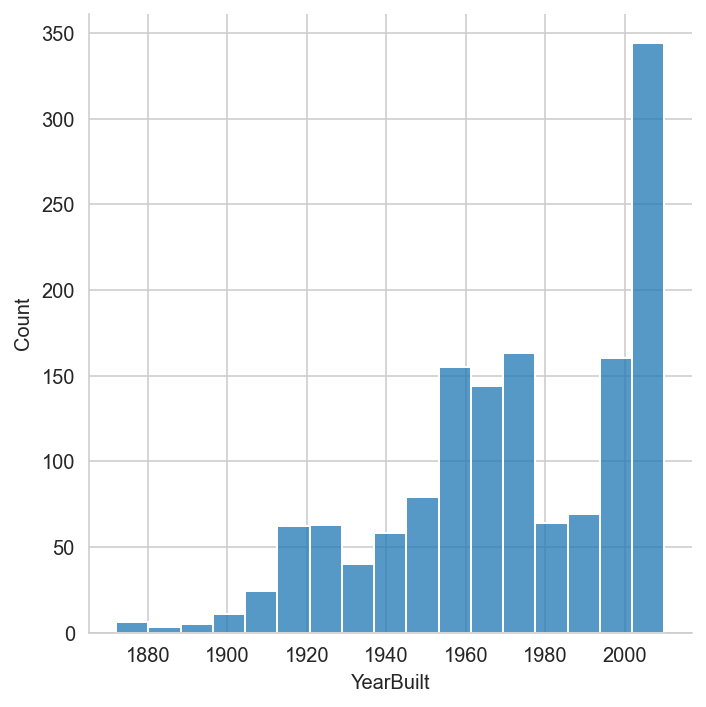

In [64]:
# plot distribution
sns.displot(data=house.YearBuilt);

## peaks around 1920, 1960 and post-2000
## potentially correlated with country's economic boom periods

In [65]:
## dtype : ok
## values : ok

##### <span style="color:purple">YearRemodAdd</span>


In [66]:
# check column, expecting : continuous
check_column('YearRemodAdd')

*** YearRemodAdd ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 1950    171
1951      4
1952      4
1953     10
1954     14
       ... 
2006     97
2007     76
2008     40
2009     23
2010      6
Name: YearRemodAdd, Length: 61, dtype: int64


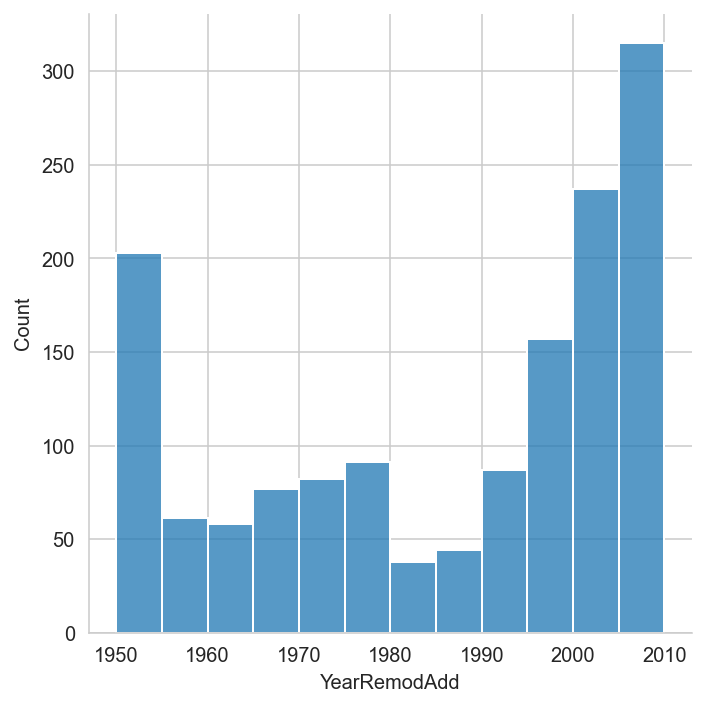

In [67]:
# plot distribution
sns.displot(data=house.YearRemodAdd);

In [68]:
## dtype : ok
## values : okish. Spike at 1950 looks like an import dump

##### <span style="color:purple">RoofStyle</span>


In [69]:
# check column, expecting : categorical
check_column('RoofStyle')

*** RoofStyle ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Flat         13
Gable      1135
Gambrel      10
Hip         283
Mansard       7
Shed          2
Name: RoofStyle, dtype: int64


In [70]:
## dtype : ok
## values : ok

##### <span style="color:purple">RoofMatl</span>


In [71]:
# check column, expecting : categorical
check_column('RoofMatl')

*** RoofMatl ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 ClyTile       1
CompShg    1424
Membran       1
Metal         1
Roll          1
Tar&Grv      11
WdShake       5
WdShngl       6
Name: RoofMatl, dtype: int64


In [72]:
## dtype : ok
## values : ok

##### <span style="color:purple">Exterior1st</span>


In [73]:
# check column, expecting : categorical
check_column('Exterior1st')

*** Exterior1st ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 AsbShng     19
AsphShn      1
BrkComm      2
BrkFace     49
CBlock       1
CemntBd     61
HdBoard    222
ImStucc      1
MetalSd    215
Plywood    107
Stone        2
Stucco      25
VinylSd    515
Wd Sdng    204
WdShing     26
Name: Exterior1st, dtype: int64


In [74]:
## dtype : ok
## values : ok

##### <span style="color:purple">Exterior2nd</span>


In [75]:
# check column, expecting : categorical
check_column('Exterior2nd')

*** Exterior2nd ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 AsbShng     19
AsphShn      3
Brk Cmn      7
BrkFace     24
CBlock       1
CmentBd     60
HdBoard    207
ImStucc     10
MetalSd    209
Other        1
Plywood    141
Stone        5
Stucco      26
VinylSd    504
Wd Sdng    195
Wd Shng     38
Name: Exterior2nd, dtype: int64


In [76]:
## dtype : ok
## values : ok

##### <span style="color:purple">MasVnrType</span>


In [77]:
# check column, expecting : categorical
check_column('MasVnrType')

*** MasVnrType ***
data type: object
count nulls: 0
count NA: 8

 value counts:
 BrkCmn      15
BrkFace    445
NA           8
None       854
Stone      128
Name: MasVnrType, dtype: int64


In [78]:
# change in-valid 'NA' to 'None'
house.MasVnrType.replace(to_replace='NA', value='None', inplace=True)
check_column('MasVnrType')

*** MasVnrType ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 BrkCmn      15
BrkFace    445
None       862
Stone      128
Name: MasVnrType, dtype: int64


##### <span style="color:purple">MasVnrArea</span>


In [79]:
# check column, expecting : continuous
check_column('MasVnrArea')

*** MasVnrArea ***
data type: object
count nulls: 0
count NA: 8

 value counts:
 0      851
1        2
100      4
101      2
102      1
      ... 
97       1
975      1
98       2
99       3
NA       8
Name: MasVnrArea, Length: 328, dtype: int64


In [80]:
# change 'NA' to zero & column to int
column_NA_replace_dtype('MasVnrArea', 0, 'int')

*** MasVnrArea ***
data type: int32
count nulls: 0
count NA: 0

 value counts:
 0       859
1         2
11        1
14        1
16        7
       ... 
1115      1
1129      1
1170      1
1378      1
1600      1
Name: MasVnrArea, Length: 327, dtype: int64


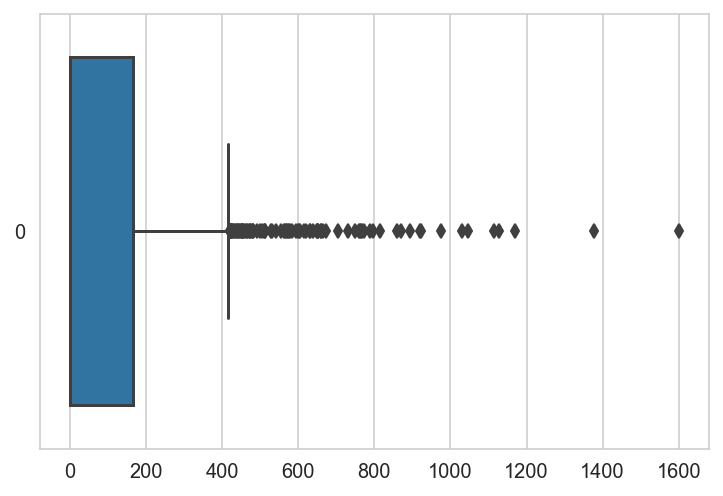

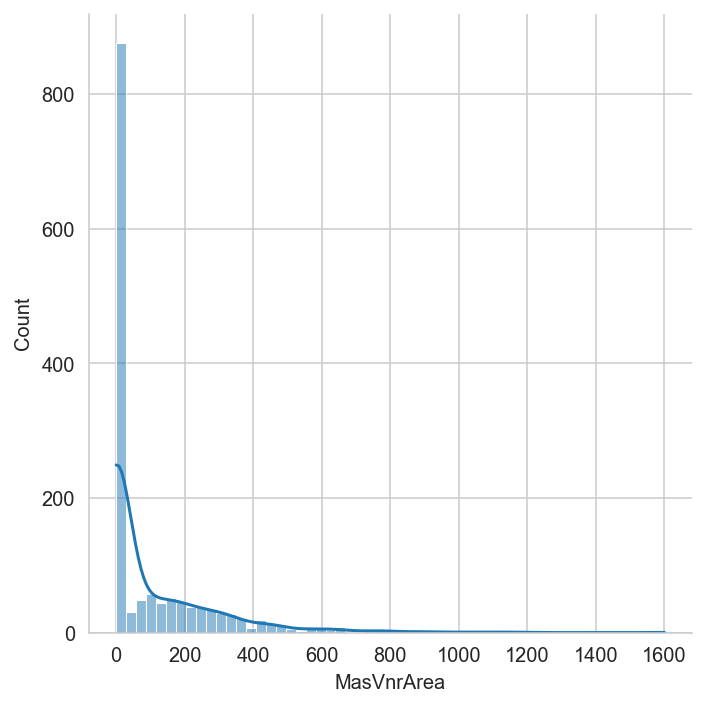

In [81]:
# plot distribution
plot_box_kde('MasVnrArea')

##### <span style="color:purple">ExterQual</span>


In [82]:
# check column, expecting : categorical
check_column('ExterQual')

*** ExterQual ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Ex     52
Fa     11
Gd    488
TA    899
Name: ExterQual, dtype: int64


In [83]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 5	Ex	Excellent
# 4	Gd	Good
# 3	TA	Average/Typical
# 2	Fa	Fair
# 1	Po	Poor

house.ExterQual.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, inplace=True)
house.ExterQual.astype('int')
check_column('ExterQual')

*** ExterQual ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 2     11
3    899
4    488
5     52
Name: ExterQual, dtype: int64


##### <span style="color:purple">ExterCond</span>


In [84]:
# check column, expecting : categorical
check_column('ExterCond')

*** ExterCond ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Ex       3
Fa      26
Gd     145
Po       1
TA    1275
Name: ExterCond, dtype: int64


In [85]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 5	Ex	Excellent
# 4	Gd	Good
# 3	TA	Average/Typical
# 2	Fa	Fair
# 1	Po	Poor

house.ExterCond.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, inplace=True)
house.ExterCond.astype('int')
check_column('ExterCond')


*** ExterCond ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 1       1
2      26
3    1275
4     145
5       3
Name: ExterCond, dtype: int64


##### <span style="color:purple">Foundation</span>


In [86]:
# check column, expecting : categorical
check_column('Foundation')

*** Foundation ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 BrkTil    144
CBlock    627
PConc     647
Slab       24
Stone       5
Wood        3
Name: Foundation, dtype: int64


In [87]:
## dtype : ok
## values : ok

##### <span style="color:purple">BsmtQual</span>


In [88]:
# check column, expecting : categorical
check_column('BsmtQual')

*** BsmtQual ***
data type: object
count nulls: 0
count NA: 37

 value counts:
 Ex    121
Fa     35
Gd    618
NA     37
TA    639
Name: BsmtQual, dtype: int64


In [89]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 5	Ex	Excellent (100+ inches)
# 4	Gd	Good (90-99 inches)
# 3	TA	Typical (80-89 inches)
# 2	Fa	Fair (70-79 inches)
# 1	Po	Poor (<70 inches
# 0	NA	No Basement

house.BsmtQual.replace({'NA':0, 'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, 
                       inplace=True)
house.BsmtQual.astype('int')
check_column('BsmtQual')


*** BsmtQual ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0     37
2     35
3    639
4    618
5    121
Name: BsmtQual, dtype: int64


##### <span style="color:purple">BsmtCond</span>


In [90]:
# check column, expecting : categorical
check_column('BsmtCond')

*** BsmtCond ***
data type: object
count nulls: 0
count NA: 37

 value counts:
 Fa      43
Gd      65
NA      37
Po       2
TA    1303
Name: BsmtCond, dtype: int64


In [91]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 5	Ex	Excellent
# 4	Gd	Good
# 3	TA	Typical - slight dampness allowed
# 2	Fa	Fair - dampness or some cracking or settling
# 1	Po	Poor - Severe cracking, settling, or wetness
# 0	NA	No Basement

house.BsmtCond.replace({'NA':0, 'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, 
                       inplace=True)
house.BsmtCond.astype('int')
check_column('BsmtCond')

*** BsmtCond ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      37
1       2
2      43
3    1303
4      65
Name: BsmtCond, dtype: int64


##### <span style="color:purple">BsmtExposure</span>


In [92]:
# check column, expecting : categorical
check_column('BsmtExposure')

*** BsmtExposure ***
data type: object
count nulls: 0
count NA: 38

 value counts:
 Av    219
Gd    134
Mn    112
NA     38
No    947
Name: BsmtExposure, dtype: int64


In [93]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 4	Gd	Good Exposure
# 3	Av	Average Exposure (split levels or foyers typically score average or above)
# 2	Mn	Mimimum Exposure
# 1	No	No Exposure
# 0	NA	No Basement

house.BsmtExposure.replace({'NA':0, 'No':1, 'Mn':2, 'Av':3, 'Gd':4}, inplace=True)
house.BsmtExposure.astype('int')
check_column('BsmtExposure')


*** BsmtExposure ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0     38
1    947
2    112
3    219
4    134
Name: BsmtExposure, dtype: int64


##### <span style="color:purple">BsmtFinType1</span>


In [94]:
# check column, expecting : categorical
check_column('BsmtFinType1')

*** BsmtFinType1 ***
data type: object
count nulls: 0
count NA: 37

 value counts:
 ALQ    220
BLQ    147
GLQ    418
LwQ     74
NA      37
Rec    130
Unf    424
Name: BsmtFinType1, dtype: int64


In [95]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 6	GLQ	Good Living Quarters
# 5	ALQ	Average Living Quarters
# 4	BLQ	Below Average Living Quarters
# 3	Rec	Average Rec Room
# 2	LwQ	Low Quality
# 1	Unf	Unfinshed
# 0	NA	No Basement

house.BsmtFinType1.replace({'NA':0, 'Unf':1, 'LwQ':2, 'Rec':3, 'BLQ':4, 'ALQ':5, 'GLQ':6}, 
                       inplace=True)
house.BsmtFinType1.astype('int')
check_column('BsmtFinType1')


*** BsmtFinType1 ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0     37
1    424
2     74
3    130
4    147
5    220
6    418
Name: BsmtFinType1, dtype: int64


##### <span style="color:purple">BsmtFinSF1</span>


In [96]:
# check column, expecting : continuous
check_column('BsmtFinSF1')

*** BsmtFinSF1 ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0       461
2         1
16        9
20        5
24       12
       ... 
1904      1
2096      1
2188      1
2260      1
5644      1
Name: BsmtFinSF1, Length: 636, dtype: int64


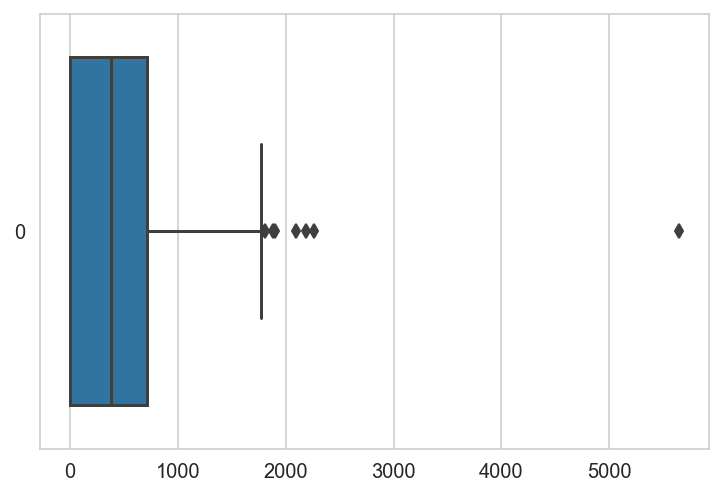

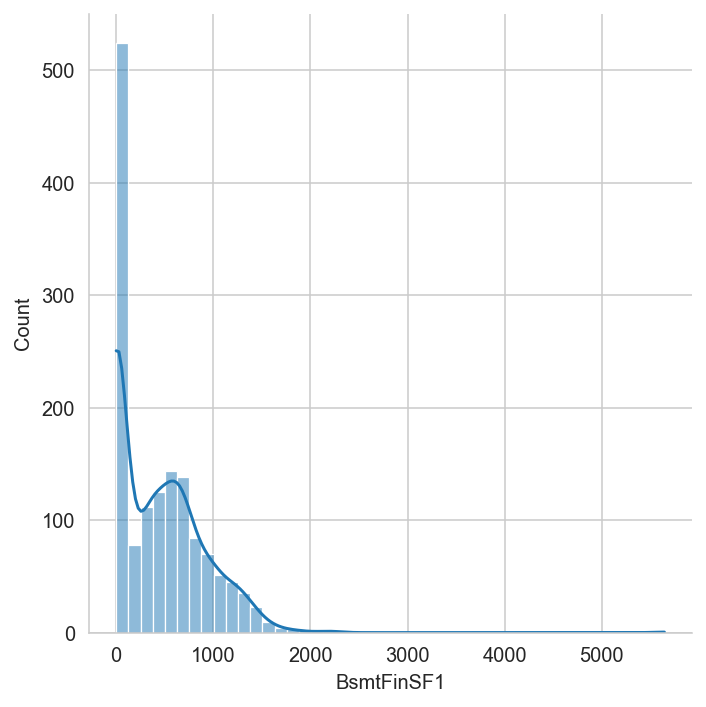

In [97]:
# plot distribution
plot_box_kde('BsmtFinSF1')

## extreme outlier at BsmtFinSF1 >3000 - will handle later

In [98]:
## dtype : ok
## values : ok

##### <span style="color:purple">BsmtFinType2</span>


In [99]:
# check column, expecting : categorical
check_column('BsmtFinType2')

*** BsmtFinType2 ***
data type: object
count nulls: 0
count NA: 38

 value counts:
 ALQ      19
BLQ      33
GLQ      14
LwQ      46
NA       38
Rec      54
Unf    1246
Name: BsmtFinType2, dtype: int64


In [100]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 6	GLQ	Good Living Quarters
# 5	ALQ	Average Living Quarters
# 4	BLQ	Below Average Living Quarters
# 3	Rec	Average Rec Room
# 2	LwQ	Low Quality
# 1	Unf	Unfinshed
# 0	NA	No Basement

house.BsmtFinType2.replace({'NA':0, 'Unf':1, 'LwQ':2, 'Rec':3, 'BLQ':4, 'ALQ':5, 'GLQ':6}, 
                       inplace=True)
house.BsmtFinType2.astype('int')
check_column('BsmtFinType2')


*** BsmtFinType2 ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      38
1    1246
2      46
3      54
4      33
5      19
6      14
Name: BsmtFinType2, dtype: int64


##### <span style="color:purple">BsmtFinSF2</span>


In [101]:
# check column, expecting : continuous
check_column('BsmtFinSF2')

*** BsmtFinSF2 ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0       1283
28         1
32         1
35         1
40         1
        ... 
1080       1
1085       1
1120       1
1127       1
1474       1
Name: BsmtFinSF2, Length: 144, dtype: int64


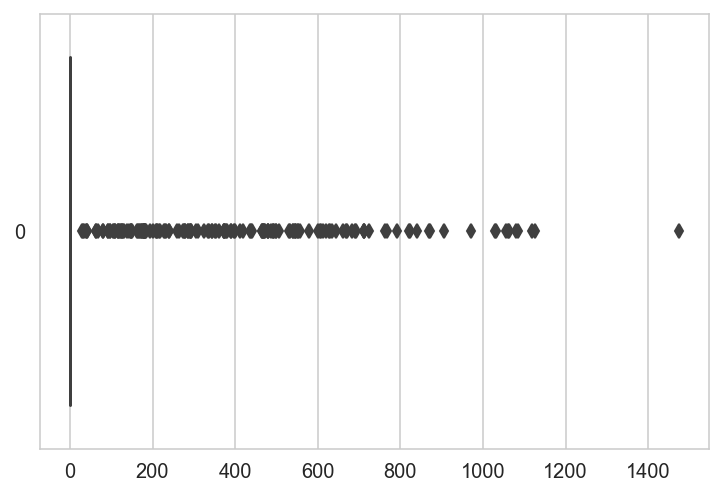

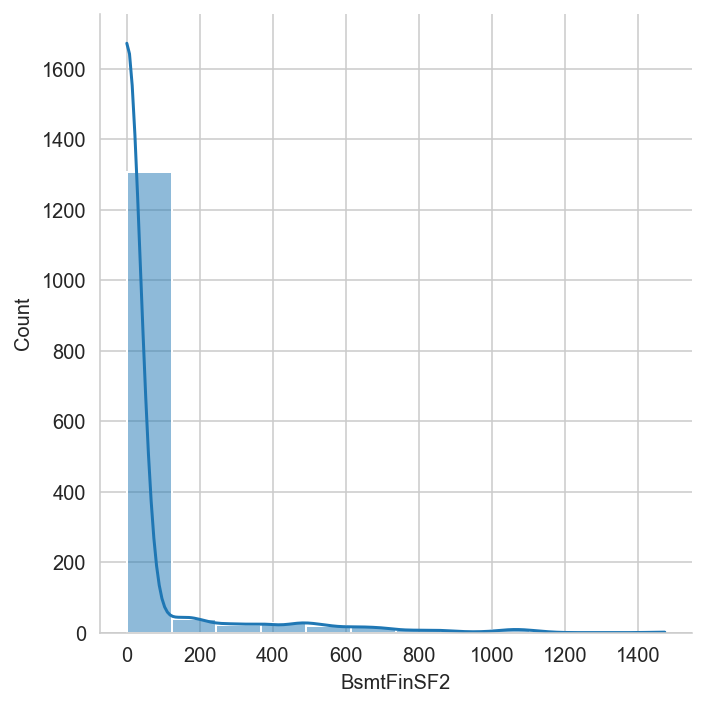

In [102]:
# plot distribution
plot_box_kde('BsmtFinSF2')

##### <span style="color:purple">BsmtUnfSF</span>


In [103]:
# check column, expecting : continuous
check_column('BsmtUnfSF')

*** BsmtUnfSF ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0       117
14        1
15        1
23        2
26        1
       ... 
2042      1
2046      1
2121      1
2153      1
2336      1
Name: BsmtUnfSF, Length: 776, dtype: int64


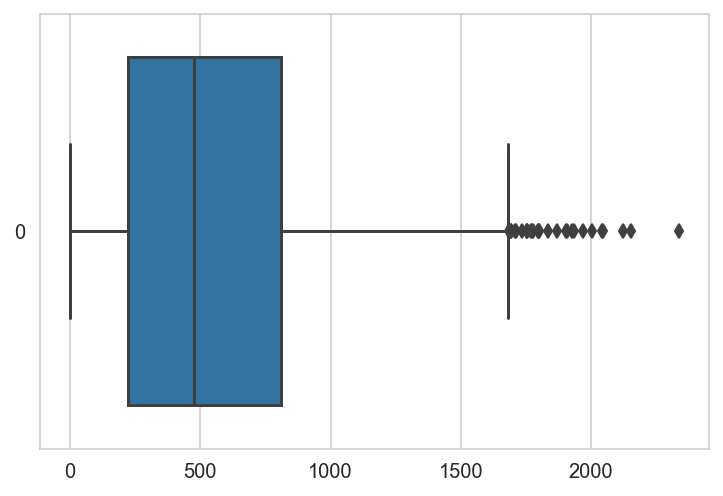

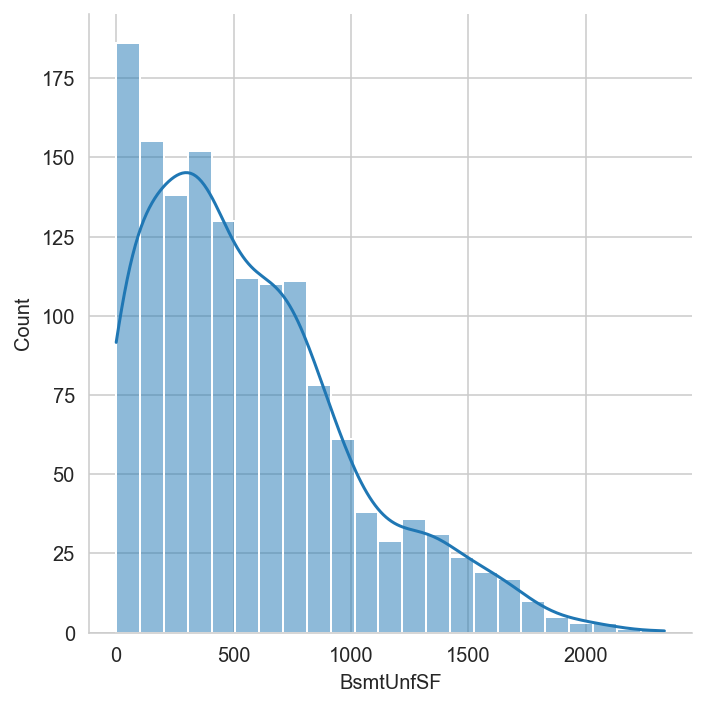

In [104]:
# plot distribution
plot_box_kde('BsmtUnfSF')

##### <span style="color:purple">TotalBsmtSF</span>


In [105]:
# check column, expecting : continuous
check_column('TotalBsmtSF')

*** TotalBsmtSF ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0       37
105      1
190      1
264      3
270      1
        ..
3094     1
3138     1
3200     1
3206     1
6110     1
Name: TotalBsmtSF, Length: 719, dtype: int64


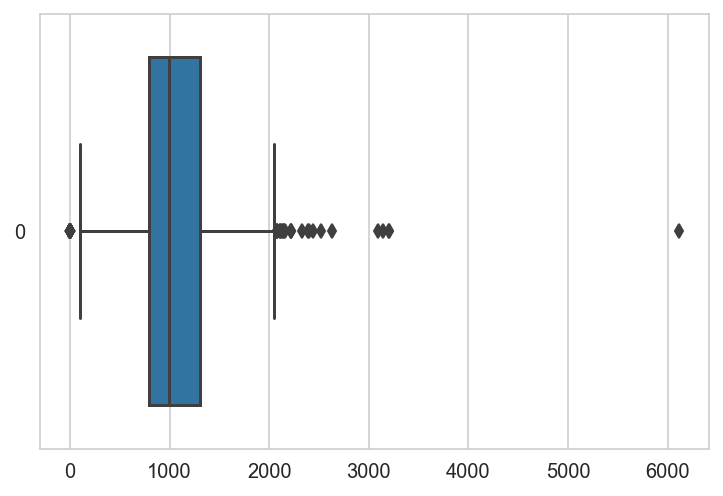

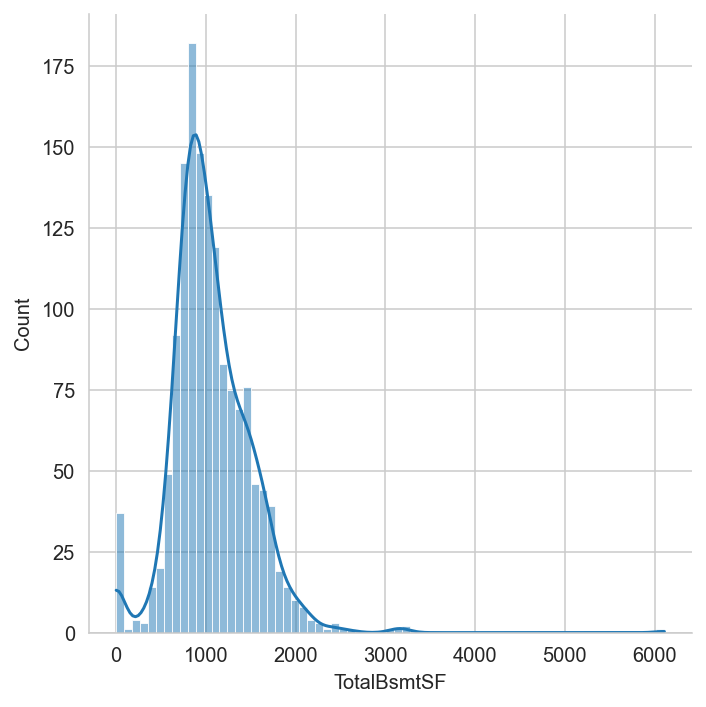

In [106]:
# plot distribution
plot_box_kde('TotalBsmtSF')

## extreme outlier, TotalBsmtSF > 4000 - will deal with later

##### <span style="color:purple">Heating</span>


In [107]:
# check column, expecting : categorical
check_column('Heating')

*** Heating ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Floor       1
GasA     1419
GasW       17
Grav        7
OthW        2
Wall        4
Name: Heating, dtype: int64


In [108]:
## dtype : ok
## values : ok

##### <span style="color:purple">HeatingQC</span>


In [109]:
# check column, expecting : categorical
check_column('HeatingQC')

*** HeatingQC ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Ex    740
Fa     49
Gd    239
Po      1
TA    421
Name: HeatingQC, dtype: int64


In [110]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 5	Ex	Excellent
# 4	Gd	Good
# 3	TA	Average/Typical
# 2	Fa	Fair
# 1	Po	Poor

house.HeatingQC.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, inplace=True)
house.HeatingQC.astype('int')
check_column('HeatingQC')


*** HeatingQC ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 1      1
2     49
3    421
4    239
5    740
Name: HeatingQC, dtype: int64


##### <span style="color:purple">CentralAir</span>


In [111]:
# check column, expecting : categorical
check_column('CentralAir')

*** CentralAir ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 N      89
Y    1361
Name: CentralAir, dtype: int64


In [112]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

house.CentralAir.replace({'N':0, 'Y':1}, inplace=True)
house.CentralAir.astype('int')
check_column('CentralAir')


*** CentralAir ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      89
1    1361
Name: CentralAir, dtype: int64


##### <span style="color:purple">Electrical</span>


In [113]:
# check column, expecting : categorical
check_column('Electrical')

*** Electrical ***
data type: object
count nulls: 0
count NA: 1

 value counts:
 FuseA      90
FuseF      27
FuseP       3
Mix         1
NA          1
SBrkr    1328
Name: Electrical, dtype: int64


In [114]:
# change in-valid 'NA' to null
house.Electrical.replace(to_replace='NA', value=np.nan, inplace=True)
check_column('Electrical')

*** Electrical ***
data type: object
count nulls: 1
count NA: 0

 value counts:
 FuseA      90
FuseF      27
FuseP       3
Mix         1
SBrkr    1328
Name: Electrical, dtype: int64


##### <span style="color:purple">1stFlrSF</span>


In [115]:
# check column, expecting : continuous
check_column('1stFlrSF')

*** 1stFlrSF ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 334     1
372     1
438     1
483     7
495     1
       ..
2633    1
2898    1
3138    1
3228    1
4692    1
Name: 1stFlrSF, Length: 746, dtype: int64


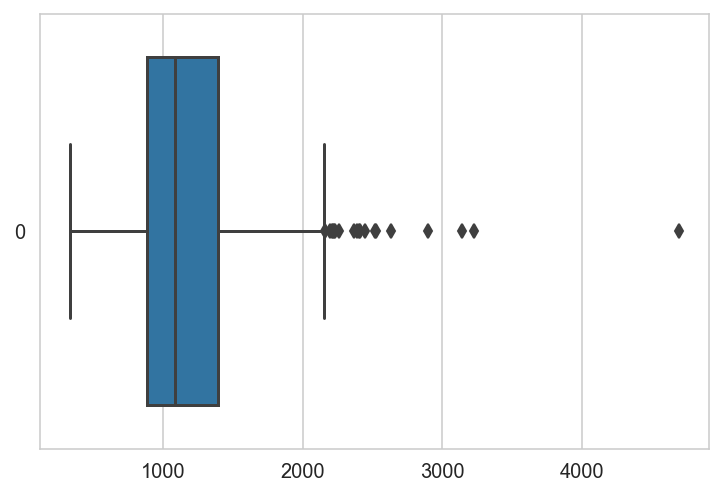

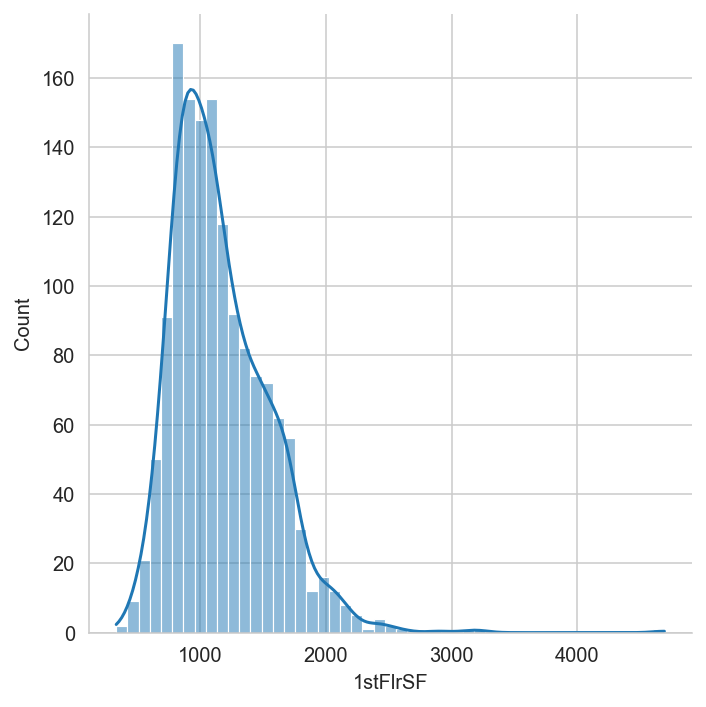

In [116]:
# plot distribution
plot_box_kde('1stFlrSF')

## extreme outlier, 1stFlrSF > 4000 - will deal with later

##### <span style="color:purple">2ndFlrSF</span>


In [117]:
# check column, expecting : continuous
check_column('2ndFlrSF')

*** 2ndFlrSF ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0       824
110       1
167       1
192       1
208       1
       ... 
1611      1
1796      1
1818      1
1872      1
2065      1
Name: 2ndFlrSF, Length: 413, dtype: int64


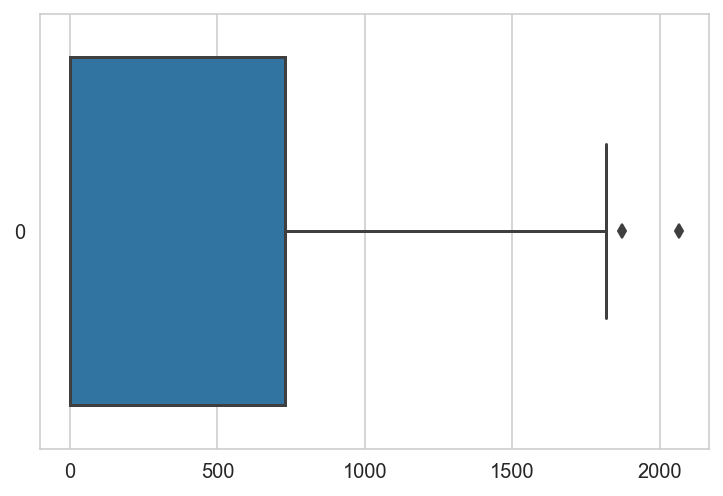

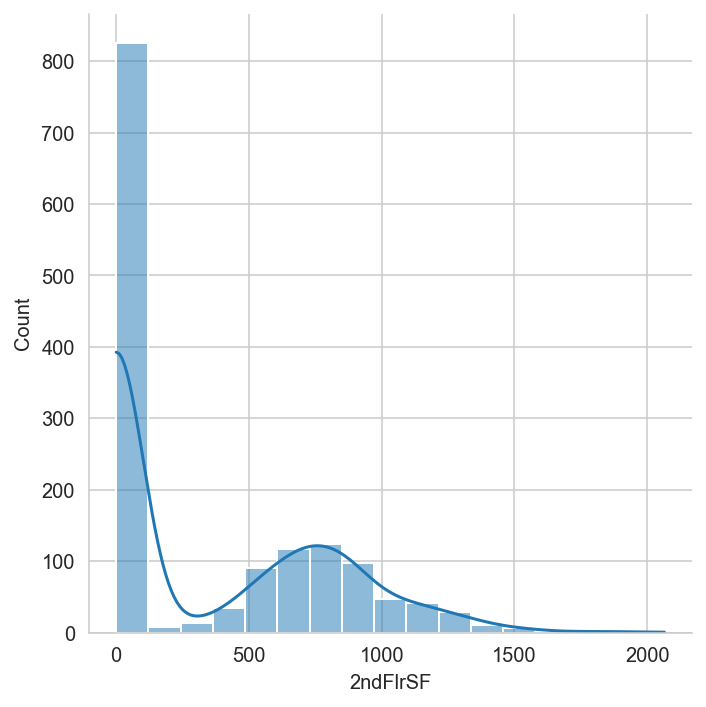

In [118]:
# plot distribution
plot_box_kde('2ndFlrSF')

## zeros are places without a second floor

##### <span style="color:purple">LowQualFinSF</span>


In [119]:
# check column, expecting : continuous
check_column('LowQualFinSF')

*** LowQualFinSF ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      1425
53        1
80        3
120       1
144       1
156       1
205       1
232       1
234       1
360       2
371       1
384       1
390       1
392       1
397       1
420       1
473       1
479       1
481       1
514       1
515       1
528       1
572       1
Name: LowQualFinSF, dtype: int64


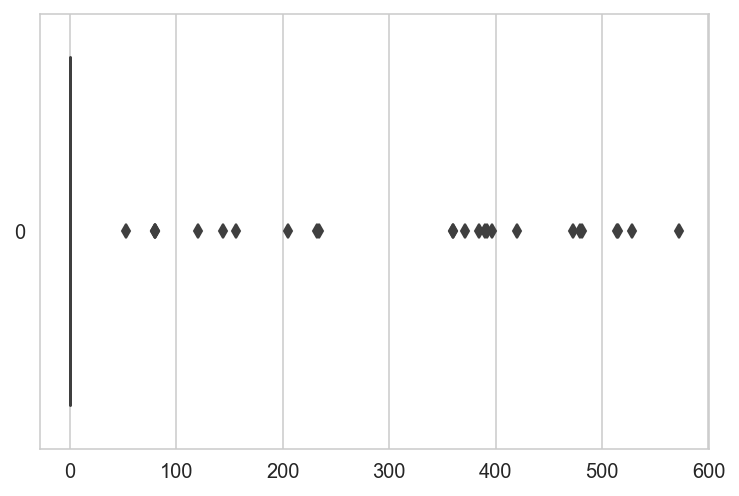

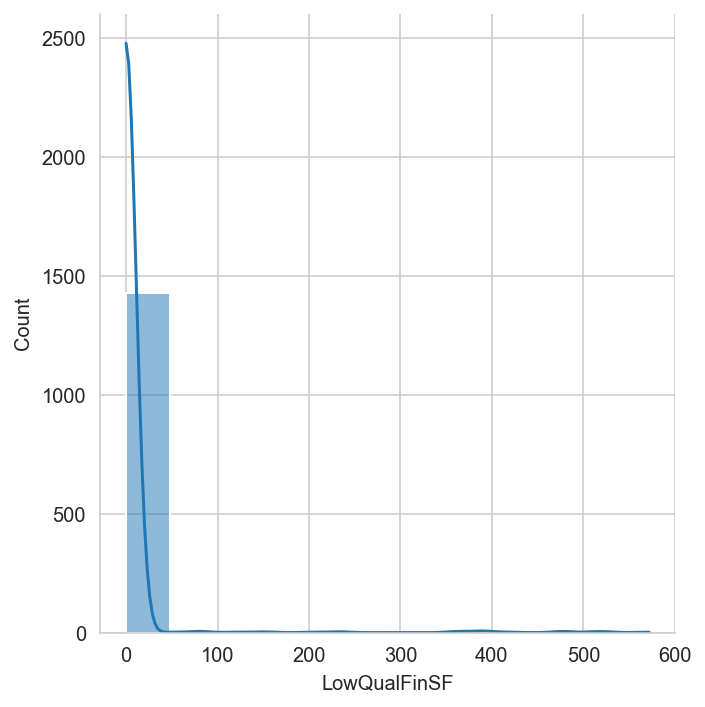

In [120]:
# plot distribution
plot_box_kde('LowQualFinSF')

## it's all outliers - leave as is

##### <span style="color:purple">GrLivArea</span>


In [121]:
# check column, expecting : continuous
check_column('GrLivArea')

*** GrLivArea ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 334     1
438     1
520     1
605     1
616     1
       ..
3627    1
4316    1
4476    1
4676    1
5642    1
Name: GrLivArea, Length: 858, dtype: int64


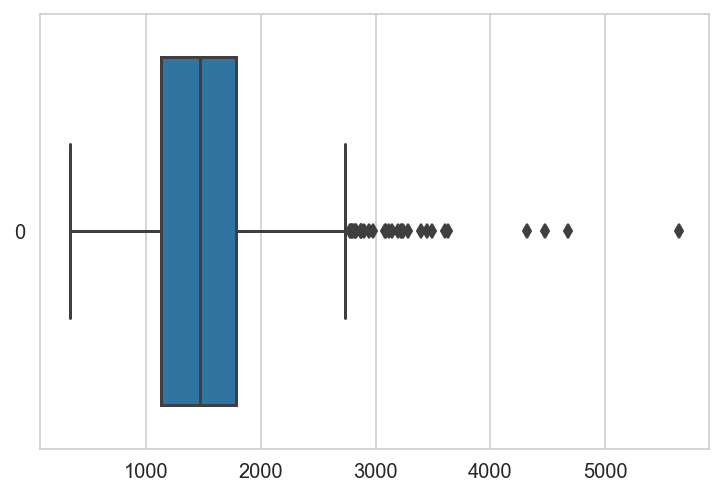

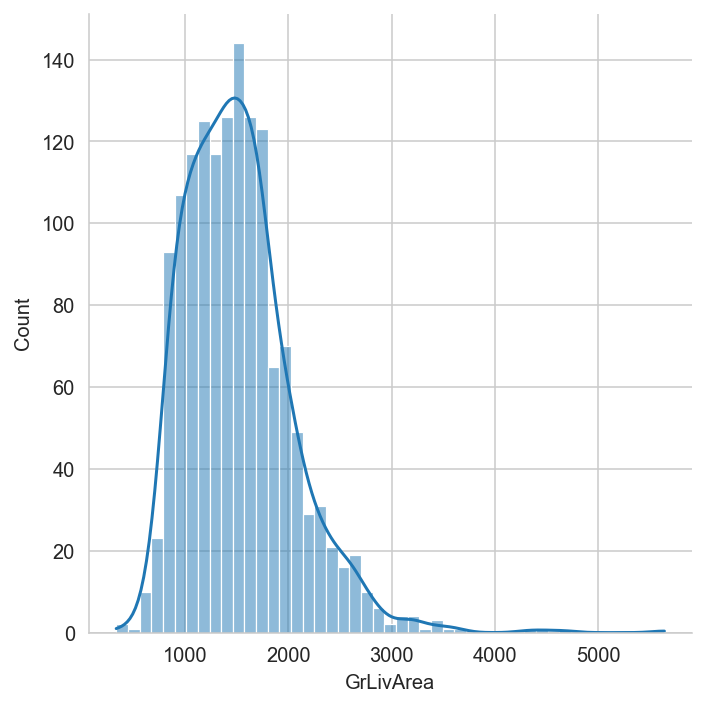

In [122]:
# plot distribution
plot_box_kde('GrLivArea')

## GrLivArea has many outliers, two groups of potential extreme outliers: between 4-5k & >5k

##### <span style="color:purple">BsmtFullBath</span>


In [123]:
# check column, expecting : integer
check_column('BsmtFullBath')

*** BsmtFullBath ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0    847
1    587
2     15
3      1
Name: BsmtFullBath, dtype: int64


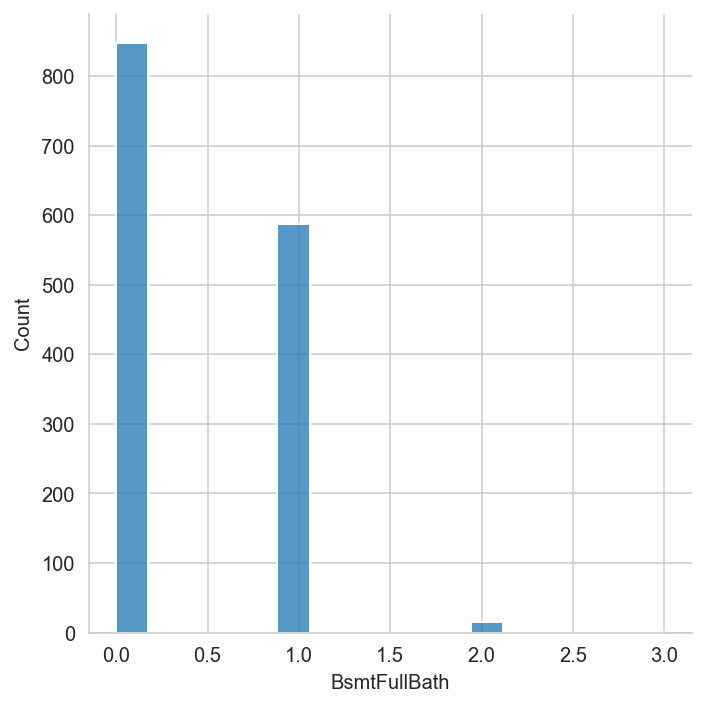

In [124]:
# plot distribution
sns.displot(data=house.BsmtFullBath);

In [125]:
## dtype : ok
## values : ok - not everyone is going to have a bathroom in their basement, especially if they don't have a basement

##### <span style="color:purple">BsmtHalfBath</span>


In [126]:
# check column, expecting : integer
check_column('BsmtHalfBath')

*** BsmtHalfBath ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0    1369
1      79
2       2
Name: BsmtHalfBath, dtype: int64


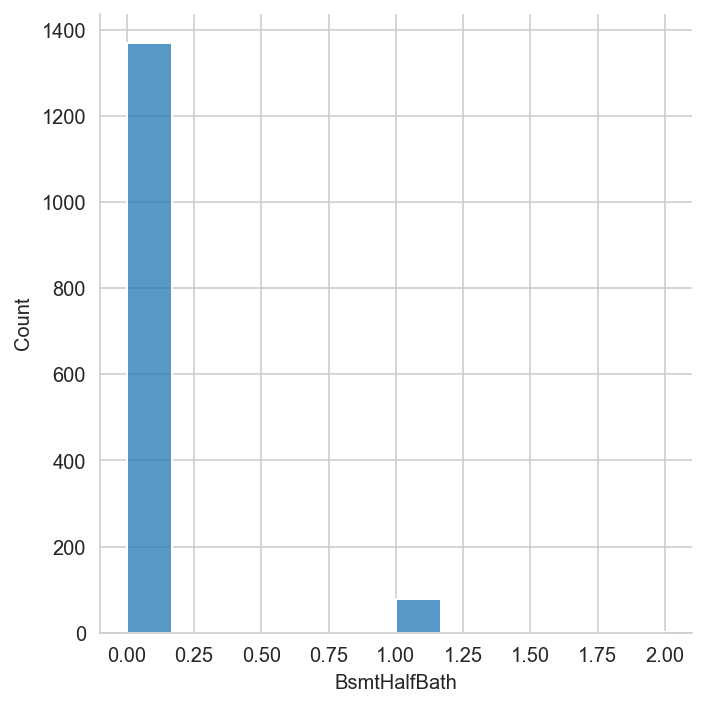

In [127]:
# plot distribution
sns.displot(data=house.BsmtHalfBath);

In [128]:
## dtype : ok
## values : ok - not everyone is going to have a bathroom in their basement, especially if they don't have a basement


##### <span style="color:purple">FullBath</span>


In [129]:
# check column, expecting : integer
check_column('FullBath')

*** FullBath ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      8
1    642
2    767
3     33
Name: FullBath, dtype: int64


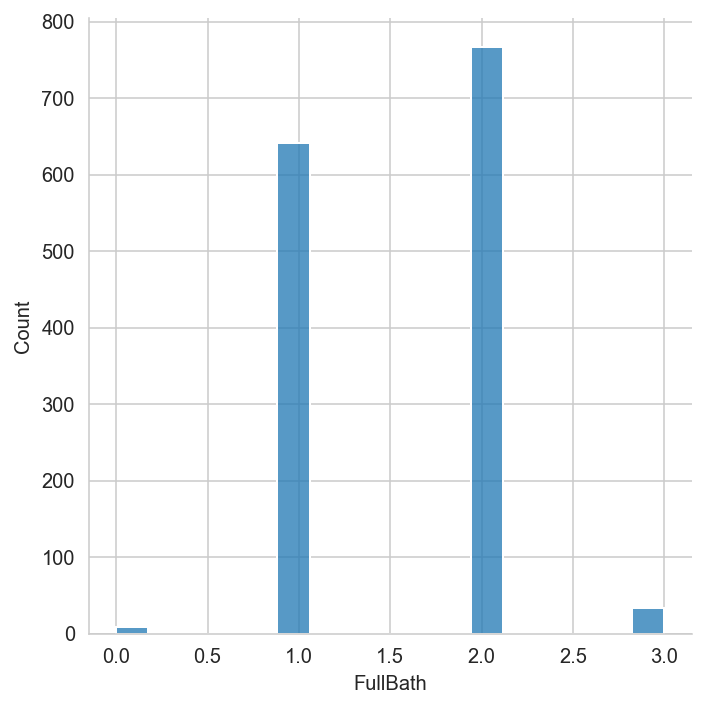

In [130]:
# plot distribution
sns.displot(data=house.FullBath);

In [131]:
# what houses don't have a bathroom?

house[house.FullBath ==0]

## houses that have a half-bath, or bathrooms in their basement

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
53,54,20,RL,68.0,50271,Pave,NA,3,Low,AllPub,Inside,3,Veenker,Norm,Norm,1Fam,1Story,9,5,1981,1987,Gable,WdShngl,WdShing,Wd Shng,None,0,4,3,CBlock,5,3,4,6,1810,1,0,32,1842,GasA,4,1,SBrkr,1842,0,0,1842,2,0,0,1,0,1,Gd,5,Typ,1,Gd,Attchd,1981,Fin,3,894,TA,TA,Y,857,72,0,0,0,0,NA,NA,NA,0,11,2006,WD,Normal,385000
188,189,90,RL,64.0,7018,Pave,NA,4,Bnk,AllPub,Inside,3,SawyerW,Feedr,Norm,Duplex,SFoyer,5,5,1979,1979,Gable,CompShg,Plywood,Plywood,Stone,275,3,3,CBlock,4,3,3,6,1086,1,0,0,1086,GasA,3,1,SBrkr,1224,0,0,1224,2,0,0,2,2,2,TA,6,Typ,2,TA,Detchd,1979,Unf,2,528,TA,TA,Y,120,0,0,0,0,0,NA,NA,NA,0,6,2009,WD,Alloca,153337
375,376,30,RL,NaN,10020,Pave,NA,3,Low,AllPub,Inside,1,Edwards,Norm,Norm,1Fam,1Story,1,1,1922,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0,2,2,BrkTil,2,1,4,4,350,1,0,333,683,GasA,4,0,FuseA,904,0,0,904,1,0,0,1,1,1,Fa,4,Maj1,0,NA,NA,NA,NA,0,0,NA,NA,Y,0,0,0,0,0,0,NA,NA,NA,0,3,2009,WD,Normal,61000
597,598,120,RL,53.0,3922,Pave,NA,4,Lvl,AllPub,Inside,3,Blmngtn,Norm,Norm,TwnhsE,1Story,7,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,BrkFace,72,4,3,PConc,5,3,3,1,0,1,0,1258,1258,GasA,5,1,SBrkr,1402,0,0,1402,0,2,0,2,2,1,Gd,7,Typ,1,Gd,Attchd,2006,Fin,3,648,TA,TA,Y,120,16,0,0,0,0,NA,NA,NA,0,2,2007,New,Partial,194201
634,635,90,RL,64.0,6979,Pave,NA,4,Lvl,AllPub,Inside,3,OldTown,Norm,Norm,Duplex,SFoyer,6,5,1980,1980,Gable,CompShg,Plywood,Plywood,None,0,3,3,CBlock,3,3,1,6,1056,1,0,0,1056,GasA,4,1,SBrkr,1056,0,0,1056,2,0,0,0,0,2,TA,4,Typ,0,NA,Detchd,1980,Unf,2,576,TA,TA,Y,264,56,0,0,0,0,NA,GdPrv,Shed,600,6,2010,WD,Normal,144000
1163,1164,90,RL,60.0,12900,Pave,NA,4,Lvl,AllPub,Inside,3,Sawyer,Feedr,Norm,Duplex,SFoyer,4,4,1969,1969,Gable,CompShg,Plywood,Plywood,None,0,3,3,CBlock,4,3,3,6,1198,1,0,0,1198,GasA,3,1,SBrkr,1258,0,0,1258,2,0,0,2,0,2,TA,6,Typ,0,NA,CarPort,1969,Unf,2,400,Fa,TA,Y,120,0,0,0,0,0,NA,NA,NA,0,1,2008,WD,Alloca,108959
1213,1214,80,RL,NaN,10246,Pave,NA,3,Lvl,AllPub,CulDSac,3,Sawyer,Norm,Norm,1Fam,SLvl,4,9,1965,2001,Gable,CompShg,VinylSd,VinylSd,None,0,3,4,CBlock,3,4,3,6,648,1,0,0,648,GasA,5,1,SBrkr,960,0,0,960,1,1,0,0,0,1,TA,3,Typ,0,NA,Attchd,1965,Unf,1,364,TA,TA,Y,88,0,0,0,0,0,NA,NA,NA,0,5,2006,WD,Normal,145000
1270,1271,40,RL,NaN,23595,Pave,NA,4,Low,AllPub,Inside,1,ClearCr,Norm,Norm,1Fam,1Story,7,6,1979,1979,Shed,WdShake,Plywood,Plywood,None,0,4,3,PConc,4,3,4,6,1258,1,0,74,1332,GasA,3,1,SBrkr,1332,192,0,1524,2,0,0,1,0,1,Gd,4,Typ,1,TA,Attchd,1979,Fin,2,586,TA,TA,Y,268,0,0,0,0,0,NA,NA,NA,0,4,2010,WD,Normal,260000


In [132]:
## dtype : ok
## values : ok

##### <span style="color:purple">HalfBath</span>


In [133]:
# check column, expecting : integer
check_column('HalfBath')

*** HalfBath ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0    904
1    534
2     12
Name: HalfBath, dtype: int64


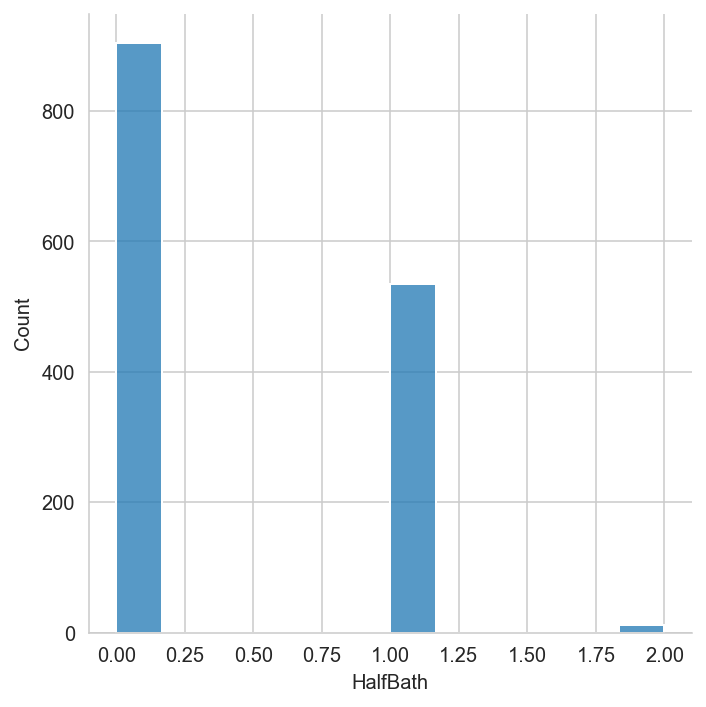

In [134]:
# plot distribution
sns.displot(data=house.HalfBath);

In [135]:
## dtype : ok
## values : ok

##### <span style="color:purple">Bedroom</span>


In [136]:
# check column, expecting : integer
check_column('BedroomAbvGr')

*** BedroomAbvGr ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      6
1     49
2    352
3    802
4    212
5     21
6      7
8      1
Name: BedroomAbvGr, dtype: int64


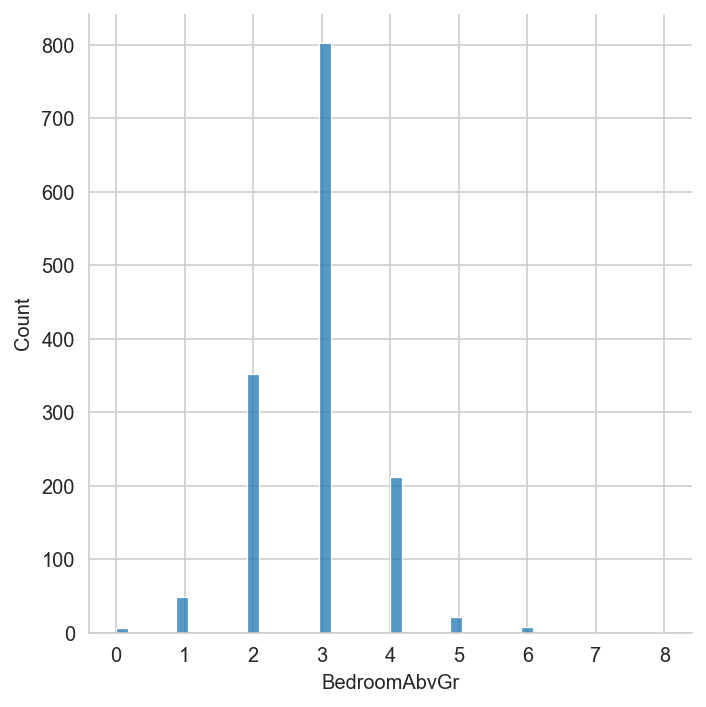

In [137]:
# plot distribution
sns.displot(data=house.BedroomAbvGr);

In [138]:
# what houses don't have bedrooms?

house[house.BedroomAbvGr ==0]

## All have full bathrooms in the basement, highly likely to have bedrooms in the basement

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
53,54,20,RL,68.0,50271,Pave,NA,3,Low,AllPub,Inside,3,Veenker,Norm,Norm,1Fam,1Story,9,5,1981,1987,Gable,WdShngl,WdShing,Wd Shng,None,0,4,3,CBlock,5,3,4,6,1810,1,0,32,1842,GasA,4,1,SBrkr,1842,0,0,1842,2,0,0,1,0,1,Gd,5,Typ,1,Gd,Attchd,1981,Fin,3,894,TA,TA,Y,857,72,0,0,0,0,NA,NA,NA,0,11,2006,WD,Normal,385000
189,190,120,RL,41.0,4923,Pave,NA,4,Lvl,AllPub,Inside,3,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,2001,2002,Gable,CompShg,CemntBd,CmentBd,None,0,4,3,PConc,5,3,3,6,1153,1,0,440,1593,GasA,5,1,SBrkr,1593,0,0,1593,1,0,1,1,0,1,Ex,5,Typ,1,Gd,Attchd,2001,Fin,2,682,TA,TA,Y,0,120,0,0,224,0,NA,NA,NA,0,8,2008,WD,Normal,286000
634,635,90,RL,64.0,6979,Pave,NA,4,Lvl,AllPub,Inside,3,OldTown,Norm,Norm,Duplex,SFoyer,6,5,1980,1980,Gable,CompShg,Plywood,Plywood,None,0,3,3,CBlock,3,3,1,6,1056,1,0,0,1056,GasA,4,1,SBrkr,1056,0,0,1056,2,0,0,0,0,2,TA,4,Typ,0,NA,Detchd,1980,Unf,2,576,TA,TA,Y,264,56,0,0,0,0,NA,GdPrv,Shed,600,6,2010,WD,Normal,144000
1163,1164,90,RL,60.0,12900,Pave,NA,4,Lvl,AllPub,Inside,3,Sawyer,Feedr,Norm,Duplex,SFoyer,4,4,1969,1969,Gable,CompShg,Plywood,Plywood,None,0,3,3,CBlock,4,3,3,6,1198,1,0,0,1198,GasA,3,1,SBrkr,1258,0,0,1258,2,0,0,2,0,2,TA,6,Typ,0,NA,CarPort,1969,Unf,2,400,Fa,TA,Y,120,0,0,0,0,0,NA,NA,NA,0,1,2008,WD,Alloca,108959
1213,1214,80,RL,NaN,10246,Pave,NA,3,Lvl,AllPub,CulDSac,3,Sawyer,Norm,Norm,1Fam,SLvl,4,9,1965,2001,Gable,CompShg,VinylSd,VinylSd,None,0,3,4,CBlock,3,4,3,6,648,1,0,0,648,GasA,5,1,SBrkr,960,0,0,960,1,1,0,0,0,1,TA,3,Typ,0,NA,Attchd,1965,Unf,1,364,TA,TA,Y,88,0,0,0,0,0,NA,NA,NA,0,5,2006,WD,Normal,145000
1270,1271,40,RL,NaN,23595,Pave,NA,4,Low,AllPub,Inside,1,ClearCr,Norm,Norm,1Fam,1Story,7,6,1979,1979,Shed,WdShake,Plywood,Plywood,None,0,4,3,PConc,4,3,4,6,1258,1,0,74,1332,GasA,3,1,SBrkr,1332,192,0,1524,2,0,0,1,0,1,Gd,4,Typ,1,TA,Attchd,1979,Fin,2,586,TA,TA,Y,268,0,0,0,0,0,NA,NA,NA,0,4,2010,WD,Normal,260000


In [139]:
## dtype : ok
## values : ok

##### <span style="color:purple">Kitchen</span>


In [140]:
# check column, expecting : integer
check_column('KitchenAbvGr')

*** KitchenAbvGr ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0       1
1    1383
2      64
3       2
Name: KitchenAbvGr, dtype: int64


In [141]:
## dtype : ok
## values : ok

##### <span style="color:purple">KitchenQual</span>


In [142]:
# check column, expecting : categorical
check_column('KitchenQual')

*** KitchenQual ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Ex    100
Fa     37
Gd    586
TA    727
Name: KitchenQual, dtype: int64


In [143]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 5	Ex	Excellent
# 4	Gd	Good
# 3	TA	Average/Typical
# 2	Fa	Fair
# 1	Po	Poor

house.KitchenQual.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, inplace=True)
house.KitchenQual.astype('int')
check_column('KitchenQual')


*** KitchenQual ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 2     37
3    727
4    586
5    100
Name: KitchenQual, dtype: int64


##### <span style="color:purple">TotRmsAbvGrd</span>


In [144]:
# check column, expecting : integer
check_column('TotRmsAbvGrd')

*** TotRmsAbvGrd ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 2       1
3      17
4      94
5     275
6     398
7     327
8     187
9      74
10     47
11     18
12     11
14      1
Name: TotRmsAbvGrd, dtype: int64


In [145]:
# dtype : ok
# values : ok

##### <span style="color:purple">Functional</span>


In [146]:
# check column, expecting : categorical
check_column('Functional')

*** Functional ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Maj1      14
Maj2       5
Min1      31
Min2      34
Mod       15
Sev        1
Typ     1350
Name: Functional, dtype: int64


In [147]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 8	Typ	Typical Functionality
# 7	Min1	Minor Deductions 1
# 6	Min2	Minor Deductions 2
# 5	Mod	Moderate Deductions
# 4	Maj1	Major Deductions 1
# 3	Maj2	Major Deductions 2
# 2	Sev	Severely Damaged
# 1	Sal	Salvage only

house.Functional.replace({'Sal':1, 'Sev':2, 'Maj2':3, 'Maj1':4, 
                          'Mod':5, 'Min2':6, 'Min1':7, 'Typ':8}, inplace=True)
house.Functional.astype('int')
check_column('Functional')


*** Functional ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 2       1
3       5
4      14
5      15
6      34
7      31
8    1350
Name: Functional, dtype: int64


##### <span style="color:purple">Fireplaces</span>


In [148]:
# check column, expecting : integer
check_column('Fireplaces')

*** Fireplaces ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0    681
1    649
2    115
3      5
Name: Fireplaces, dtype: int64


In [149]:
# dtype : ok
# values : ok

##### <span style="color:purple">FireplaceQu</span>


In [150]:
# check column, expecting : categorical
check_column('FireplaceQu')

*** FireplaceQu ***
data type: object
count nulls: 0
count NA: 681

 value counts:
 Ex     24
Fa     33
Gd    379
NA    681
Po     20
TA    313
Name: FireplaceQu, dtype: int64


In [151]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 5	Ex	Excellent - Exceptional Masonry Fireplace
# 4	Gd	Good - Masonry Fireplace in main level
# 3	TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
# 2	Fa	Fair - Prefabricated Fireplace in basement
# 1	Po	Poor - Ben Franklin Stove
# 0	NA	No Fireplace

house.FireplaceQu.replace({'NA':0, 'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, 
                          inplace=True)
house.FireplaceQu.astype('int')
check_column('FireplaceQu')


*** FireplaceQu ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0    681
1     20
2     33
3    313
4    379
5     24
Name: FireplaceQu, dtype: int64


##### <span style="color:purple">GarageType</span>


In [152]:
# check column, expecting : categorical
check_column('GarageType')

*** GarageType ***
data type: object
count nulls: 0
count NA: 79

 value counts:
 2Types       6
Attchd     870
Basment     18
BuiltIn     88
CarPort      8
Detchd     381
NA          79
Name: GarageType, dtype: int64


In [153]:
## NA is valid value
# dtype : ok
# values : ok

##### <span style="color:purple">GarageYrBlt</span>


In [154]:
# check column, expecting : continuous
check_column('GarageYrBlt')

*** GarageYrBlt ***
data type: object
count nulls: 0
count NA: 79

 value counts:
 1906     1
1908     1
1910     3
1914     2
1915     2
        ..
2007    49
2008    29
2009    21
2010     3
NA      79
Name: GarageYrBlt, Length: 97, dtype: int64


In [155]:
# change 'NA' to zero & column to integer
# matches number without a garage
column_NA_replace_dtype('GarageYrBlt', 0, 'int')

## replacing NA with zero will have an impact on models, but willing to live with that for now
## can change this column to dummies if the impact on the models is too much

*** GarageYrBlt ***
data type: int32
count nulls: 0
count NA: 0

 value counts:
 0       79
1906     1
1908     1
1910     3
1914     2
        ..
2006    59
2007    49
2008    29
2009    21
2010     3
Name: GarageYrBlt, Length: 97, dtype: int64


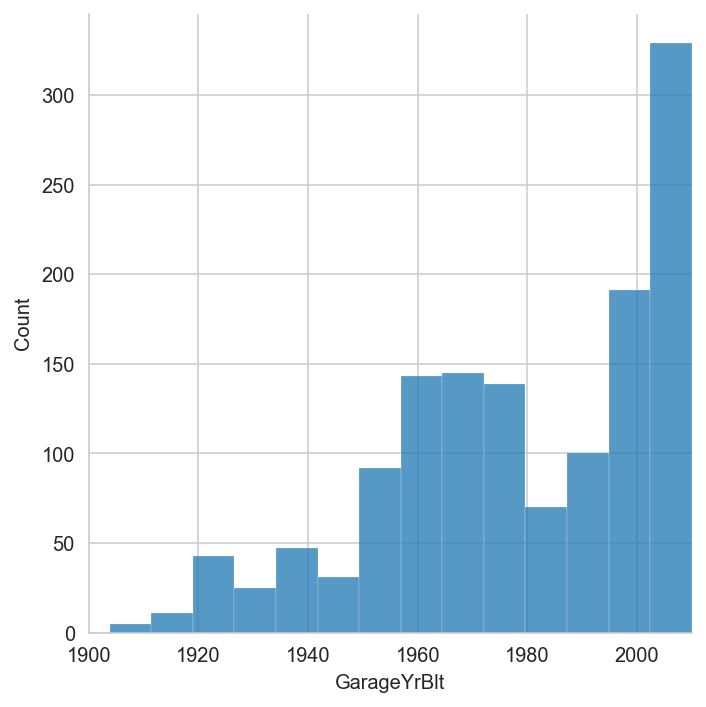

In [156]:
# plot distribution
sns.displot(data=house.GarageYrBlt).set(xlim=(1900,2010));


##### <span style="color:purple">GarageFinish</span>


In [157]:
# check column, expecting : categorical
check_column('GarageFinish')

*** GarageFinish ***
data type: object
count nulls: 0
count NA: 79

 value counts:
 Fin    352
NA      79
RFn    419
Unf    600
Name: GarageFinish, dtype: int64


In [158]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 3	Fin	Finished
# 2	RFn	Rough Finished
# 1	Unf	Unfinished
# 0	NA	No Garage

house.GarageFinish.replace({'NA':0, 'Unf':1, 'RFn':2, 'Fin':3}, inplace=True)
house.GarageFinish.astype('int')
check_column('GarageFinish')


*** GarageFinish ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0     79
1    600
2    419
3    352
Name: GarageFinish, dtype: int64


##### <span style="color:purple">GarageCars</span>


In [159]:
# check column, expecting : integer
check_column('GarageCars')

*** GarageCars ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0     79
1    365
2    821
3    180
4      5
Name: GarageCars, dtype: int64


In [160]:
# dtype : ok
# values : ok - zeros match number without a garage

##### <span style="color:purple">GarageArea</span>


In [161]:
# check column, expecting : continuous
check_column('GarageArea')

*** GarageArea ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0       79
160      2
164      1
180      9
186      1
        ..
1166     1
1220     1
1356     1
1390     1
1418     1
Name: GarageArea, Length: 440, dtype: int64


In [162]:
# dtype : ok
# values : ok - zeros match number without a garage

##### <span style="color:purple">GarageQual</span>


In [163]:
# check column, expecting : categorical
check_column('GarageQual')

*** GarageQual ***
data type: object
count nulls: 0
count NA: 79

 value counts:
 Ex       3
Fa      48
Gd      14
NA      79
Po       3
TA    1303
Name: GarageQual, dtype: int64


In [164]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 5	Ex	Excellent
# 4	Gd	Good
# 3	TA	Typical/Average
# 2	Fa	Fair
# 1	Po	Poor
# 0	NA	No Garage

house.GarageQual.replace({'NA':0, 'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, 
                         inplace=True)
house.GarageQual.astype('int')
check_column('GarageQual')


*** GarageQual ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      79
1       3
2      48
3    1303
4      14
5       3
Name: GarageQual, dtype: int64


##### <span style="color:purple">GarageCond</span>


In [165]:
# check column, expecting : categorical
check_column('GarageCond')

*** GarageCond ***
data type: object
count nulls: 0
count NA: 79

 value counts:
 Ex       2
Fa      34
Gd       9
NA      79
Po       7
TA    1319
Name: GarageCond, dtype: int64


In [166]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 5	Ex	Excellent
# 4	Gd	Good
# 3	TA	Typical/Average
# 2	Fa	Fair
# 1	Po	Poor
# 0	NA	No Garage

house.GarageCond.replace({'NA':0, 'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, 
                         inplace=True)
house.GarageCond.astype('int')
check_column('GarageCond')


*** GarageCond ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      79
1       7
2      34
3    1319
4       9
5       2
Name: GarageCond, dtype: int64


##### <span style="color:purple">PavedDrive</span>


In [167]:
# check column, expecting : categorical
check_column('PavedDrive')

*** PavedDrive ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 N      85
P      30
Y    1335
Name: PavedDrive, dtype: int64


In [168]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 2	Y	Paved
# 1	P	Partial Pavement
# 0	N	Dirt/Gravel

house.PavedDrive.replace({'N':0, 'P':1, 'Y':2}, inplace=True)
house.PavedDrive.astype('int')
check_column('PavedDrive')

*** PavedDrive ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      85
1      30
2    1335
Name: PavedDrive, dtype: int64


##### <span style="color:purple">WoodDeckSF</span>


In [169]:
# check column, expecting : continuous
check_column('WoodDeckSF')

*** WoodDeckSF ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      753
12       2
24       2
26       2
28       2
      ... 
668      1
670      1
728      1
736      1
857      1
Name: WoodDeckSF, Length: 273, dtype: int64


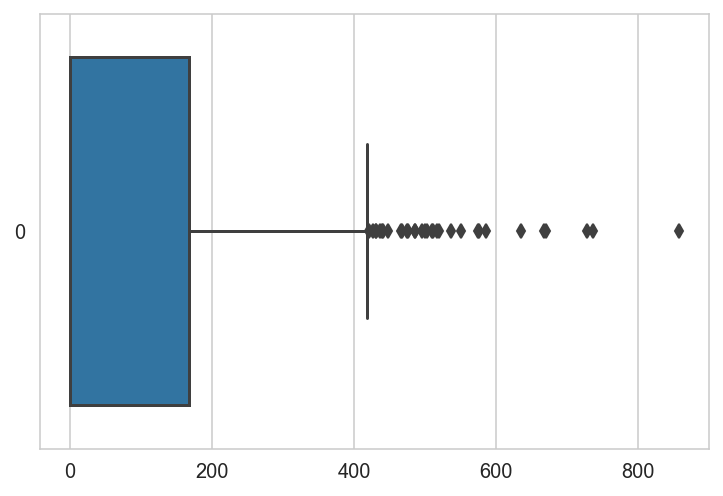

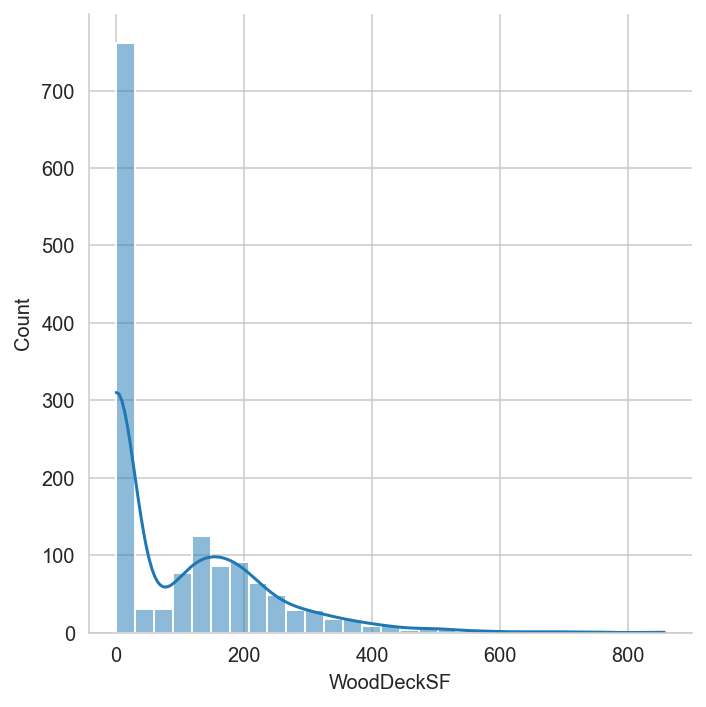

In [170]:
# plot distribution
plot_box_kde('WoodDeckSF')

## outliers, but no so extreme as other columns

##### <span style="color:purple">OpenPorchSF</span>


In [171]:
# check column, expecting : continuous
check_column('OpenPorchSF')

*** OpenPorchSF ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      650
4        1
8        1
10       1
11       1
      ... 
364      1
406      1
418      1
502      1
547      1
Name: OpenPorchSF, Length: 201, dtype: int64


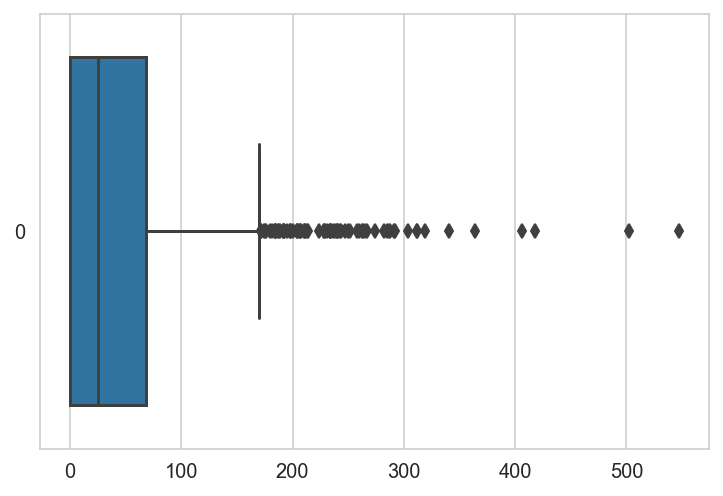

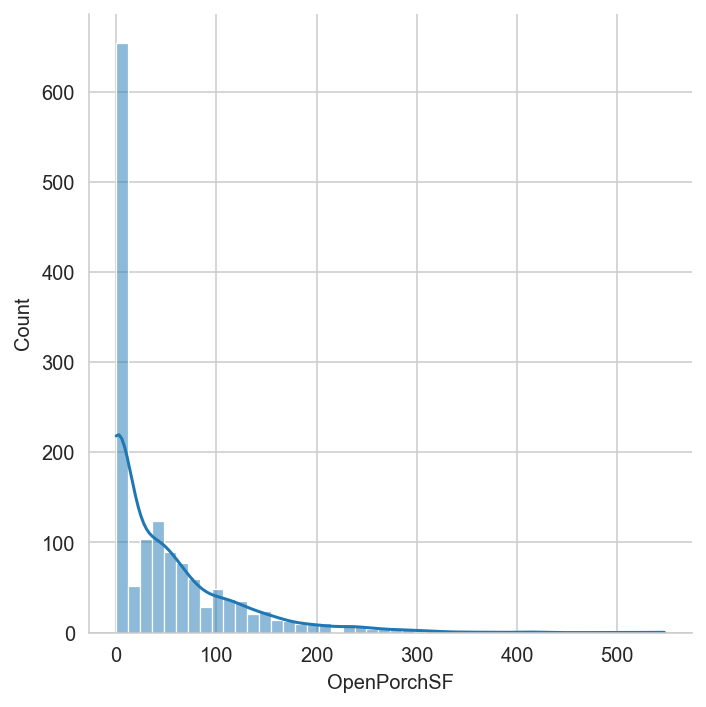

In [172]:
# plot distribution
plot_box_kde('OpenPorchSF')

## outliers, but no so extreme as other columns

##### <span style="color:purple">EnclosedPorch</span>


In [173]:
# check column, expecting : continuous
check_column('EnclosedPorch')

*** EnclosedPorch ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      1248
19        1
20        1
24        1
30        1
       ... 
301       1
318       1
330       1
386       1
552       1
Name: EnclosedPorch, Length: 118, dtype: int64


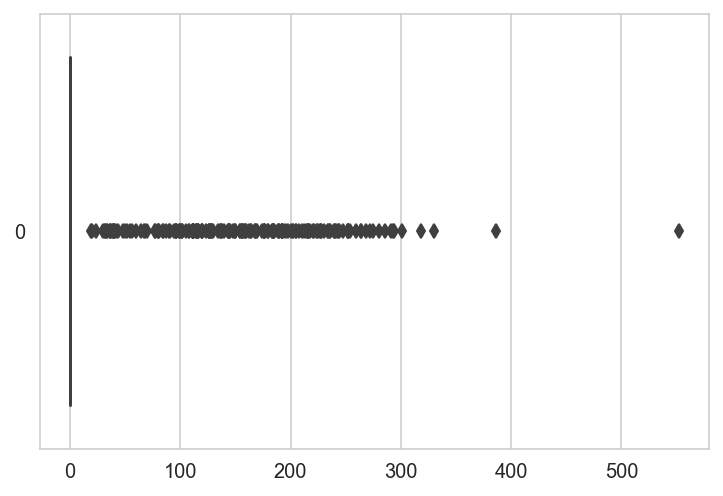

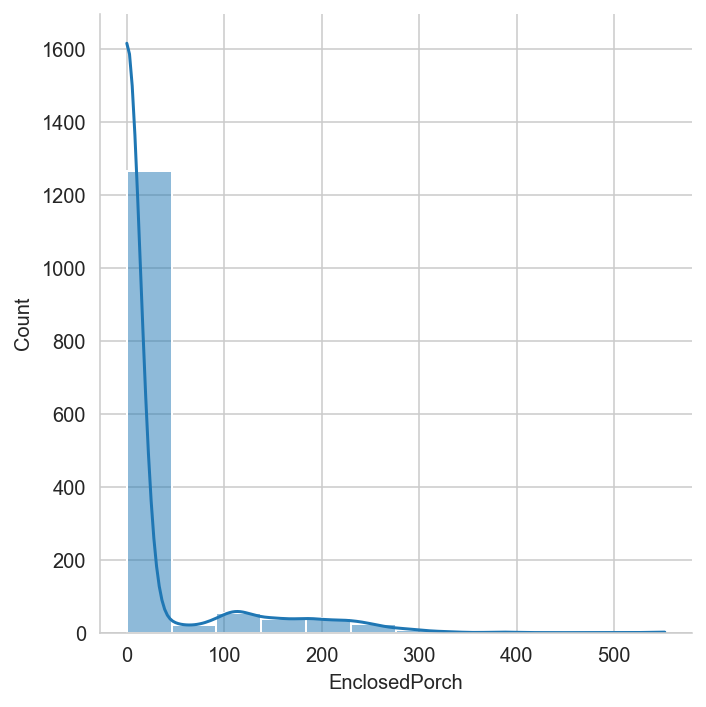

In [174]:
# plot distribution
plot_box_kde('EnclosedPorch')

## looks like all outliers, leave in and see how the models handle it

##### <span style="color:purple">3SsnPorch</span>


In [175]:
# check column, expecting : continuous
check_column('3SsnPorch')

*** 3SsnPorch ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      1426
23        1
96        1
130       1
140       1
144       2
153       1
162       1
168       3
180       2
182       1
196       1
216       2
238       1
245       1
290       1
304       1
320       1
407       1
508       1
Name: 3SsnPorch, dtype: int64


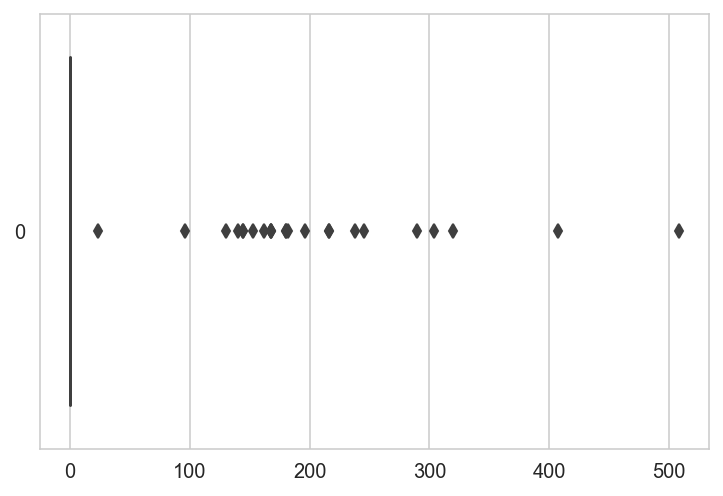

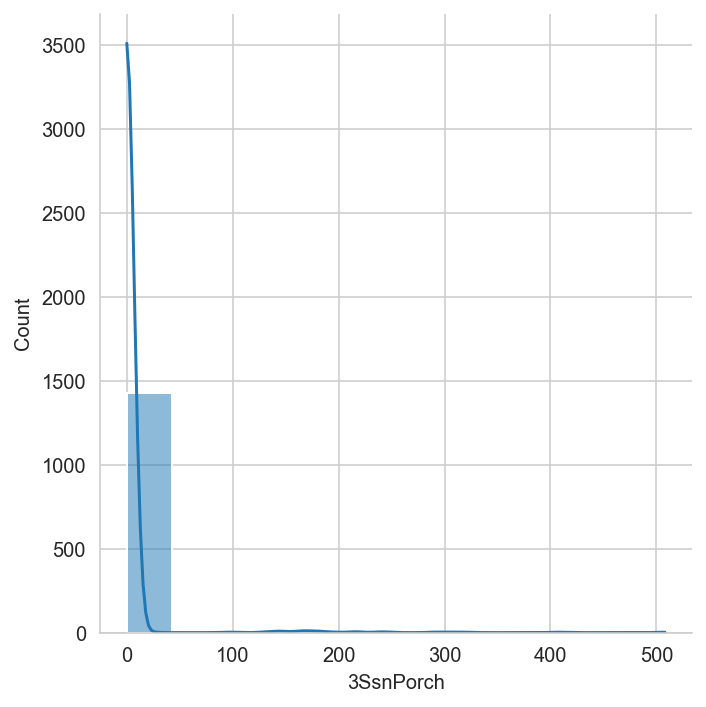

In [176]:
# plot distribution
plot_box_kde('3SsnPorch')

## looks like all outliers, leave in and see how the models handle it

##### <span style="color:purple">ScreenPorch</span>


In [177]:
# check column, expecting : continuous
check_column('ScreenPorch')

*** ScreenPorch ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      1335
40        1
53        1
60        1
63        1
       ... 
385       1
396       1
410       1
440       1
480       1
Name: ScreenPorch, Length: 75, dtype: int64


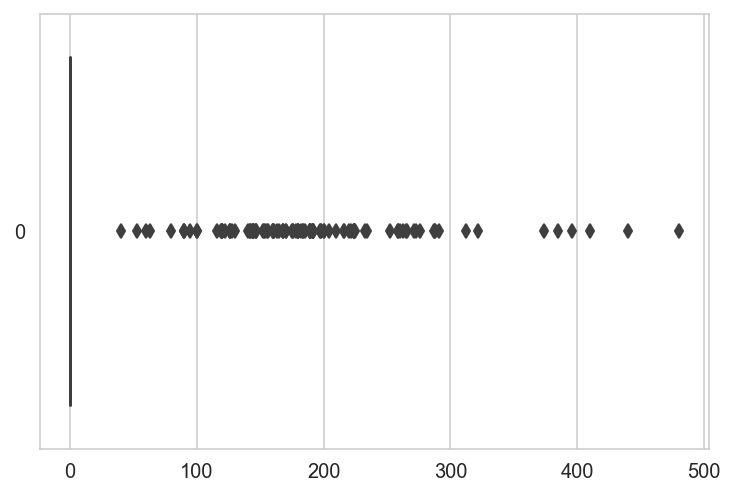

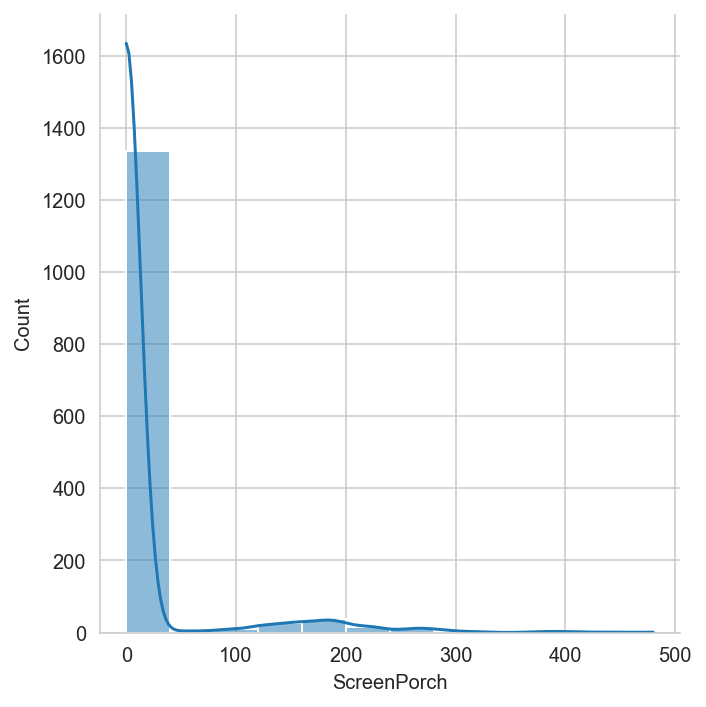

In [178]:
# plot distribution
plot_box_kde('ScreenPorch')

## looks like all outliers, leave in and see how the models handle it

##### <span style="color:purple">PoolArea</span>


In [179]:
# check column, expecting : continuous
check_column('PoolArea')

*** PoolArea ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0      1443
480       1
512       1
519       1
555       1
576       1
648       1
738       1
Name: PoolArea, dtype: int64


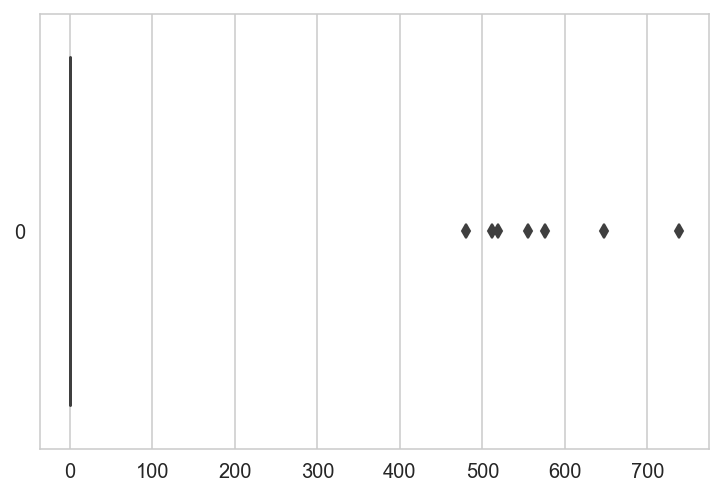

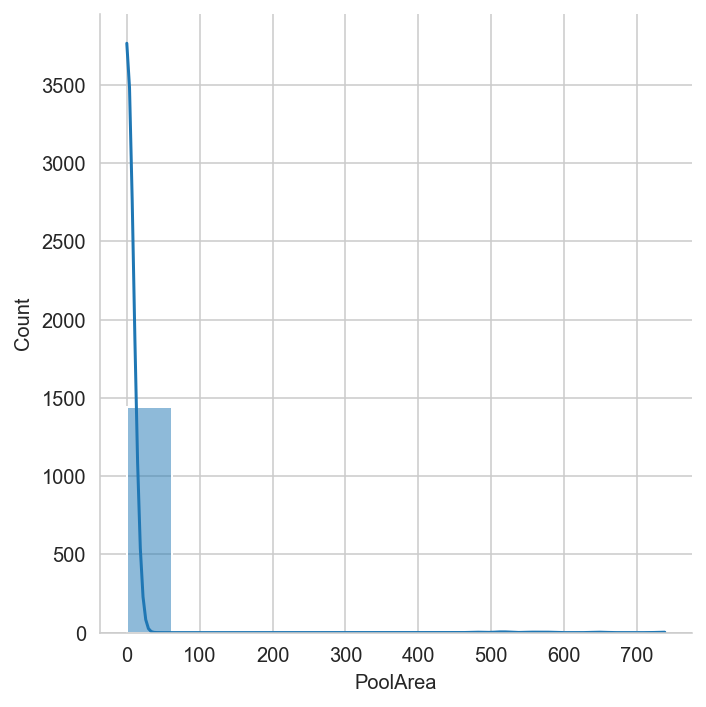

In [180]:
# plot distribution of continuous variable
plot_box_kde('PoolArea')

## all outliers, only 7 houses have pools

##### <span style="color:purple">PoolQC</span>


In [181]:
# check column, expecting : categorical
check_column('PoolQC')

*** PoolQC ***
data type: object
count nulls: 0
count NA: 1443

 value counts:
 Ex       2
Fa       2
Gd       3
NA    1443
Name: PoolQC, dtype: int64


In [182]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 4	Ex	Excellent
# 3	Gd	Good
# 2	TA	Average/Typical
# 1	Fa	Fair
# 0	NA	No Pool

house.PoolQC.replace({'NA':0, 'Fa':1, 'TA':2, 'Gd':3, 'Ex':4}, inplace=True)
house.PoolQC.astype('int')
check_column('PoolQC')


*** PoolQC ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0    1443
1       2
3       3
4       2
Name: PoolQC, dtype: int64


##### <span style="color:purple">Fence</span>


In [183]:
# check column, expecting : categorical
check_column('Fence')

*** Fence ***
data type: object
count nulls: 0
count NA: 1172

 value counts:
 GdPrv      59
GdWo       53
MnPrv     155
MnWw       11
NA       1172
Name: Fence, dtype: int64


In [184]:
# The categorical values have a distinct rank
# replace with numbers & change dtype of column

## Allocate higher number as better category
# 4	GdPrv	Good Privacy
# 3	MnPrv	Minimum Privacy
# 2	GdWo	Good Wood
# 1	MnWw	Minimum Wood/Wire
# 0	NA	No Fence

house.Fence.replace({'NA':0, 'MnWw':1, 'GdWo':2, 'MnPrv':3, 'GdPrv':4}, 
                    inplace=True)
house.Fence.astype('int')
check_column('Fence')


*** Fence ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0    1172
1      11
2      53
3     155
4      59
Name: Fence, dtype: int64


##### <span style="color:purple">MiscFeature</span>


In [185]:
# check column, expecting : categorical
check_column('MiscFeature')

*** MiscFeature ***
data type: object
count nulls: 0
count NA: 1398

 value counts:
 Gar2       2
NA      1398
Othr       2
Shed      47
TenC       1
Name: MiscFeature, dtype: int64


In [186]:
## NA is valid value
## dtype : ok
## values : ok

##### <span style="color:purple">MiscVal</span>


In [187]:
# check column, expecting : continuous
check_column('MiscVal')

*** MiscVal ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 0        1400
350         1
400        11
450         4
480         2
500         8
600         4
620         1
700         5
800         1
1150        1
1200        2
1300        1
1400        1
2000        4
2500        1
3500        1
8300        1
15500       1
Name: MiscVal, dtype: int64


In [188]:
## dtype : ok
## values : ok - zero matches NA + Other

##### <span style="color:purple">MoSold</span>


In [189]:
# check column, expecting : integer
check_column('MoSold')

*** MoSold ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 1      57
2      52
3     106
4     140
5     204
6     252
7     233
8     121
9      62
10     87
11     77
12     59
Name: MoSold, dtype: int64


In [190]:
# change to dtype: object
# There appears to be a seasonal pattern to sales & it makes more sense to consider it as categories
house.MoSold = house.MoSold.astype('object')
print(house.MoSold.dtype)

object


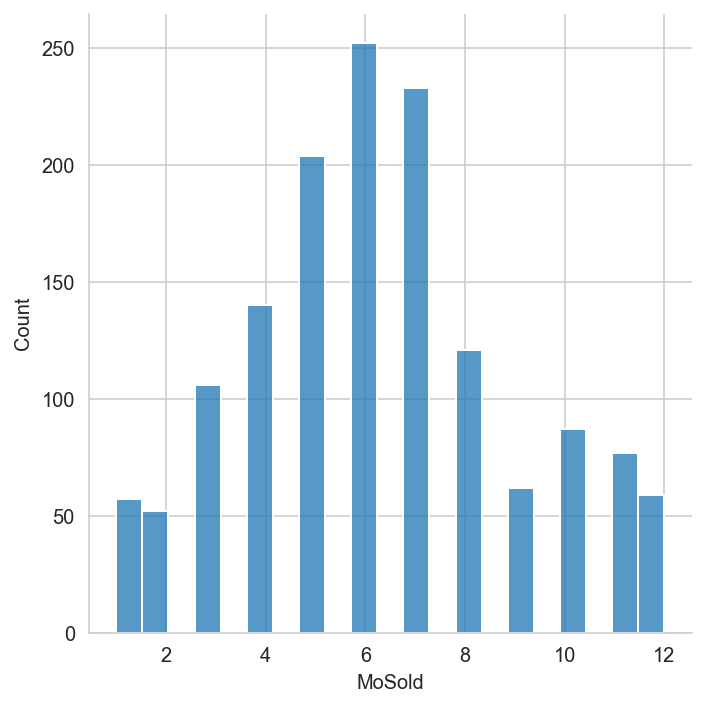

In [191]:
# plot distribution
sns.displot(data=house.MoSold);

##### <span style="color:purple">YrSold</span>


In [192]:
# check column, expecting : continuous
check_column('YrSold')

*** YrSold ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 2006    312
2007    328
2008    302
2009    336
2010    172
Name: YrSold, dtype: int64


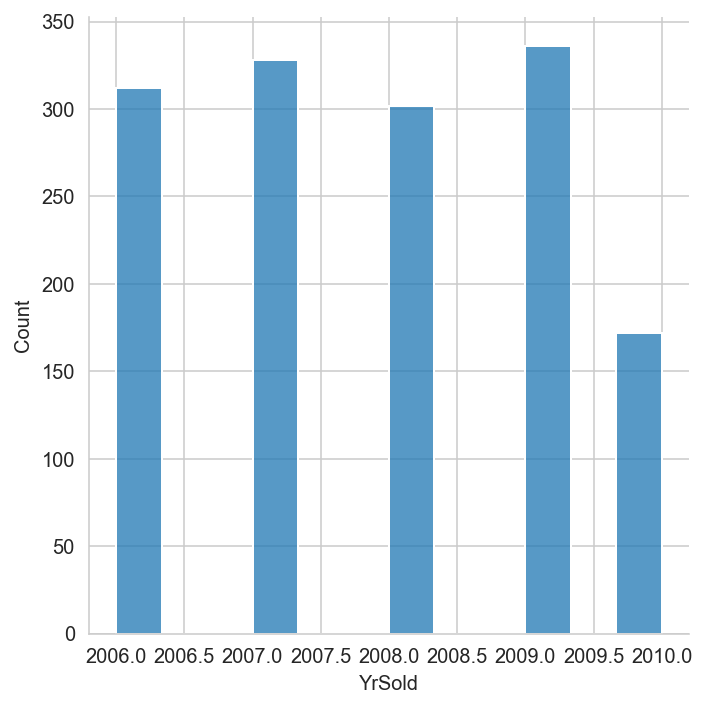

In [193]:
# plot distribution
sns.displot(data=house.YrSold);

## roughly same number of sales per year, except 2010 which is first 7 months

##### <span style="color:purple">SaleType</span>


In [194]:
# check column, expecting : categorical
check_column('SaleType')

*** SaleType ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 COD        41
CWD         4
Con         2
ConLD       7
ConLI       5
ConLw       5
New       122
Oth         3
WD       1261
Name: SaleType, dtype: int64


In [195]:
## dtype : ok
## values : ok

##### <span style="color:purple">SaleCondition</span>


In [196]:
# check column, expecting : categorical
check_column('SaleCondition')

*** SaleCondition ***
data type: object
count nulls: 0
count NA: 0

 value counts:
 Abnorml      96
AdjLand       4
Alloca       11
Family       20
Normal     1194
Partial     125
Name: SaleCondition, dtype: int64


In [197]:
## dtype : ok
## values : ok

##### <span style="color:purple">SalePrice</span>


In [198]:
# check column, expecting : continuous
check_column('SalePrice')

*** SalePrice ***
data type: int64
count nulls: 0
count NA: 0

 value counts:
 37900     1
39300     1
52000     1
52500     1
55000     2
         ..
582933    1
611657    1
625000    1
745000    1
755000    1
Name: SalePrice, Length: 657, dtype: int64


In [199]:
# mean and median of SalePrice
print('mean ${0:.2f}, median ${1:.2f}'.format(house.SalePrice.mean(), house.SalePrice.median()))

## most houses are under $200k, and the distribution is positive skewed, with a long tail

mean $181654.94, median $163945.00


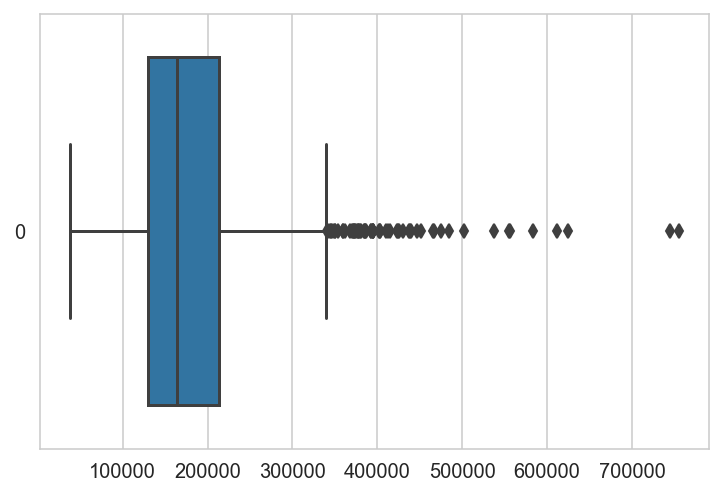

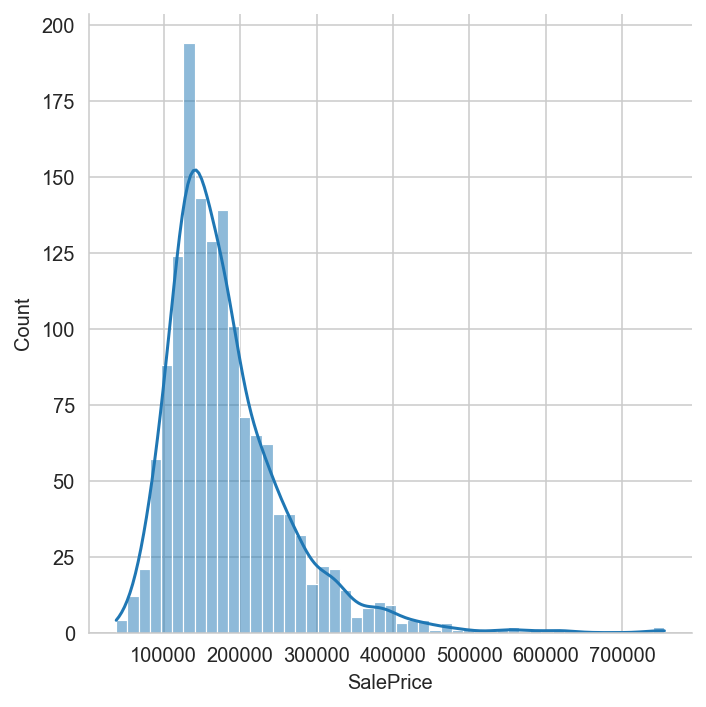

In [200]:
# plot distribution of continuous variable
plot_box_kde('SalePrice')

## extreme outliers at SalePrice >700000

In [201]:
# look at those extreme outliers
house[house.SalePrice >700000]

## large houses on large lots which were built in mid 1990's - leave in for now

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
691,692,60,RL,104.0,21535,Pave,NA,3,Lvl,AllPub,Corner,3,NoRidge,Norm,Norm,1Fam,2Story,10,6,1994,1995,Gable,WdShngl,HdBoard,HdBoard,BrkFace,1170,5,3,PConc,5,3,4,6,1455,1,0,989,2444,GasA,5,1,SBrkr,2444,1872,0,4316,0,1,3,1,4,1,5,10,8,2,5,Attchd,1994,3,3,832,3,3,2,382,50,0,0,0,0,0,0,NA,0,1,2007,WD,Normal,755000
1182,1183,60,RL,160.0,15623,Pave,NA,3,Lvl,AllPub,Corner,3,NoRidge,Norm,Norm,1Fam,2Story,10,5,1996,1996,Hip,CompShg,Wd Sdng,ImStucc,None,0,4,3,PConc,5,3,3,6,2096,1,0,300,2396,GasA,5,1,SBrkr,2411,2065,0,4476,1,0,3,1,4,1,5,10,8,2,3,Attchd,1996,3,3,813,3,3,2,171,78,0,0,0,555,4,3,NA,0,7,2007,WD,Abnorml,745000


In [202]:
# all columns checked
len(house.columns)

81

In [203]:
# which columns have small variances
house.var().sort_values().head()

## CentralAir is binary Y/N, others aren't expected to be highly influencial for coefficients

PoolQC          0.041926
KitchenAbvGr    0.048243
BsmtHalfBath    0.056763
CentralAir      0.057652
LandSlope       0.074989
dtype: float64

In [204]:
# which columns have large variances
house.var().sort_values(ascending=False).head()

## expect to see most of these as highly influencial for coefficients

SalePrice     6.268916e+09
LotArea       1.002439e+08
GrLivArea     2.757869e+05
MiscVal       2.476421e+05
BsmtFinSF1    2.082589e+05
dtype: float64

---
<a id='group_variables'></a>
### <span style="color:purple">Grouping variables: Renovatable/non</span>

[back to index](#index)

In [205]:
# create groups to make variables easier to work with
print(len(house.columns))
house.columns

81


Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [206]:
# attributes of the property itself
land_features = ['MSZoning', 'LotFrontage', 'LotArea', 
                 'Street', 'Alley', 'LotShape', 'LandContour', 
                 'Utilities', 'LotConfig', 'LandSlope', 
                 'Neighborhood', 'Condition1', 'Condition2', 'YearBuilt']
len(land_features)

14

In [207]:
# difficult to change attributes of any building/structure on the property
building_core_features = ['MSSubClass', 'BldgType', 'HouseStyle', 'MasVnrArea', 
                          'Foundation', 'BsmtQual', 'BsmtExposure', 
                          'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 
                          '1stFlrSF', '2ndFlrSF', 'GrLivArea', 
                          'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 
                          'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 
                          'GarageType', 'GarageYrBlt', 'GarageCars', 'GarageArea', 
                          'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 
                          'ScreenPorch', 'PoolArea', 'MiscFeature', 'MiscVal']
len(building_core_features)

34

In [208]:
# likely renovatable attributes of buildings/structures on the property
building_other_features = ['OverallQual', 'OverallCond', 'YearRemodAdd', 
                           'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 
                           'MasVnrType', 'ExterQual', 'ExterCond', 'BsmtCond', 
                           'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 
                           'CentralAir', 'Electrical', 'LowQualFinSF', 'KitchenQual', 
                           'Functional', 'FireplaceQu', 'GarageFinish', 'GarageQual', 
                           'GarageCond', 'PavedDrive', 'PoolQC', 'Fence']
len(building_other_features)

27

In [209]:
# including SalePrice
sale_features = ['MoSold', 'YrSold', 'SaleType', 'SaleCondition', 
                 'SalePrice']
len(sale_features)

5

In [210]:
# check all varibles are assigned to a group, except 'ID', expect count=80
house_features = ['land_features', 'building_core_features', 'building_other_features', 'sale_features']
len(land_features) + len(building_core_features) + len(building_other_features) + len(sale_features)

80

---
<a id='analyise_grouped_variables'></a>
### <span style="color:purple">Groups of features: Analysis & Visualisations</span>

[back to index](#index)

In [211]:
house_features

['land_features',
 'building_core_features',
 'building_other_features',
 'sale_features']

In [212]:
# set up dictionary of observations
# so it will be easier to assess later what is the most appropriate action - especially for outliers

feature_observ = dict()
feature_observ['to_drop'] = []   # add feature name
feature_observ['outliers'] = []  # add row numbers

##### <span style="color:purple">Land Features</span>


In [213]:
house[land_features].dtypes.value_counts()

object     9
int64      4
float64    1
dtype: int64

In [214]:
# split features into objects & continuous
explore_cols_object = list(house[land_features].select_dtypes(include=object).columns)
explore_cols_other = list(house[land_features].select_dtypes(exclude=object).columns)
print(' Categorical Features: \n', explore_cols_object)
print('\n Continuous Features: \n', explore_cols_other)

 Categorical Features: 
 ['MSZoning', 'Street', 'Alley', 'LandContour', 'Utilities', 'LotConfig', 'Neighborhood', 'Condition1', 'Condition2']

 Continuous Features: 
 ['LotFrontage', 'LotArea', 'LotShape', 'LandSlope', 'YearBuilt']


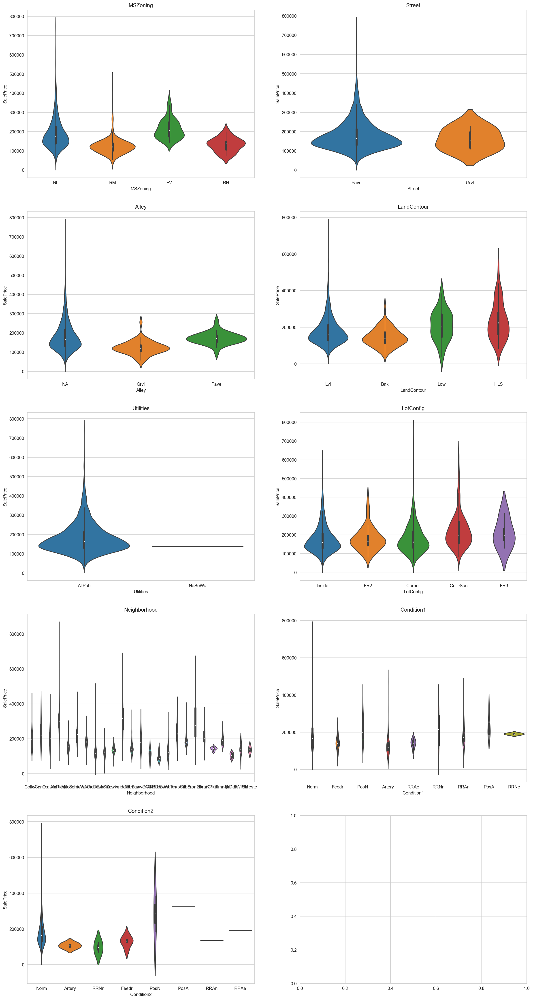

In [215]:
# visualise the categorical features
explore_df = house[list(explore_cols_object) + ['SalePrice']]

# set up subplots
c = 2
r = -(-len(explore_cols_object)//c) # roundup
fig, axes = plt.subplots(r, c, figsize=(20,40))

# iterate through the columns
for layout, col in enumerate(explore_cols_object):    
    sns.violinplot(data=explore_df, y='SalePrice', x=col, ax=axes[layout//2][layout % 2])
    axes[layout//2, layout % 2].set_title(col)                  # modify axis title

## Utilities has too little variability - drop when selecting features

In [216]:
feature_observ['to_drop'] += ['Utilities']
feature_observ

{'to_drop': ['Utilities'], 'outliers': []}

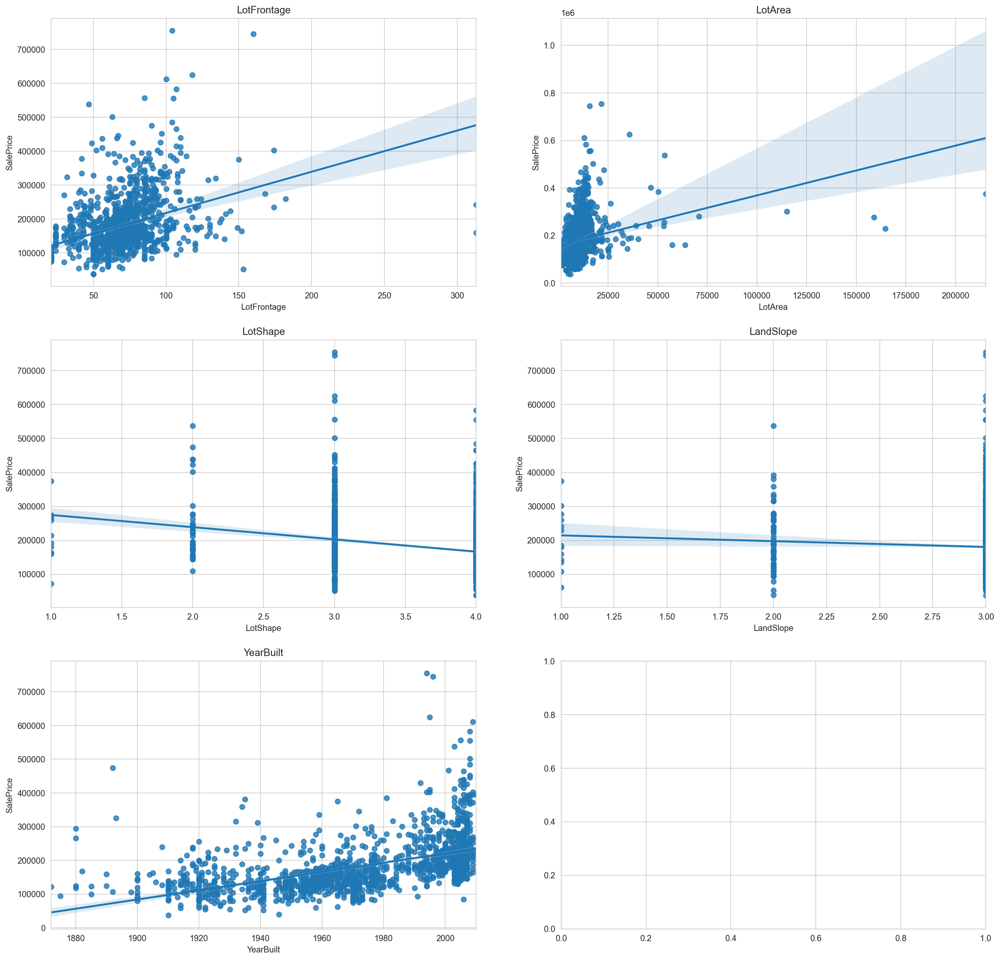

In [217]:
# visualise the continuous features
explore_df = house[list(explore_cols_other) + ['SalePrice']]

# set up subplots
c = 2
r = -(-len(explore_cols_other)//c) # roundup
fig, axes = plt.subplots(r, c, figsize=(20,20))

# iterate through the columns
for layout, col in enumerate(explore_cols_other):    
    sns.regplot(data=explore_df, y='SalePrice', x=col, ax=axes[layout//2][layout % 2])
    axes[layout//2, layout % 2].set_title(col)                  # modify axis title
    
## LotArea has extreme outliers >100,000
## LotFrontage has extreme outliers >200

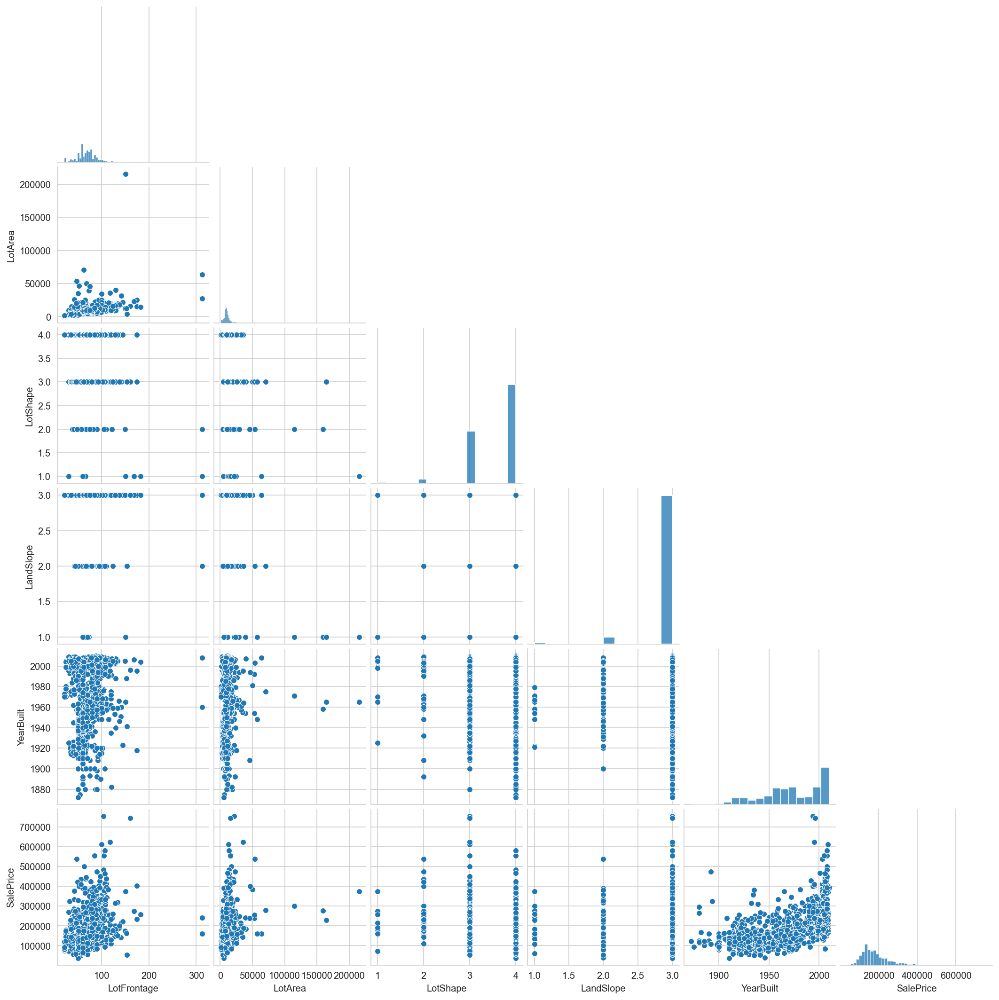

In [218]:
# visualise covariances
sns.pairplot(explore_df, corner=True)

## extreme outliers for LotArea & LotFrontage visible again
## LotShape and LandShape show distributions consistent with ordinal variables

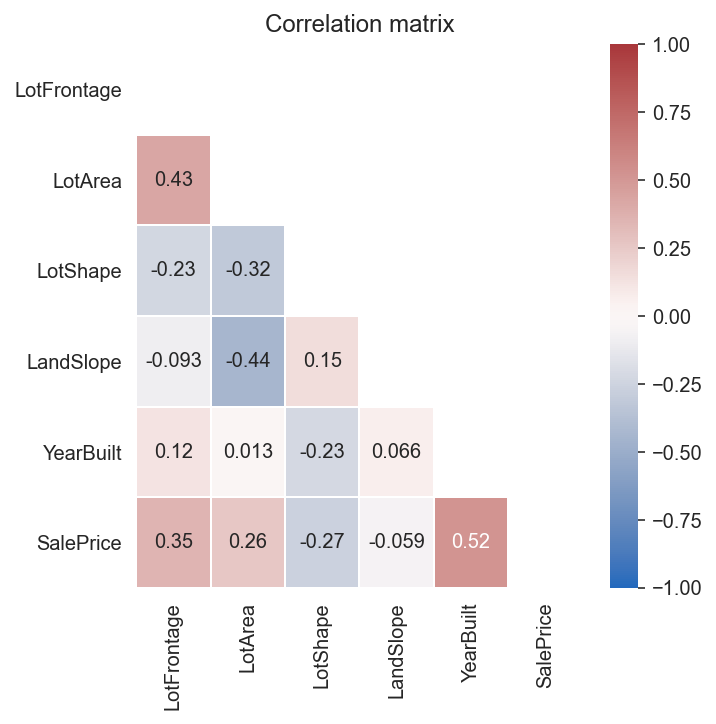

In [219]:
#check correlations
df_corr = explore_df.corr()
plot_corr(df_corr, 5, 5)

## no strong correlations
## positive correlation between YearBuilt & SalePrice as expected

In [220]:
# look at the LotArea & LotFrontage outliers
house[explore_df['LotArea']>100000].sort_values('LotArea')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
706,707,20,RL,NaN,115149,Pave,NA,2,Low,AllPub,CulDSac,1,ClearCr,Norm,Norm,1Fam,1Story,7,5,1971,2002,Gable,CompShg,Plywood,Plywood,Stone,351,3,3,CBlock,4,3,4,6,1219,1,0,424,1643,GasA,3,1,SBrkr,1824,0,0,1824,1,0,2,0,2,1,4,5,8,2,3,Attchd,1971,1,2,739,3,3,2,380,48,0,0,0,0,0,0,NA,0,6,2007,WD,Normal,302000
249,250,50,RL,NaN,159000,Pave,NA,2,Low,AllPub,CulDSac,1,ClearCr,Norm,Norm,1Fam,1.5Fin,6,7,1958,2006,Gable,CompShg,Wd Sdng,HdBoard,BrkCmn,472,4,3,CBlock,4,3,4,3,697,1,0,747,1444,GasA,4,1,SBrkr,1444,700,0,2144,0,1,2,0,4,1,4,7,8,2,3,Attchd,1958,3,2,389,3,3,2,0,98,0,0,0,0,0,0,Shed,500,6,2007,WD,Normal,277000
335,336,190,RL,NaN,164660,Grvl,NA,3,HLS,AllPub,Corner,1,Timber,Norm,Norm,2fmCon,1.5Fin,5,6,1965,1965,Gable,CompShg,Plywood,Plywood,None,0,3,3,CBlock,3,3,4,5,1249,4,147,103,1499,GasA,5,1,SBrkr,1619,167,0,1786,2,0,2,0,3,1,3,7,8,2,4,Attchd,1965,3,2,529,3,3,2,670,0,0,0,0,0,0,0,Shed,700,8,2008,WD,Normal,228950
313,314,20,RL,150.0,215245,Pave,NA,1,Low,AllPub,Inside,1,Timber,Norm,Norm,1Fam,1Story,7,5,1965,1965,Hip,CompShg,BrkFace,BrkFace,None,0,3,3,CBlock,4,3,4,5,1236,3,820,80,2136,GasW,3,1,SBrkr,2036,0,0,2036,2,0,2,0,3,1,3,8,8,2,4,Attchd,1965,2,2,513,3,3,2,0,0,0,0,0,0,0,0,NA,0,6,2009,WD,Normal,375000


In [221]:
house[explore_df['LotFrontage']>200].sort_values('LotFrontage')

## these 6 outliers were all sold pre-2010

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
934,935,20,RL,313.0,27650,Pave,NA,2,HLS,AllPub,Inside,2,NAmes,PosA,Norm,1Fam,1Story,7,7,1960,2007,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0,3,3,CBlock,4,3,4,6,425,1,0,160,585,GasA,5,1,SBrkr,2069,0,0,2069,1,0,2,0,4,1,4,9,8,1,4,Attchd,1960,2,2,505,3,3,2,0,0,0,0,0,0,0,0,NA,0,11,2008,WD,Normal,242000
1298,1299,60,RL,313.0,63887,Pave,NA,1,Bnk,AllPub,Corner,3,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796,5,3,PConc,5,3,4,6,5644,1,0,466,6110,GasA,5,1,SBrkr,4692,950,0,5642,2,0,2,1,3,1,5,12,8,3,4,Attchd,2008,3,2,1418,3,3,2,214,292,0,0,0,480,3,0,NA,0,1,2008,New,Partial,160000


In [222]:
# add outliers to observations for future action

feature_observ['outliers'] += list(explore_df[explore_df['LotArea']>100000].index)
feature_observ['outliers'] += list(explore_df[explore_df['LotFrontage']>200].index)
feature_observ

{'to_drop': ['Utilities'], 'outliers': [249, 313, 335, 706, 934, 1298]}

##### <span style="color:purple">Building Core Features</span>


In [223]:
house[building_core_features].dtypes.value_counts()

int64     26
object     6
int32      2
dtype: int64

In [224]:
# split features into objects & continuous
explore_cols_object = list(house[building_core_features].select_dtypes(include=object).columns)
explore_cols_other = list(house[building_core_features].select_dtypes(exclude=object).columns)
print(' Categorical Features: \n', explore_cols_object)
print('\n Continuous Features: \n', explore_cols_other)

 Categorical Features: 
 ['MSSubClass', 'BldgType', 'HouseStyle', 'Foundation', 'GarageType', 'MiscFeature']

 Continuous Features: 
 ['MasVnrArea', 'BsmtQual', 'BsmtExposure', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']


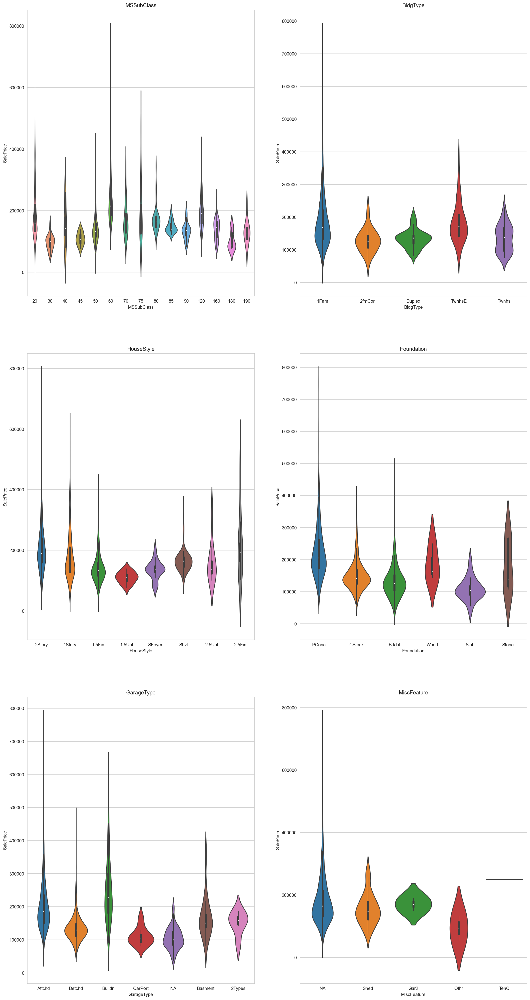

In [225]:
# visualise the categorical features
explore_df = house[list(explore_cols_object) + ['SalePrice']]

# set up subplots
c = 2
r = -(-len(explore_cols_object)//c) # roundup
fig, axes = plt.subplots(r, c, figsize=(20,40))

# iterate through the columns
for layout, col in enumerate(explore_cols_object):    
    sns.violinplot(data=explore_df, y='SalePrice', x=col, ax=axes[layout//2][layout % 2])
    axes[layout//2, layout % 2].set_title(col)                  # modify axis title
    
## only some elements of these features are present when the SalePrice > 300,000 (e.g. 1Fam for BldgType)
## actual MiscFeatures only maps to SalePrice < ~ 300,000

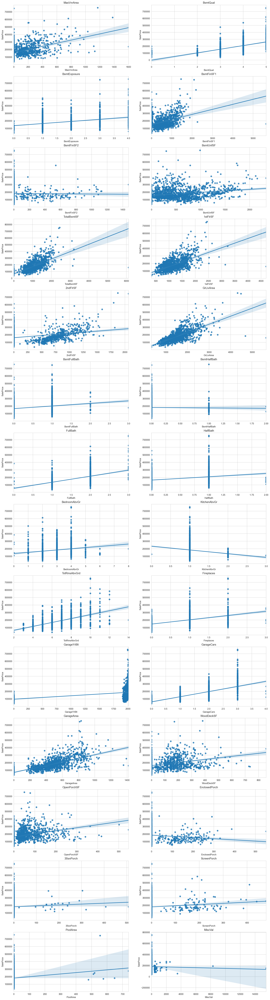

In [226]:
# visualise the continuous features
explore_df = house[list(explore_cols_other) + ['SalePrice']]

# set up subplots
c = 2
r = -(-len(explore_cols_other)//c) # roundup
fig, axes = plt.subplots(r, c, figsize=(20,80))

# iterate through the columns
for layout, col in enumerate(explore_cols_other):    
    sns.regplot(data=explore_df, y='SalePrice', x=col, ax=axes[layout//2][layout % 2])
    axes[layout//2, layout % 2].set_title(col)                  # modify axis title

## GarageYrBlt is showing skewed because of zeros - leave for now
## Porch price variations - suspect the different style of porch is due to yr built - leave for now
## KitchenAbvGr has a negative trend line for SalePrice as number of kitchens increase - look at 3 kitchens

## extreme outliers for [BsmtFinSF1 >3000], [TotalBsmtSF >4000], [1stFlrSF > 3500]
## GrLivArea has high & low SalePrice for outliers >4000

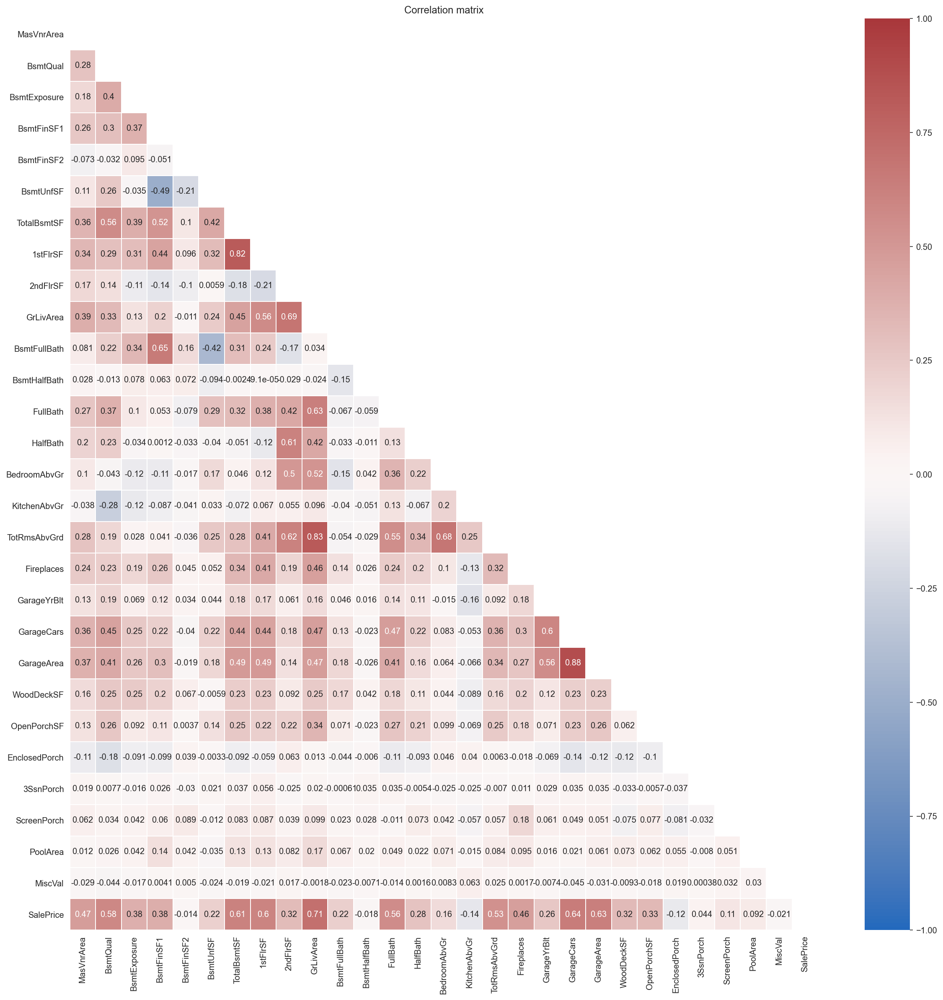

In [227]:
#check correlations
df_corr = explore_df.corr()
plot_corr(df_corr, 20,20)

## many values - filter for just high positive or negative correlations

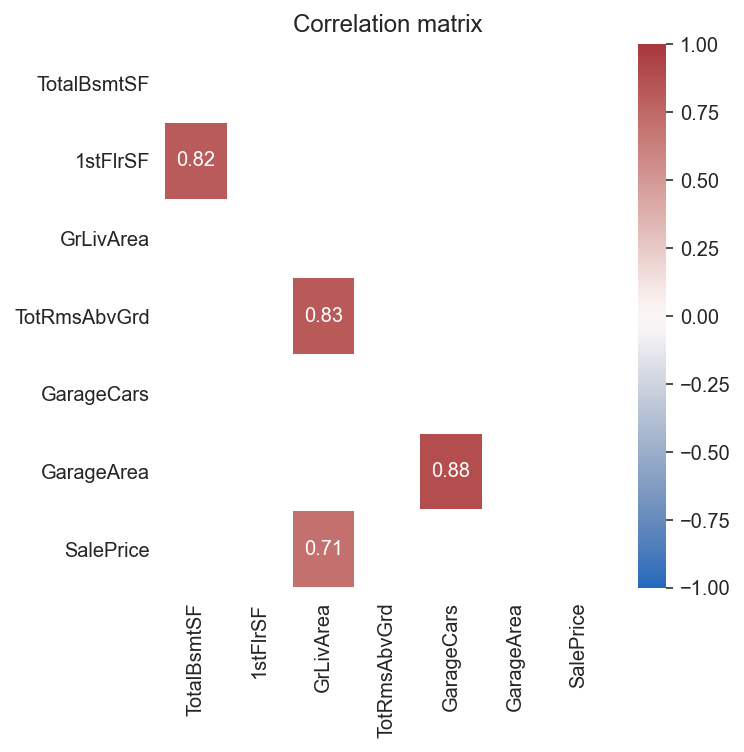

In [228]:
# find high correlations
high_corr = (df_corr.abs() > 0.7) & (df_corr.abs() <1)
df = list(df_corr[high_corr.any()].any(axis=1).index)

# only show the high correlations
df_corr = df_corr[df_corr.loc[df,df]>0.7]
plot_corr(df_corr.loc[df,df], 5,5)

## High correlations are expected & reasonable for: 
## 1stFlrSF & TotalBsmtSF
## TotRmsAbvGrd & GrLivArea
## GarageCars & GarageArea
## SalePrice & GrLivArea

In [229]:
# as expected, houses with 3 kitchens were built a long time ago so reasonable for lower price
house[explore_df['KitchenAbvGr']>2].YearBuilt

48     1920
809    1898
Name: YearBuilt, dtype: int64

In [230]:
# look at GrLivArea outliers - high & low SalePrice for outliers >4000
house[explore_df['GrLivArea']>4000].sort_values(by='GrLivArea')

## common difference between these are Neighbourhood(NoRidge/Edwards), SaleType(WD/New)
## and both the lower priced houses had SaleCondition of 'Partial'

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
691,692,60,RL,104.0,21535,Pave,NA,3,Lvl,AllPub,Corner,3,NoRidge,Norm,Norm,1Fam,2Story,10,6,1994,1995,Gable,WdShngl,HdBoard,HdBoard,BrkFace,1170,5,3,PConc,5,3,4,6,1455,1,0,989,2444,GasA,5,1,SBrkr,2444,1872,0,4316,0,1,3,1,4,1,5,10,8,2,5,Attchd,1994,3,3,832,3,3,2,382,50,0,0,0,0,0,0,NA,0,1,2007,WD,Normal,755000
1182,1183,60,RL,160.0,15623,Pave,NA,3,Lvl,AllPub,Corner,3,NoRidge,Norm,Norm,1Fam,2Story,10,5,1996,1996,Hip,CompShg,Wd Sdng,ImStucc,None,0,4,3,PConc,5,3,3,6,2096,1,0,300,2396,GasA,5,1,SBrkr,2411,2065,0,4476,1,0,3,1,4,1,5,10,8,2,3,Attchd,1996,3,3,813,3,3,2,171,78,0,0,0,555,4,3,NA,0,7,2007,WD,Abnorml,745000
523,524,60,RL,130.0,40094,Pave,NA,3,Bnk,AllPub,Inside,3,Edwards,PosN,PosN,1Fam,2Story,10,5,2007,2008,Hip,CompShg,CemntBd,CmentBd,Stone,762,5,3,PConc,5,3,4,6,2260,1,0,878,3138,GasA,5,1,SBrkr,3138,1538,0,4676,1,0,3,1,3,1,5,11,8,1,4,BuiltIn,2007,3,3,884,3,3,2,208,406,0,0,0,0,0,0,NA,0,10,2007,New,Partial,184750
1298,1299,60,RL,313.0,63887,Pave,NA,1,Bnk,AllPub,Corner,3,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796,5,3,PConc,5,3,4,6,5644,1,0,466,6110,GasA,5,1,SBrkr,4692,950,0,5642,2,0,2,1,3,1,5,12,8,3,4,Attchd,2008,3,2,1418,3,3,2,214,292,0,0,0,480,3,0,NA,0,1,2008,New,Partial,160000


In [231]:
# look at outliers for [BsmtFinSF1 >3000]
house[explore_df.BsmtFinSF1 >3000]

## this is also one of the GrLivArea outliers

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1298,1299,60,RL,313.0,63887,Pave,NA,1,Bnk,AllPub,Corner,3,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796,5,3,PConc,5,3,4,6,5644,1,0,466,6110,GasA,5,1,SBrkr,4692,950,0,5642,2,0,2,1,3,1,5,12,8,3,4,Attchd,2008,3,2,1418,3,3,2,214,292,0,0,0,480,3,0,NA,0,1,2008,New,Partial,160000


In [232]:
## look at outliers for [TotalBsmtSF >4000]
house[explore_df.TotalBsmtSF >4000]

## same GrLivArea outlier

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1298,1299,60,RL,313.0,63887,Pave,NA,1,Bnk,AllPub,Corner,3,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796,5,3,PConc,5,3,4,6,5644,1,0,466,6110,GasA,5,1,SBrkr,4692,950,0,5642,2,0,2,1,3,1,5,12,8,3,4,Attchd,2008,3,2,1418,3,3,2,214,292,0,0,0,480,3,0,NA,0,1,2008,New,Partial,160000


In [233]:
## look at outliers for [1stFlrSF > 3500]
house[explore_df['1stFlrSF'] > 3500]

## same GrLivArea outlier

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1298,1299,60,RL,313.0,63887,Pave,NA,1,Bnk,AllPub,Corner,3,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796,5,3,PConc,5,3,4,6,5644,1,0,466,6110,GasA,5,1,SBrkr,4692,950,0,5642,2,0,2,1,3,1,5,12,8,3,4,Attchd,2008,3,2,1418,3,3,2,214,292,0,0,0,480,3,0,NA,0,1,2008,New,Partial,160000


In [234]:
# add GrLivArea outliers to observations for future action

feature_observ['outliers'] += list(explore_df[explore_df['GrLivArea']>4000].index)
feature_observ

## row 1298 listed twice, such an overachiever with the outlier listings

{'to_drop': ['Utilities'],
 'outliers': [249, 313, 335, 706, 934, 1298, 523, 691, 1182, 1298]}

##### <span style="color:purple">Building Other Features</span>


In [235]:
house[building_other_features].dtypes.value_counts()

int64     20
object     7
dtype: int64

In [236]:
# split features into objects & continuous
explore_cols_object = list(house[building_other_features].select_dtypes(include=object).columns)
explore_cols_other = list(house[building_other_features].select_dtypes(exclude=object).columns)
print(' Categorical Features: \n', explore_cols_object)
print('\n Continuous Features: \n', explore_cols_other)

 Categorical Features: 
 ['RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Heating', 'Electrical']

 Continuous Features: 
 ['OverallQual', 'OverallCond', 'YearRemodAdd', 'ExterQual', 'ExterCond', 'BsmtCond', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'CentralAir', 'LowQualFinSF', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence']


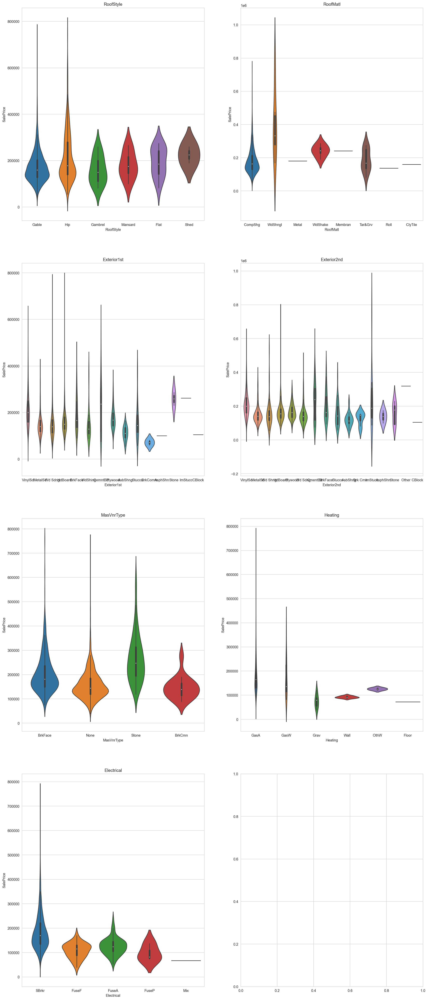

In [237]:
# visualise the categorical features
explore_df = house[list(explore_cols_object) + ['SalePrice']]

# set up subplots
c = 2
r = -(-len(explore_cols_object)//c) # roundup
fig, axes = plt.subplots(r, c, figsize=(20,50))

# iterate through the columns
for layout, col in enumerate(explore_cols_object):    
    sns.violinplot(data=explore_df, y='SalePrice', x=col, ax=axes[layout//2][layout % 2])
    axes[layout//2, layout % 2].set_title(col)                  # modify axis title

## reasonable variations
## RoofMatl graph looks a little odd because of the violin extensions into negative & above max SalePrice - actual values are ok


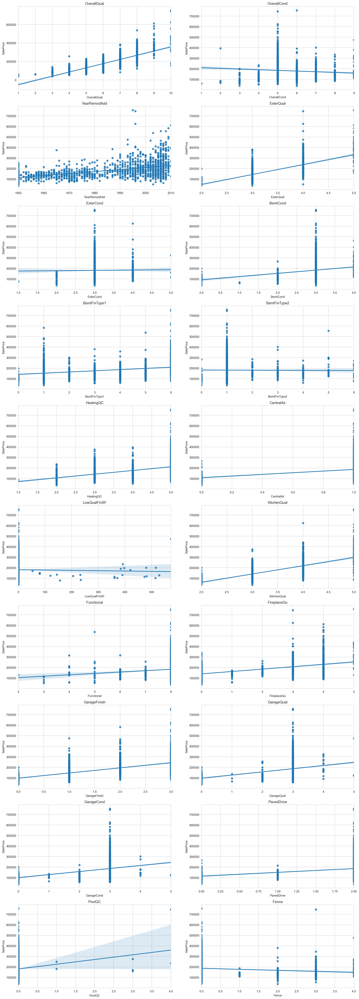

In [238]:
# visualise the continuous features
explore_df = house[list(explore_cols_other) + ['SalePrice']]

# set up subplots
c = 2
r = -(-len(explore_cols_other)//c) # roundup
fig, axes = plt.subplots(r, c, figsize=(20,60))

# iterate through the columns
for layout, col in enumerate(explore_cols_other):    
    sns.regplot(data=explore_df, y='SalePrice', x=col, ax=axes[layout//2][layout % 2])
    axes[layout//2, layout % 2].set_title(col)                  # modify axis title
    
## LowQualFinSF is mostly zero with lots of variability with the other values.
## PoolQC - not many pools, almost looks like they are all outliers
## OverallCond - trends slightly negative, which seems odd - leave for now
## CentralAir is binary (Y/N) - ok

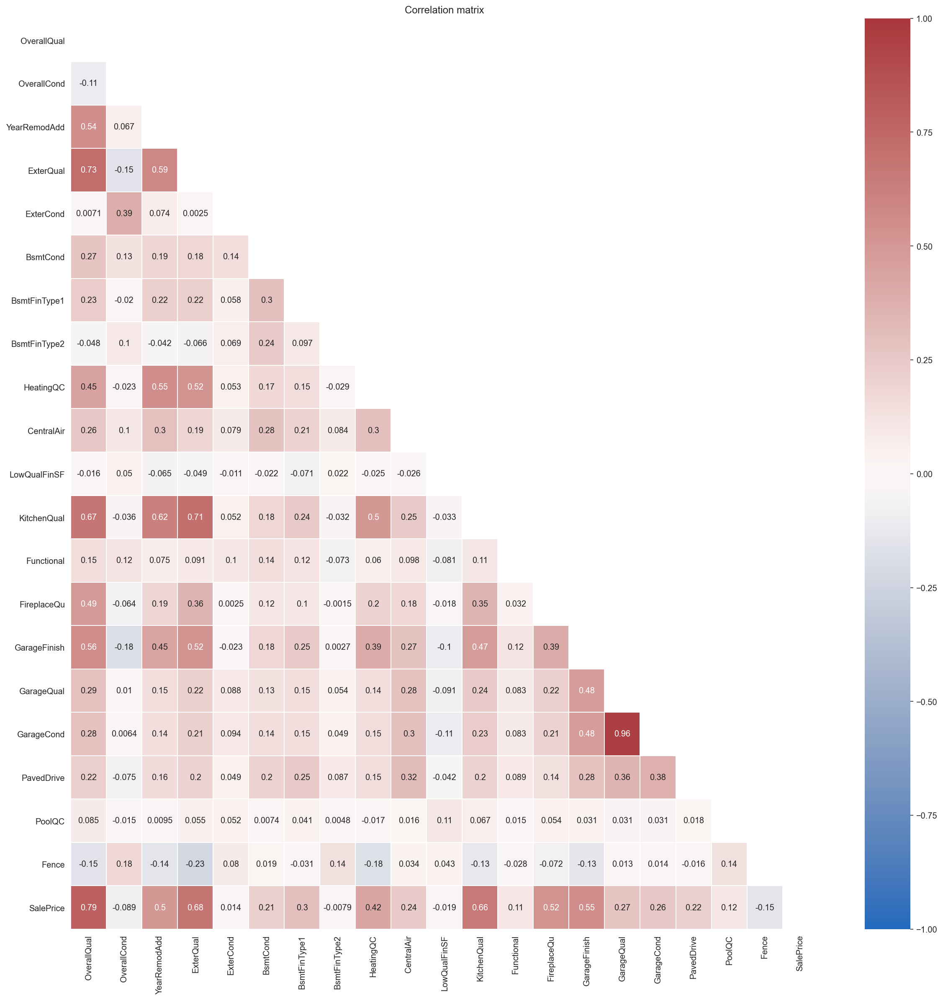

In [239]:
#check correlations
df_corr = explore_df.corr()
plot_corr(df_corr, 20, 20)

## as expected, OverallQual correlates positively with SalePrice

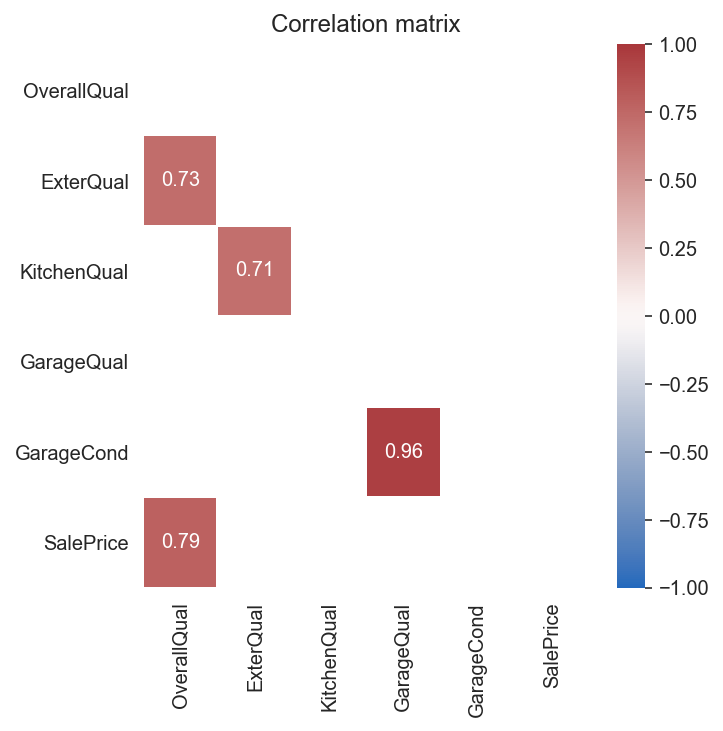

In [240]:
# find high correlations
high_corr = (df_corr.abs() > 0.7) & (df_corr.abs() <1)
df = list(df_corr[high_corr.any()].any(axis=1).index)

# only show the high correlations
df_corr = df_corr[df_corr.loc[df,df]>0.7]
plot_corr(df_corr.loc[df,df], 5,5)

## High correlations are expected & reasonable for: 
## OverallQual & SalePrice
## OverallQual * ExterQual
## GarageQual & GarageCond

## Unexpected correlation
## KitchenQual & ExterQual

##### <span style="color:purple">Sale Features</span>


In [241]:
house[sale_features].dtypes.value_counts()

object    3
int64     2
dtype: int64

In [242]:
# split features into objects & continuous
explore_cols_object = list(house[sale_features].select_dtypes(include=object).columns)
explore_cols_other = list(house[sale_features].select_dtypes(exclude=object).columns)
print(' Categorical Features: \n', explore_cols_object)
print('\n Continuous Features: \n', explore_cols_other)

 Categorical Features: 
 ['MoSold', 'SaleType', 'SaleCondition']

 Continuous Features: 
 ['YrSold', 'SalePrice']


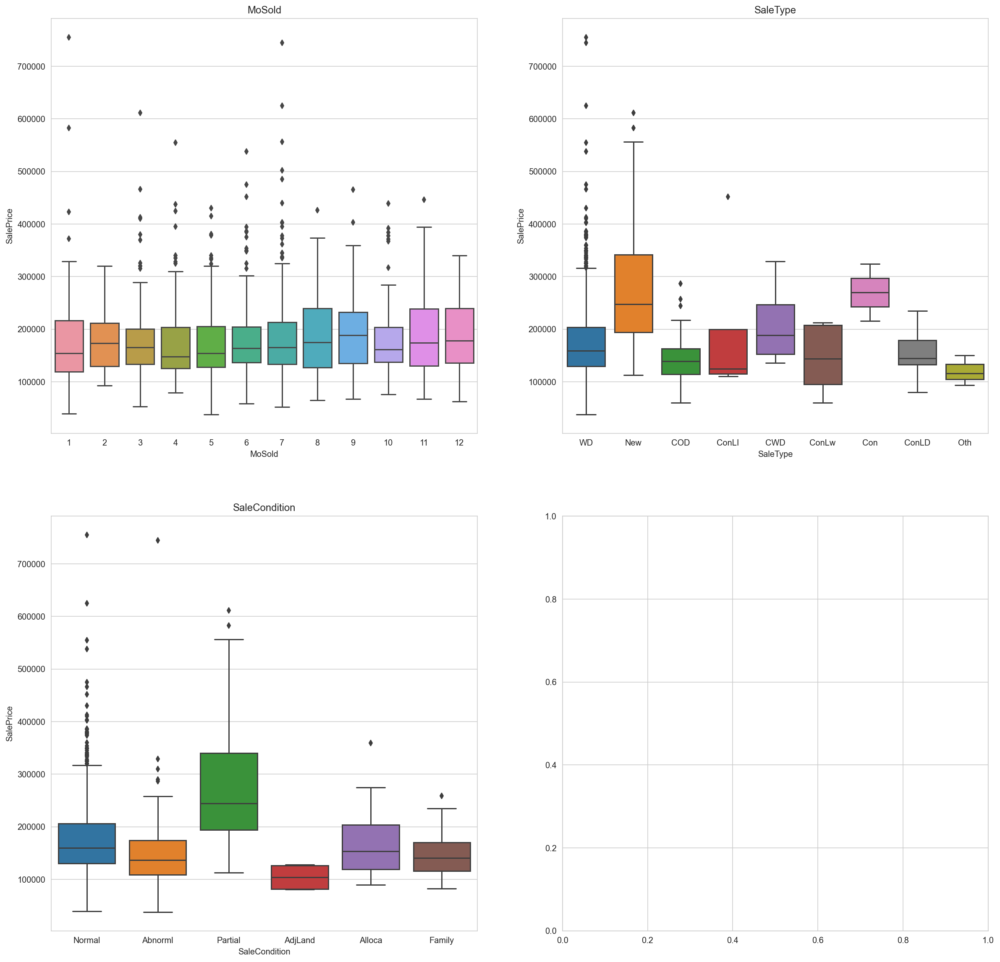

In [243]:
# visualise the categorical features
explore_df = house[list(explore_cols_object) + ['SalePrice']]

# set up subplots
c = 2
r = -(-len(explore_cols_object)//c) # roundup
fig, axes = plt.subplots(r, c, figsize=(20,20))

# iterate through the columns
for layout, col in enumerate(explore_cols_object):    
    sns.boxplot(data=explore_df, y='SalePrice', x=col, ax=axes[layout//2][layout % 2])
    axes[layout//2, layout % 2].set_title(col)                  # modify axis title
    
## MoSold looks reasonably similar SalePrice across the months - take a closer look
## SaleType of 'New' & SaleCondition of 'Partial' could be related - take a close look

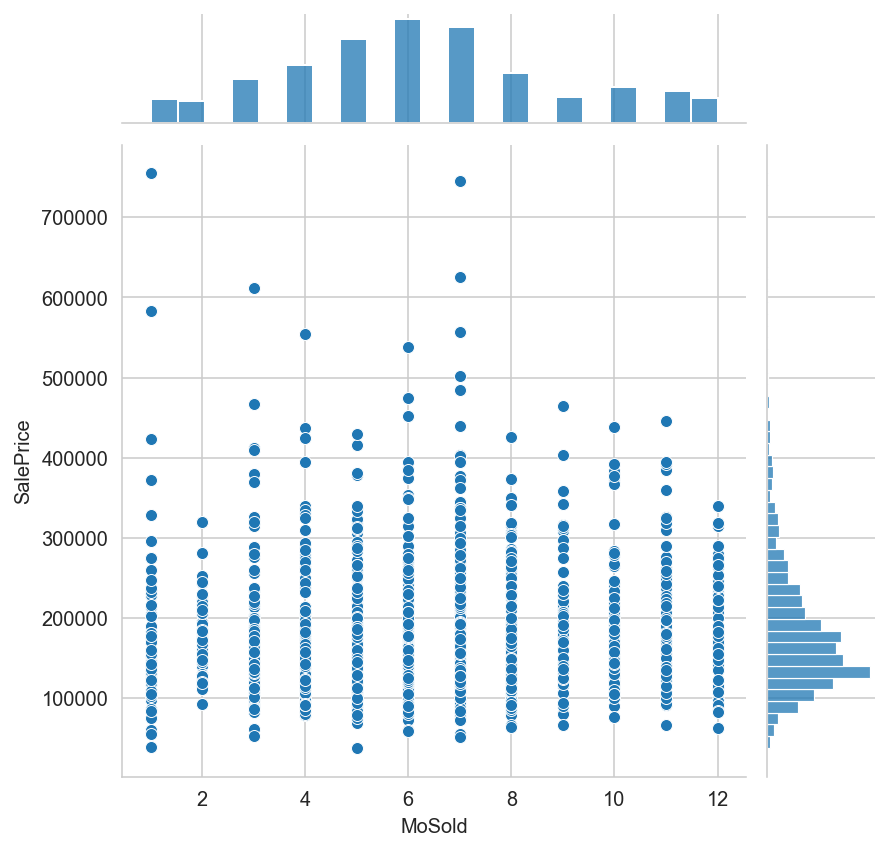

In [244]:
# MoSold vs SalePrice has similar values being sold across the year, 
# although the volume of sales looks to have a seasonal trend, with June/July being the top selling months

sns.jointplot(x=explore_df.MoSold, y=explore_df.SalePrice)

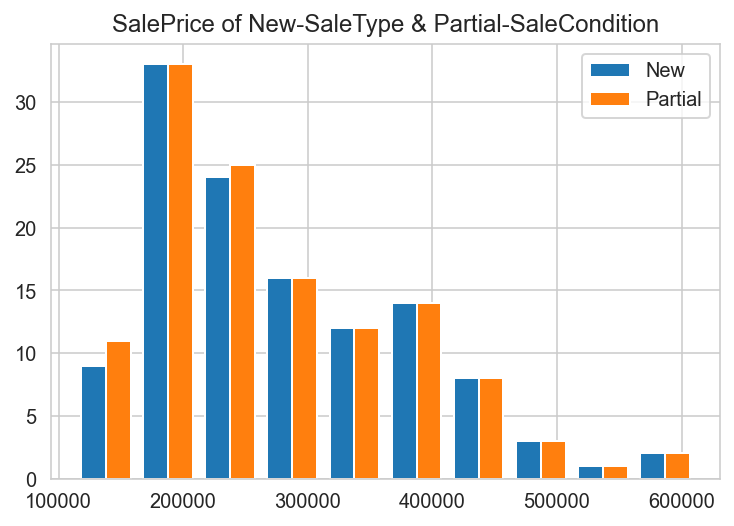

In [245]:
# SaleType of 'New' & SaleCondition of 'Partial' could be related - take a close look
plt.hist(x=[explore_df.SalePrice[explore_df.SaleType == 'New'], 
            explore_df.SalePrice[explore_df.SaleCondition == 'Partial']], 
         label=('New', 'Partial'))
plt.title('SalePrice of New-SaleType & Partial-SaleCondition')
plt.legend(loc='best')
plt.show()

## yes, high covariance

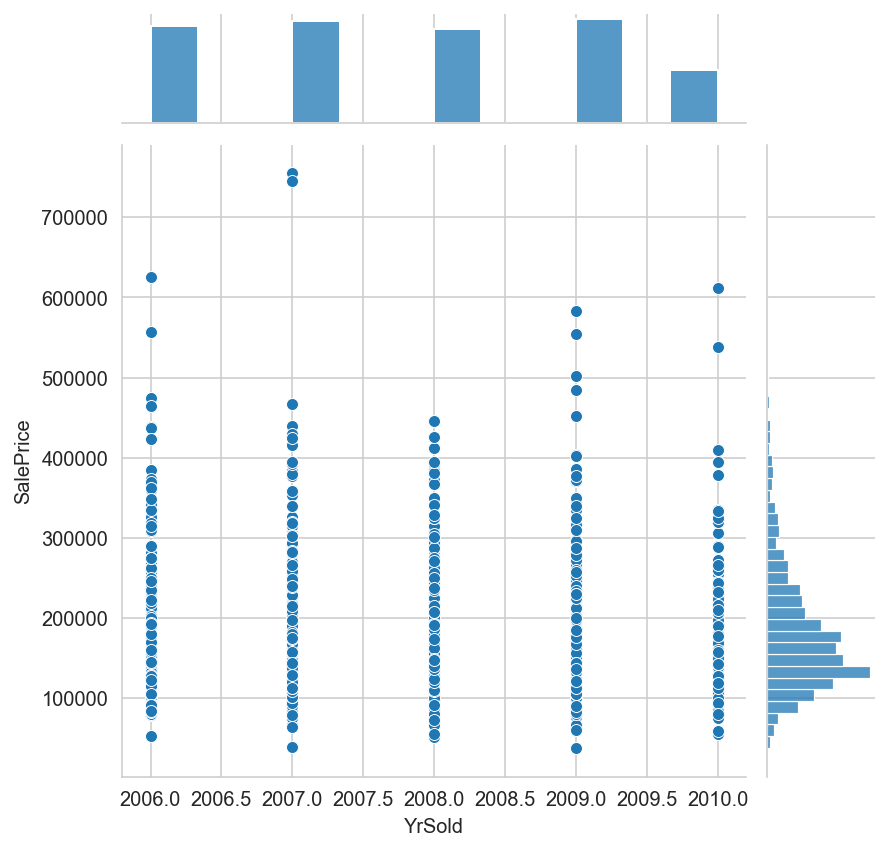

In [246]:
# visualise the continuous features
explore_df = house[list(explore_cols_other)]

sns.jointplot(x=explore_df.YrSold, y=explore_df.SalePrice);

## wonder what the mean & median SalePrice look like across the years

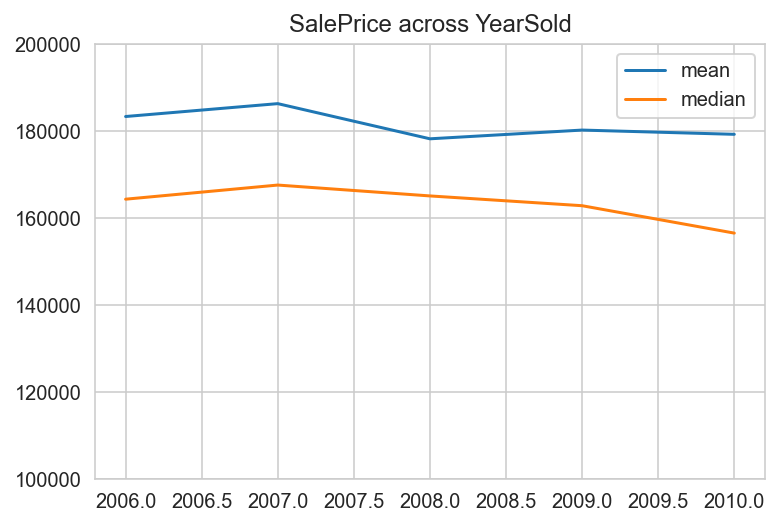

In [247]:
# mean & median SalePrice look like across the years
mean = explore_df.groupby(by='YrSold').mean('SalePrice')
median = explore_df.groupby(by='YrSold').median('SalePrice')

plt.plot(mean, label='mean')
plt.plot(median, label='median')
plt.title('SalePrice across YearSold')
plt.ylim(100000, 200000)
plt.legend(loc='best')
plt.show()

## fairly flat, with a dip in 2008-2010 with GFC (Global Financial Crisis)  
## Delinquency Rate on Single-Family Residential Mortgages peaked at Q1 2010
## https://fred.stlouisfed.org/series/DRSFRMACBS

##### <span style="color:purple">Summary of outliers/columns to drop</span>


In [248]:
# what's the potential cleanup look like?
lst = list(set(feature_observ['outliers']))
lst.sort()
print('number of rows of outliers:', len(lst))
feature_observ['outliers'] = lst
feature_observ

## one column and  only 9 extreme outliers

number of rows of outliers: 9


{'to_drop': ['Utilities'],
 'outliers': [249, 313, 335, 523, 691, 706, 934, 1182, 1298]}

---
<a id='feature_selection_fixed'></a>
### <span style="color:purple">Feature selection: Fixed</span>

[back to index](#index)

In [249]:
print(house_features)
print(feature_observ)

['land_features', 'building_core_features', 'building_other_features', 'sale_features']
{'to_drop': ['Utilities'], 'outliers': [249, 313, 335, 523, 691, 706, 934, 1182, 1298]}


In [250]:
# create a copy of the df for (land_features + building_core_features)
fixed_df = house[list(land_features) + list(building_core_features) + list(sale_features)].copy()
fixed_df.shape

(1450, 53)

In [251]:
# get rid of 'Utilities' & outlier rows
fixed_df.drop(columns='Utilities', inplace=True)
fixed_df.drop(index=feature_observ['outliers'], inplace=True)
fixed_df.shape

(1441, 52)

In [252]:
# how many rows have nulls
lst = fixed_df.isnull().sum()
lst[lst >0]

LotFrontage    256
dtype: int64

In [253]:
# be savage, what does the data look like without NAN rows
fixed_df = fixed_df[fixed_df['LotFrontage'] >= 0]
fixed_df.shape

## retains 1185/1450 ~ 82% of rows - FV included
## retains 1128/1450 ~ 78% of rows - FV dropped

(1185, 52)

In [254]:
fixed_df.head(3)

,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,YearBuilt,MSSubClass,BldgType,HouseStyle,MasVnrArea,Foundation,BsmtQual,BsmtExposure,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,RL,65.0,8450,Pave,NA,4,Lvl,Inside,3,CollgCr,Norm,Norm,2003,60,1Fam,2Story,196,PConc,4,1,706,0,150,856,856,854,1710,1,0,2,1,3,1,8,0,Attchd,2003,2,548,0,61,0,0,0,0,NA,0,2,2008,WD,Normal,208500
1,RL,80.0,9600,Pave,NA,4,Lvl,FR2,3,Veenker,Feedr,Norm,1976,20,1Fam,1Story,0,CBlock,4,4,978,0,284,1262,1262,0,1262,0,1,2,0,3,1,6,1,Attchd,1976,2,460,298,0,0,0,0,0,NA,0,5,2007,WD,Normal,181500
2,RL,68.0,11250,Pave,NA,3,Lvl,Inside,3,CollgCr,Norm,Norm,2001,60,1Fam,2Story,162,PConc,4,2,486,0,434,920,920,866,1786,1,0,2,1,3,1,6,1,Attchd,2001,2,608,0,42,0,0,0,0,NA,0,9,2008,WD,Normal,223500


##### <span style="color:purple">Create dummy columns</span>


In [255]:
# create a list of the categorical features in this df
to_dummy = list(fixed_df.select_dtypes(include='object'))
print(len(to_dummy),'\n', to_dummy)

17 
 ['MSZoning', 'Street', 'Alley', 'LandContour', 'LotConfig', 'Neighborhood', 'Condition1', 'Condition2', 'MSSubClass', 'BldgType', 'HouseStyle', 'Foundation', 'GarageType', 'MiscFeature', 'MoSold', 'SaleType', 'SaleCondition']


In [256]:
# how many values do the categorical features have?
fixed_df[to_dummy].nunique().sum()

## expect to end up with a df = rows(1188), columns(52+130-(2*17))=148

130

In [257]:
# create dummies for categoricals
fixed_df_dummies = pd.get_dummies(data=fixed_df, columns=to_dummy, prefix_sep='_', drop_first=True)
print(fixed_df_dummies.shape)

(1185, 148)


In [258]:
fixed_df_dummies.head(3)

,LotFrontage,LotArea,LotShape,LandSlope,YearBuilt,MasVnrArea,BsmtQual,BsmtExposure,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NA,Alley_Pave,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRNn,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,65.0,8450,4,3,2003,196,4,1,706,0,150,856,856,854,1710,1,0,2,1,3,1,8,0,2003,2,548,0,61,0,0,0,0,0,2008,208500,0,1,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,80.0,9600,4,3,1976,0,4,4,978,0,284,1262,1262,0,1262,0,1,2,0,3,1,6,1,1976,2,460,298,0,0,0,0,0,0,2007,181500,0,1,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,68.0,11250,3,3,2001,162,4,2,486,0,434,920,920,866,1786,1,0,2,1,3,1,6,1,2001,2,608,0,42,0,0,0,0,0,2008,223500,0,1,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0


---
<a id='test_train_split_fixed'></a>
### <span style="color:purple">Split data into test & train, plus Standardise</span>

[back to index](#index)


In [259]:
# what % of data will be going to test & train
fixed_df_dummies.YrSold.value_counts()

## test = 140 (2010) = ~ 12%
## train = 1045 (pre-2010) = ~ 88%

2009    270
2006    263
2007    262
2008    250
2010    140
Name: YrSold, dtype: int64

In [260]:
# split data into X/y/test/train
test = fixed_df_dummies[fixed_df_dummies.YrSold == 2010].copy()
train = fixed_df_dummies[fixed_df_dummies.YrSold != 2010].copy()

print('test / train', test.shape, train.shape)

# test
y_test = test['SalePrice'].copy()
X_test = test.drop(columns='SalePrice')

# train
y_train = train['SalePrice'].copy()
X_train = train.drop(columns='SalePrice')

print('test: X / y', X_test.shape, y_test.shape)
print('train: X / y', X_train.shape, y_train.shape)

test / train (140, 148) (1045, 148)
test: X / y (140, 147) (140,)
train: X / y (1045, 147) (1045,)


In [261]:
# Standardise training data so it's ready if I want to use it in the models
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
Xs_train = ss.fit_transform(X_train)

In [262]:
# Standardise test data
Xs_test = ss.transform(X_test)

---
<a id='train_model_fixed'></a>
### <span style="color:purple">Train models</span>

[back to index](#index)


##### <span style="color:purple">Linear Regression</span>


In [263]:
from sklearn.linear_model import LinearRegression

#initialise & fit
lin_reg = LinearRegression()
lin_reg = lin_reg.fit(X_train, y_train)

## model scored well (~89%) without standardising X, coefs ||e+6|| 
## model scored similar (~89%) when X standardised, and top 11 coefs > abs magnitude of e+15

## final version here is not standardised

In [264]:
print('r2 train:',lin_reg.score(X_train, y_train))
print('r2 test:', lin_reg.score(X_test, y_test))

r2 train: 0.9055912952306144
r2 test: 0.893967372903305


In [265]:
# get predictions
y_train_predict = lin_reg.predict(X_train)
y_predict = lin_reg.predict(X_test)

In [266]:
print(y_predict.min(), y_predict.max())
y_test.mean(), y_predict.mean(), y_predict.std()

47421.616402768064 567971.0622050404


(179949.8142857143, 177476.80527899586, 82296.88610471397)

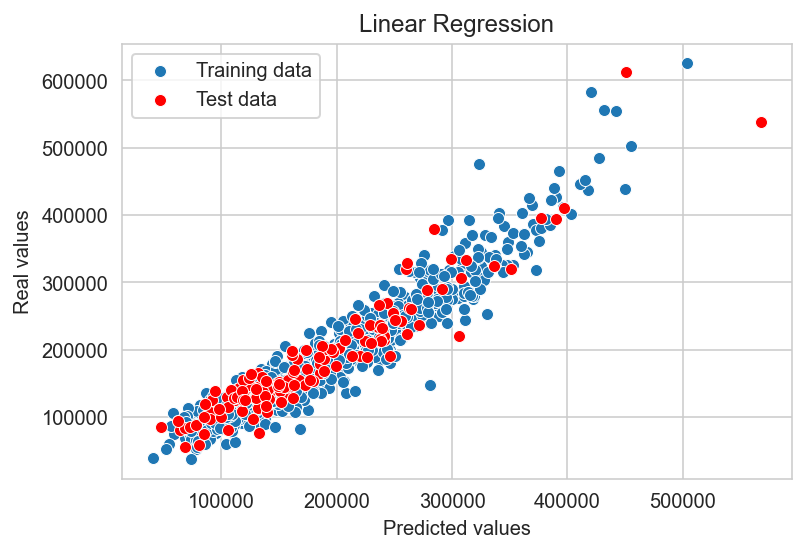

In [267]:
# plot predictions
plot_predictions(y_train, y_train_predict, y_test, y_predict, 'Linear Regression')

## reasonable fit up to $300,000, then more variations

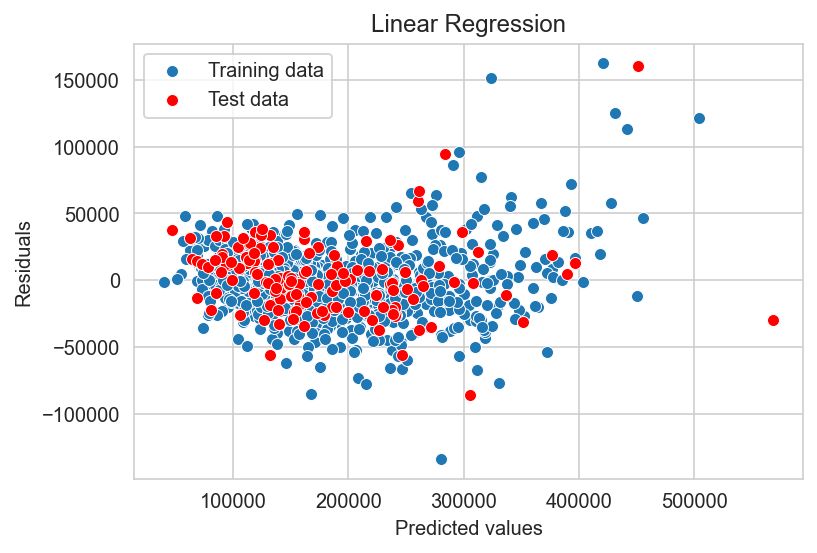

In [268]:
# Plot residuals
plot_residuals(y_train, y_train_predict, y_test, y_predict, 'Linear Regression')

## the residuals show Heteroscedasticity clearly breaking an assumption Linear Regression 
## (plus the other Linear Regression assumptions broken by this dataset)
## look at coefficients of this model for interest only

## >> use different model with more relaxed assumptions to predict SalePrice of fixed features

mean: 2473.0090067184196 median: 1117.6787731517106 std: 27998.3858103749


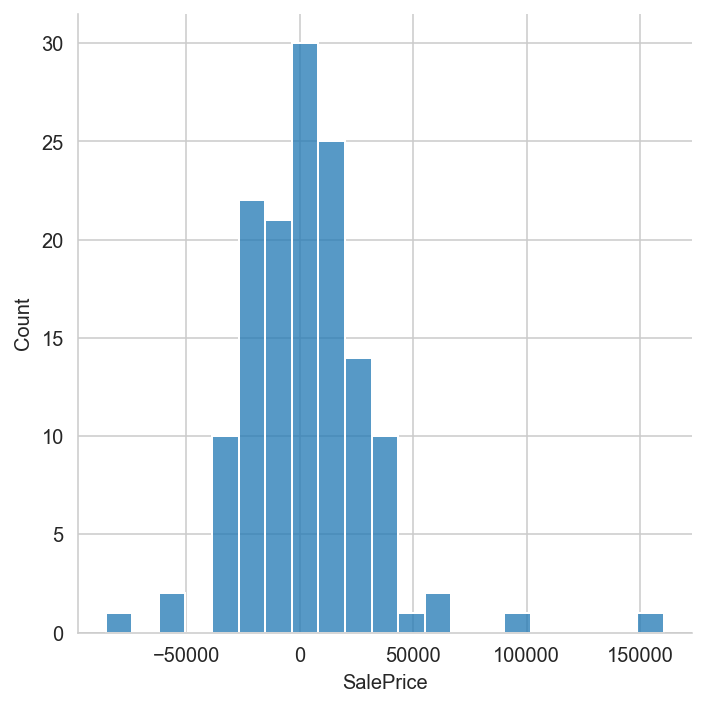

In [269]:
# plot distribution of residuals
plot_residual_dist(y_test, y_predict)

## for interest only - mean is near 0

In [270]:
# put features & coefs into a datafram
lr_coefs = coefs_to_dataframe(list(X_train.columns), lin_reg.coef_)
lr_coefs

,feature,coefs,abs_coefs
119,GarageType_NA,183667.320758,183667.320758
81,Condition2_PosA,76317.423046,76317.423046
68,Neighborhood_StoneBr,60972.408920,60972.408920
113,Foundation_Wood,-58012.255933,58012.255933
122,MiscFeature_TenC,-56114.859820,56114.859820
...,...,...,...
0,LotFrontage,2.684299,2.684299
9,BsmtFinSF2,2.294591,2.294591
1,LotArea,1.874130,1.874130
10,BsmtUnfSF,-1.825253,1.825253


In [271]:
#look at top of magnitude
lr_coefs.head(10)

,feature,coefs,abs_coefs
119,GarageType_NA,183667.320758,183667.320758
81,Condition2_PosA,76317.423046,76317.423046
68,Neighborhood_StoneBr,60972.408920,60972.408920
113,Foundation_Wood,-58012.255933,58012.255933
122,MiscFeature_TenC,-56114.859820,56114.859820
62,Neighborhood_NridgHt,44425.399529,44425.399529
37,Street_Pave,37803.612446,37803.612446
135,SaleType_Con,31390.945558,31390.945558
139,SaleType_New,31272.426080,31272.426080
47,Neighborhood_Blueste,30251.166948,30251.166948


In [272]:
# look at bottom of magnitude
lr_coefs.tail(10)

,feature,coefs,abs_coefs
5,MasVnrArea,15.988437,15.988437
28,EnclosedPorch,14.598422,14.598422
14,GrLivArea,13.777024,13.777024
26,WoodDeckSF,12.010687,12.010687
32,MiscVal,-6.606051,6.606051
0,LotFrontage,2.684299,2.684299
9,BsmtFinSF2,2.294591,2.294591
1,LotArea,1.874130,1.874130
10,BsmtUnfSF,-1.825253,1.825253
25,GarageArea,-1.814952,1.814952


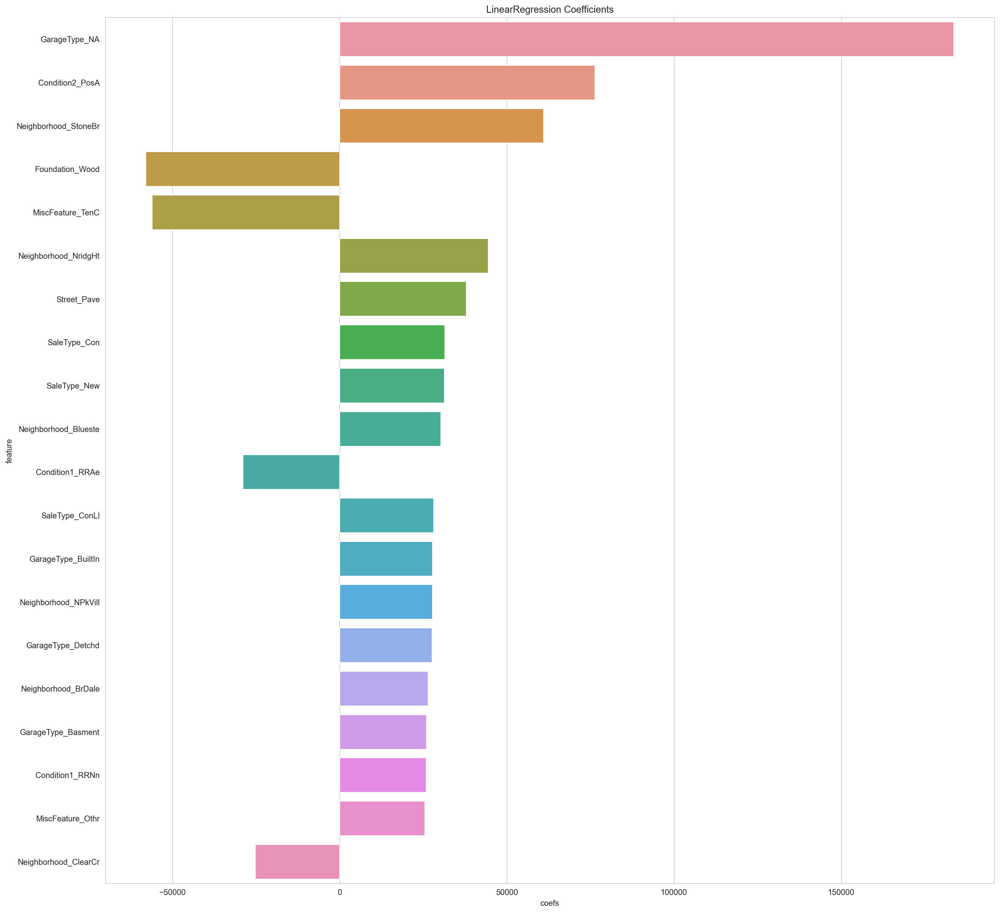

In [273]:
# visualise the coefficients of top 20 magnitude coefficients
plt.figure(figsize=(20,20))

g = sns.barplot(data=lr_coefs[0:20], y='feature', x='coefs', orient='h')
g.set_title('LinearRegression Coefficients');

## highest magnitude coefs have a number of Neighbourhoods as expected 
## but Garage(=none) being the biggest influence on SalePrice is more evidence that this isn't the right model to use

## >> onward to the next model!

##### <span style="color:purple">Lasso CV</span>

In [274]:
from sklearn.linear_model import LassoCV

#initialise & fit 
lass_cv = LassoCV(cv=5, verbose=True)
lass_cv.fit(Xs_train, y_train)

## model scored well (~83%) without standardising X, but only kept 13 features
## scored better (89%) when X standardised, and kept 66 features, including many Neighbourhoods

## as this dataset has many skews and outliers - standardise X

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.3s finished


LassoCV(cv=5, verbose=True)

In [275]:
print('r2 train:',lass_cv.score(Xs_train, y_train))
print('r2 test:', lass_cv.score(Xs_test, y_test))

r2 train: 0.8911876024104037
r2 test: 0.8941269319360662


In [276]:
# get predictions
y_train_predict = lass_cv.predict(Xs_train)
y_predict = lass_cv.predict(Xs_test)

In [277]:
print(y_predict.min(), y_predict.max())
y_test.mean(), y_predict.mean(), y_predict.std()

42088.88341269852 515169.55705302523


(179949.8142857143, 175843.4317887872, 77432.35536513155)

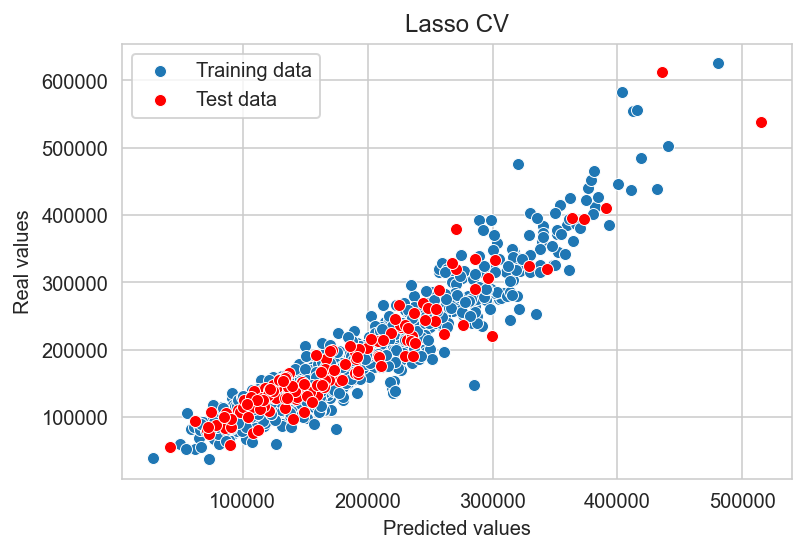

In [278]:
# plot predictions
plot_predictions(y_train, y_train_predict, y_test, y_predict, 'Lasso CV')

## reasonable fit up to $300,000, then more variations
## as the mean of SalePrice is ~181000, model does well for bulk of dataset

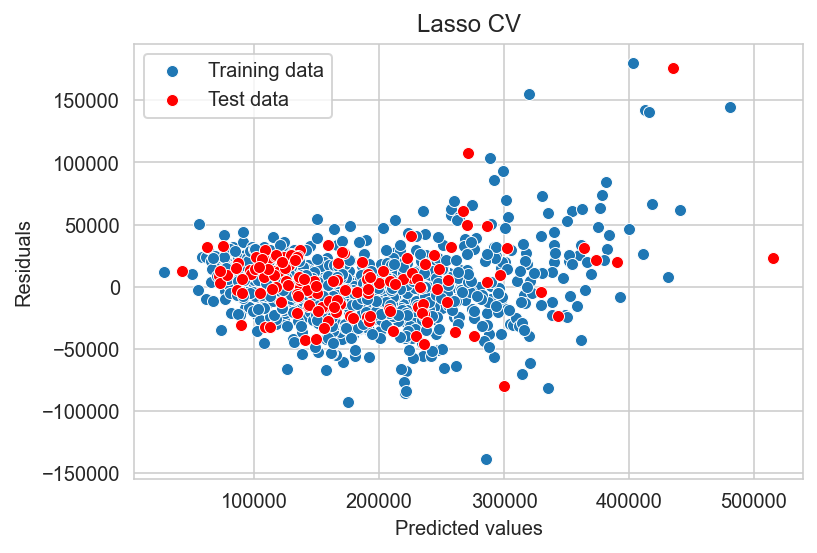

In [279]:
# Plot residuals
plot_residuals(y_train, y_train_predict, y_test, y_predict, 'Lasso CV')

## the residuals again show Heteroscedasticity but that is not a constraint for Lasso models.
## under 250k, the residuals are reasonably well distributed above & below 0, with a negative bias

mean: 4106.382496927094 median: 5289.795397095804 std: 27783.030535988466


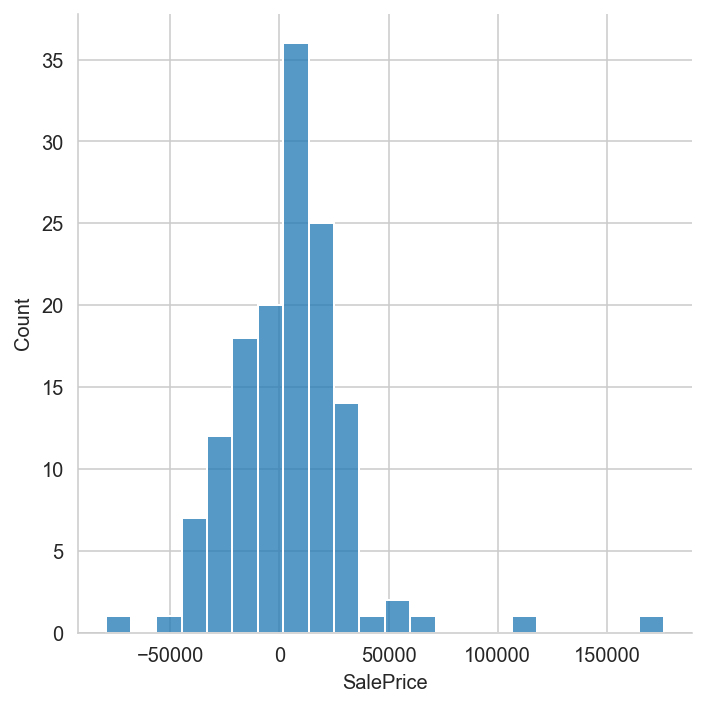

In [280]:
# plot distribution of residuals
plot_residual_dist(y_test, y_predict)

## mean of $4k error for mean sale of $181k is ~ 2% error (FV included)

In [281]:
# put features & coefs into a datafram
lass_coefs = coefs_to_dataframe(list(X_train.columns), lass_cv.coef_)

print('*zeroed features* :', lass_coefs.feature[lass_coefs.coefs==0].count())
print('*non-zeroed features* ', lass_coefs.feature[lass_coefs.coefs!=0].count())

lass_coefs = lass_coefs[lass_coefs['abs_coefs'] > 0]
lass_coefs

*zeroed features* : 81
*non-zeroed features*  66


,feature,coefs,abs_coefs
14,GrLivArea,30951.057763,30951.057763
62,Neighborhood_NridgHt,11307.345238,11307.345238
4,YearBuilt,10002.470810,10002.470810
8,BsmtFinSF1,9134.660075,9134.660075
68,Neighborhood_StoneBr,7302.796097,7302.796097
...,...,...,...
41,LandContour_Low,-74.688262,74.688262
0,LotFrontage,59.037785,59.037785
145,SaleCondition_Normal,20.147275,20.147275
102,HouseStyle_1.5Unf,16.669836,16.669836


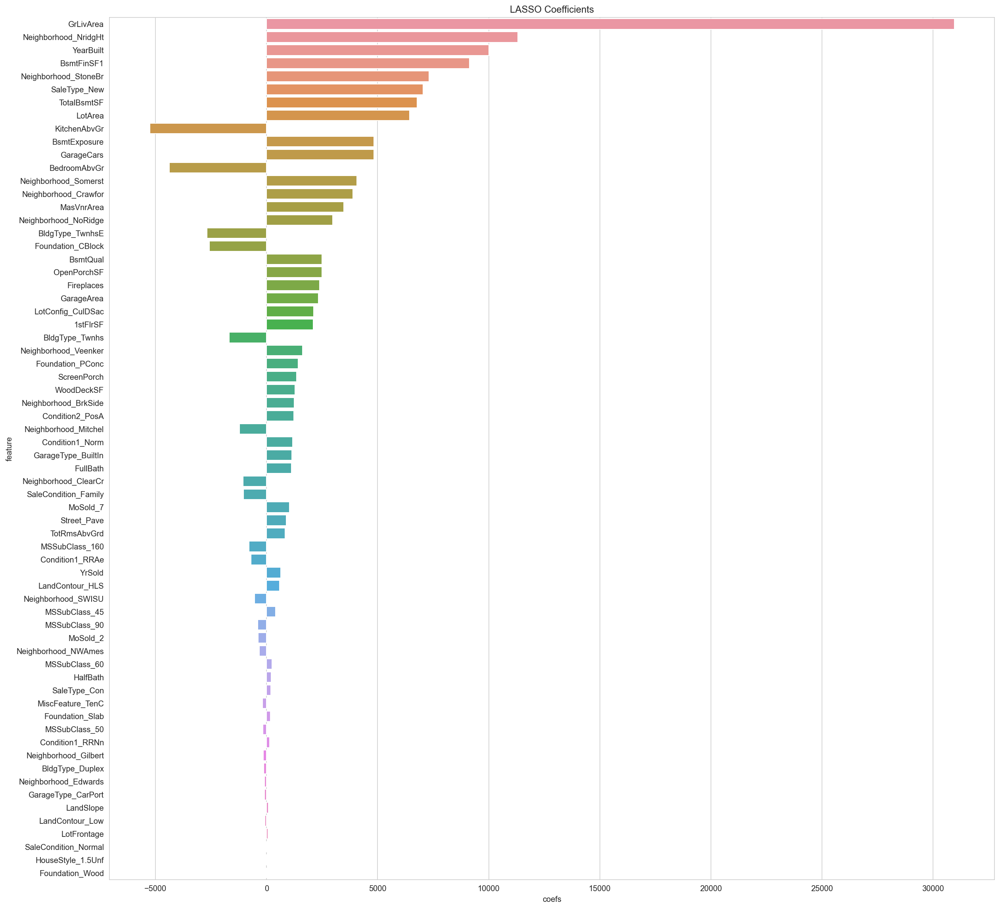

In [282]:
# visualise the coefficients
plt.figure(figsize=(20,20))

g = sns.barplot(data=lass_coefs, y='feature', x='coefs', 
            orient='h')
g.set_title('LASSO Coefficients');

## GrLivArea is 3 times more influencial than the next coef (Neighborhood_NridgHt)
## many neighbourhoods (as expected) are positive & negative influences on SalePrice

## GrLivArea, 1std=525 sqft (max 5642 sqft, min 334 sqft) = approx $60/sqft 

In [283]:
# which Neighbourhoods are used for coefs
print(len(lass_coefs[lass_coefs['feature'].str.contains('Neighborhood')]))
lass_coefs[lass_coefs['feature'].str.contains('Neighborhood')]

13


,feature,coefs,abs_coefs
62,Neighborhood_NridgHt,11307.345238,11307.345238
68,Neighborhood_StoneBr,7302.796097,7302.796097
67,Neighborhood_Somerst,4070.726610,4070.726610
52,Neighborhood_Crawfor,3885.617112,3885.617112
61,Neighborhood_NoRidge,2982.623131,2982.623131
70,Neighborhood_Veenker,1613.404299,1613.404299
49,Neighborhood_BrkSide,1242.107785,1242.107785
57,Neighborhood_Mitchel,-1218.039530,1218.039530
50,Neighborhood_ClearCr,-1054.156176,1054.156176
64,Neighborhood_SWISU,-547.341567,547.341567


In [284]:
# what is the reference Neighbourhood
fixed_df_dummies.columns[fixed_df_dummies.columns.str.contains('Neighborhood')]

## Bloomington Heights - reference Neighbourhood

Index(['Neighborhood_Blueste', 'Neighborhood_BrDale', 'Neighborhood_BrkSide',
       'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Crawfor',
       'Neighborhood_Edwards', 'Neighborhood_Gilbert', 'Neighborhood_IDOTRR',
       'Neighborhood_MeadowV', 'Neighborhood_Mitchel', 'Neighborhood_NAmes',
       'Neighborhood_NPkVill', 'Neighborhood_NWAmes', 'Neighborhood_NoRidge',
       'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_SWISU',
       'Neighborhood_Sawyer', 'Neighborhood_SawyerW', 'Neighborhood_Somerst',
       'Neighborhood_StoneBr', 'Neighborhood_Timber', 'Neighborhood_Veenker'],
      dtype='object')

---
<a id='q1_summary'></a>
### <span style="color:purple">Question 1 Summary</span>

[back to index](#index)

Trialed 2 models:  
- Linear Regression
- Lasso CV

Used **Lasso** model's results for a number of reasons:  
* More relaxed assumptions around the data. (As compared with Linear Regression)
* Feature selection properties - wanted to reduce the number of feature contributing to the predictions.  

This model:
* kept 66 features (and zero'd 81)
* explained 89% of the variance (R squared).
* residual mean of ~4k, which is approx 2% of the mean SalePrice.
* residuals vs y_hat plot starts to fan out > $250k.  
  
Features influencing the model:  
* Above **Ground Living Area** (GrLivArea) is three times more influencial than the next coef (Neighborhood_NridgHt). For context, GrLivArea has an influence of approx $60/sqft. 
* As expected, many **neighbourhoods** (13 out of 25) positively or negatively influenced the SalePrice, with 5 as positive influencers in the top 20 features. Bloomington Heights is the reference Neighbourhood, and the neighbourhood influencing this model can be seen on this map: 
https://www.google.com/maps/d/viewer?mid=1MNhFkfZ9VpYGC1prvraYi25sjAik7XSH&usp=sharing



**Top 3 fixed features to consider when buying a property**  

- How large are the indoor areas?
- Which suburb is it in?
- When was it built?

---
---

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 2. Determine any value of *changeable* property characteristics unexplained by the *fixed* ones.

---

Q2. Now that you have a model that estimates the price of a house based on its static characteristics, we can move forward with part 2 of the project: what are the costs/benefits of renovateable features such as quality, condition, and renovations?

To isolate the effect of the renovateable features on the sale price one way of doing this is to use the residuals from the first model as your target variable in the second model. The residuals from the first model (training and testing) represent the variance in price unexplained by the fixed characteristics. You will use the renovateable features as the predictors for this second model.  

 
---

### **Your goals for question two:**

Use the features in the data that are renovatable as predictors for your second model. This second model will predict the variance/residuals from the first model.  As with Q1 , train the model on pre-2010 data and evaluate its performance on the 2010 houses.

How well has your chosen model done?  


Which renovateable features are the most important in your second model .  Articulate your findings and make sense of the results.

 
Do you trust your model?   

 

##### <span style="color:purple">Calculate residuals from Lasso model as targets</span>


In [285]:
# get predictions from Lasso model on standardised X
y_train_predict = lass_cv.predict(Xs_train)
y_test_predict = lass_cv.predict(Xs_test)

In [286]:
# assign to residuals targets
residuals_train = y_train - y_train_predict
residuals_test = y_test - y_test_predict
print('train residuals: mean', residuals_train.mean())
print('test residuals: mean', residuals_test.mean())

train residuals: mean -8.020959972764886e-12
test residuals: mean 4106.382496927094


---
<a id='feature_selection_reno'></a>
### <span style="color:purple">Feature selection: Renovatable</span>

[back to index](#index)

In [287]:
# reminder of feature groups & outliers removed from data for fixed features
print(house_features)
print(feature_observ)

['land_features', 'building_core_features', 'building_other_features', 'sale_features']
{'to_drop': ['Utilities'], 'outliers': [249, 313, 335, 523, 691, 706, 934, 1182, 1298]}


In [288]:
# create a copy of the df for building_other_features
reno_df = house[list(building_other_features) + list(sale_features)].copy()
reno_df.shape

(1450, 32)

In [289]:
# get rid of outlier rows to match rows of fixed models - need to match rows for predictions
reno_df.drop(index=feature_observ['outliers'], inplace=True)
reno_df.shape

(1441, 32)

In [290]:
# how many rows have nulls
lst = reno_df.isnull().sum()
lst[lst >0]

Electrical    1
dtype: int64

In [291]:
# what are the other values in this feature?
print(reno_df.Electrical.value_counts())
reno_df[reno_df.Electrical.isna()]

SBrkr    1319
FuseA      90
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64


,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,BsmtCond,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,LowQualFinSF,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1379,5,5,2007,Gable,CompShg,VinylSd,VinylSd,None,3,3,3,1,1,GasA,4,1,NaN,0,4,8,0,3,3,3,2,0,0,5,2008,WD,Normal,167500


In [292]:
# house sold in 2008 >> part of training data - assign most common value
# assume Electrical value should be mode, 'SBrkr'
reno_df.loc[1379,'Electrical'] = 'SBrkr'
print(reno_df.Electrical.value_counts())

SBrkr    1320
FuseA      90
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64


In [293]:
# find other rows which were dropped from fixed_df because of nulls
dropped_rows_fixed_df = list(house[house.LotFrontage.isna()].index)
len(dropped_rows_fixed_df)

259

In [294]:
#remove same rows from reno_df
reno_df.drop(index=dropped_rows_fixed_df, errors='ignore', inplace=True)
reno_df.shape

## retains 1185/1450 ~ 82% of rows - FV included
## retains 1128/1450 ~ 78% of rows - FV dropped

(1185, 32)

##### <span style="color:purple">Create dummy columns</span>


In [295]:
# create a list of the categorical features in this df
to_dummy = list(reno_df.select_dtypes(include='object'))
print(len(to_dummy),'\n', to_dummy)

10 
 ['RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Heating', 'Electrical', 'MoSold', 'SaleType', 'SaleCondition']


In [296]:
# how many values do the categorical features have?
reno_df[to_dummy].nunique().sum()

## expect to end up with a df = rows(1188), columns(32+83-(2*10))=95

83

In [297]:
# create dummies for categoricals
reno_df_dummies = pd.get_dummies(data=reno_df, columns=to_dummy, prefix_sep='_', drop_first=True)
print(reno_df_dummies.shape)

(1185, 95)


---
<a id='test_train_split_reno'></a>
### <span style="color:purple">Split data into test & train, plus Standardise</span>

[back to index](#index)


In [298]:
# what % of data will be going to test & train
reno_df_dummies.YrSold.value_counts()

## test = 140 (2010) = ~ 11.8%
## train = 1048 (pre-2010) = ~ 88.2%

2009    270
2006    263
2007    262
2008    250
2010    140
Name: YrSold, dtype: int64

In [299]:
# split data into X/y/test/train
# use residuals for targets
# change variable names to ensure no variables inadvertantly keeping values from previous section
test = reno_df_dummies[reno_df_dummies.YrSold == 2010].copy()
train = reno_df_dummies[reno_df_dummies.YrSold != 2010].copy()

print('test / train', test.shape, train.shape)

# test
y_test_r = residuals_test
X_test_r = test.drop(columns='SalePrice')

# train
y_train_r = residuals_train
X_train_r = train.drop(columns='SalePrice')

print('test: X / y', X_test_r.shape, y_test_r.shape)
print('train: X / y', X_train_r.shape, y_train_r.shape)

test / train (140, 95) (1045, 95)
test: X / y (140, 94) (140,)
train: X / y (1045, 94) (1045,)


In [300]:
# Standardise training data so it's ready if I want to use it in the models
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
Xs_train_r = ss.fit_transform(X_train_r)

In [301]:
# Standardise test data
Xs_test_r = ss.transform(X_test_r)

---
<a id='train_model_reno'></a>
### <span style="color:purple">Train models</span>

[back to index](#index)


##### <span style="color:purple">Linear Regression</span>


In [302]:
from sklearn.linear_model import LinearRegression

#initialise & fit 
lin_reg_r = LinearRegression()
lin_reg_r = lin_reg_r.fit(X_train_r, y_train_r)

## model scored badly (-6.18e+24) when X standardised
## scored much better (~13.4%) when X not standardised

In [303]:
print('r2 train:',lin_reg_r.score(X_train_r, y_train_r))
print('r2 test:', lin_reg_r.score(X_test_r, y_test_r))

## r2 of 0.15 is good, but not sure if Linear Regression is valid > check the residuals

r2 train: 0.28684958635113755
r2 test: 0.1524336458210066


In [304]:
y_train_predict = lin_reg_r.predict(X_train_r)
y_predict = lin_reg_r.predict(X_test_r)

In [305]:
print(y_predict.min(), y_predict.max())
y_test_r.mean(), y_predict.mean(), y_predict.std()

-52238.78265844559 38223.29577617388


(4106.382496927094, 1160.0956496047709, 13158.718559810015)

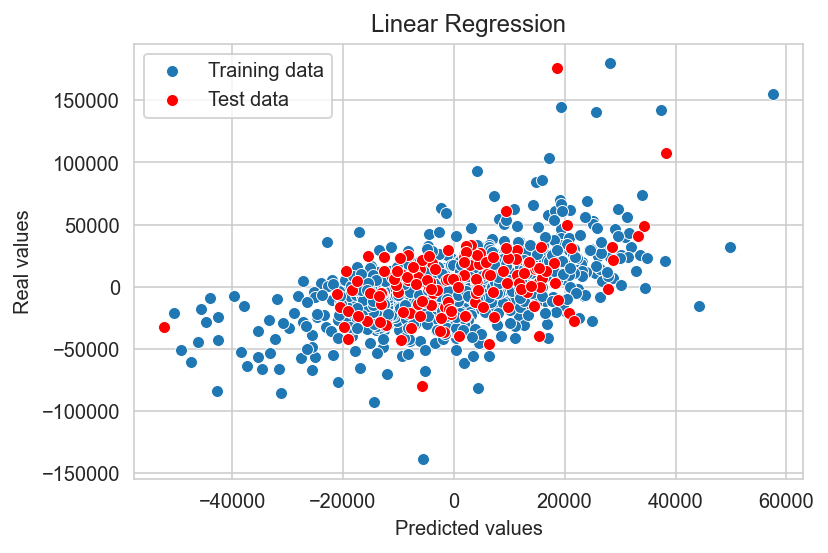

In [306]:
# plot predictions
plot_predictions(y_train_r, y_train_predict, y_test_r, y_predict, 'Linear Regression')


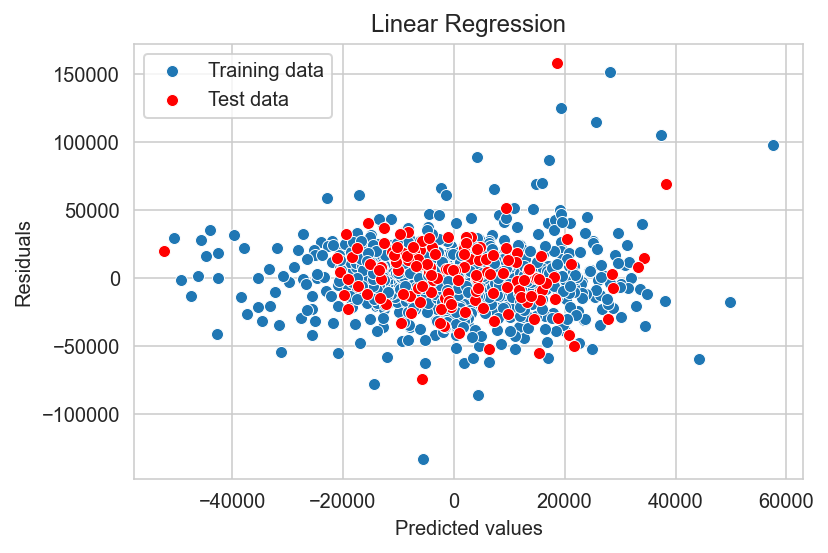

In [307]:
# Plot residuals
plot_residuals(y_train_r, y_train_predict, y_test_r, y_predict, 'Linear Regression')

## residuals is more like white noise, 
## but other assumptions of Linear Regression are likely to have been violated.

mean: 2946.2868473223216 median: 4445.087966039035 std: 25406.508770810477


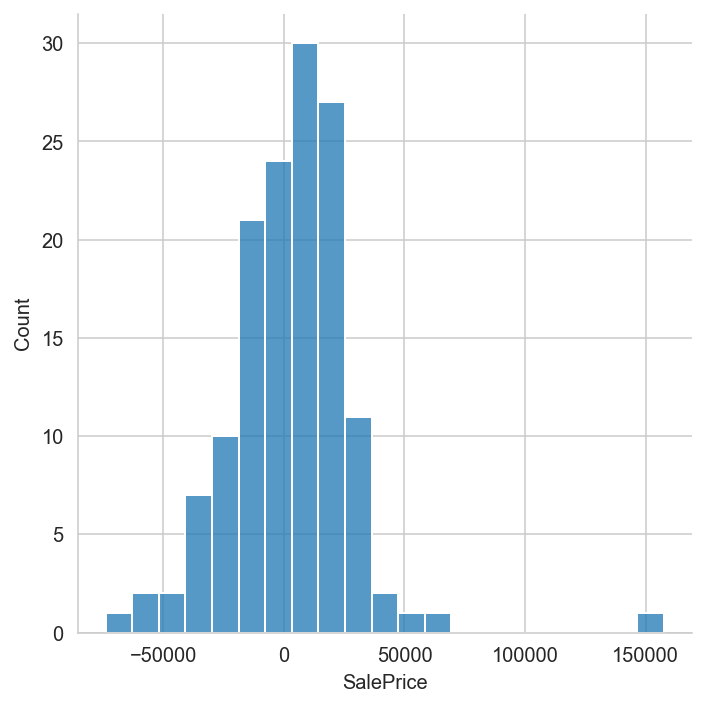

In [308]:
# plot distribution of residuals
plot_residual_dist(y_test_r, y_predict)

## mean ~$3k, therefore violates linear regression assumptions

In [309]:
# put features & coefs into a datafram
lr_r_coefs = coefs_to_dataframe(list(X_train_r.columns), lin_reg_r.coef_)
lr_r_coefs

,feature,coefs,abs_coefs
25,RoofMatl_Membran,6.723438e+04,6.723438e+04
24,RoofStyle_Mansard,4.579769e+04,4.579769e+04
64,Heating_OthW,-4.307803e+04,4.307803e+04
52,Exterior2nd_Other,-3.950992e+04,3.950992e+04
23,RoofStyle_Hip,3.902116e+04,3.902116e+04
...,...,...,...
20,YrSold,-2.641713e+02,2.641713e+02
56,Exterior2nd_VinylSd,-2.049097e+02,2.049097e+02
2,YearRemodAdd,-5.354339e+01,5.354339e+01
10,LowQualFinSF,-3.372239e+01,3.372239e+01


In [310]:
#look at top of magnitude
lr_r_coefs.head(10)

,feature,coefs,abs_coefs
25,RoofMatl_Membran,67234.380259,67234.380259
24,RoofStyle_Mansard,45797.694298,45797.694298
64,Heating_OthW,-43078.029408,43078.029408
52,Exterior2nd_Other,-39509.915933,39509.915933
23,RoofStyle_Hip,39021.156036,39021.156036
22,RoofStyle_Gambrel,38706.240161,38706.240161
21,RoofStyle_Gable,35736.714521,35736.714521
36,Exterior1st_ImStucc,-27785.253377,27785.253377
26,RoofMatl_Roll,-20296.956624,20296.956624
29,RoofMatl_WdShngl,19786.516992,19786.516992


In [311]:
# look at bottom of magnitude
lr_r_coefs.tail(10)

,feature,coefs,abs_coefs
46,Exterior2nd_BrkFace,5.839701e+02,5.839701e+02
67,Electrical_FuseP,5.334523e+02,5.334523e+02
17,PavedDrive,-3.672713e+02,3.672713e+02
6,BsmtFinType1,3.346208e+02,3.346208e+02
19,Fence,-2.691244e+02,2.691244e+02
20,YrSold,-2.641713e+02,2.641713e+02
56,Exterior2nd_VinylSd,-2.049097e+02,2.049097e+02
2,YearRemodAdd,-5.354339e+01,5.354339e+01
10,LowQualFinSF,-3.372239e+01,3.372239e+01
30,Exterior1st_AsphShn,-3.346941e-10,3.346941e-10


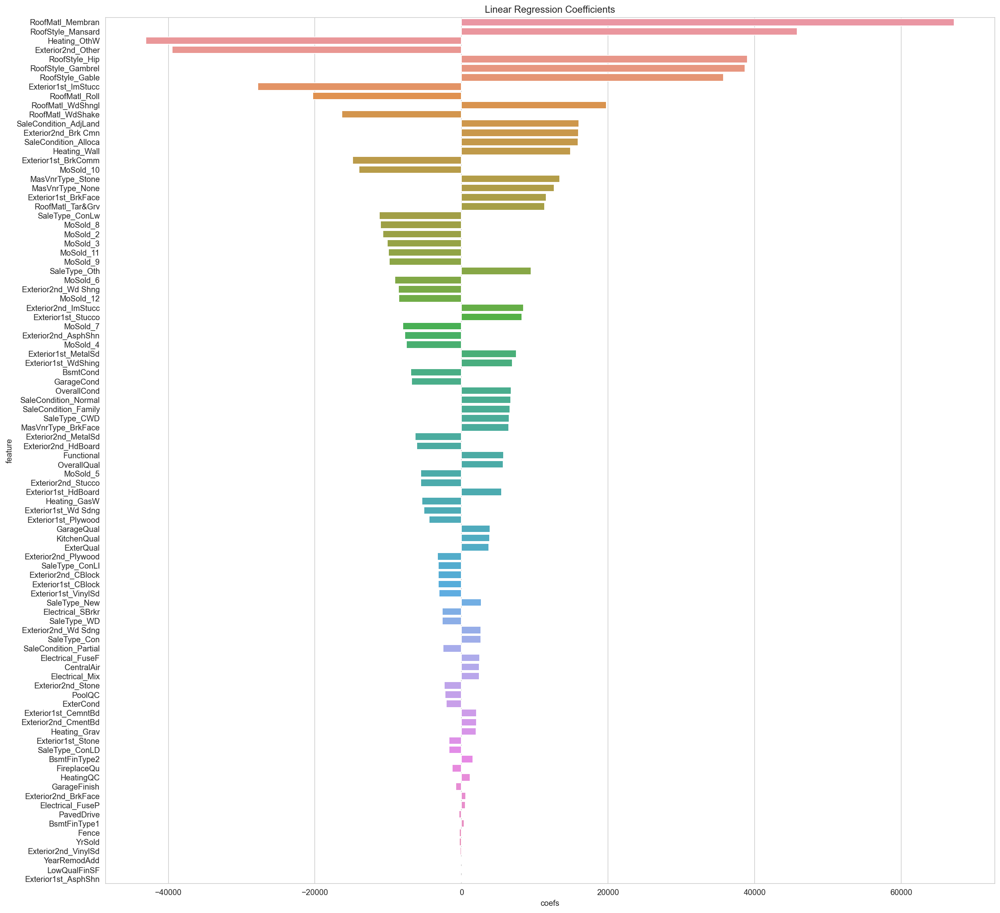

In [312]:
# visualise the coefficients
plt.figure(figsize=(20,20))

g = sns.barplot(data=lr_r_coefs, y='feature', x='coefs', orient='h')
g.set_title('Linear Regression Coefficients');

In [313]:
## Linear Regression assumptions violated - residual mean !=0
## Roof Style & Roof Material as highest influencing coefficients is unintuitive

## >> on to next model

##### <span style="color:purple">Ridge CV</span>

In [314]:
# what does ridge model predict?
from sklearn.linear_model import RidgeCV

In [315]:
# initialise & search for optimal alpha
ridge_alphas = np.logspace(0, 5, 500)

optimal_ridge = RidgeCV(alphas=ridge_alphas, cv=5)

# fit optimal alpha
optimal_ridge.fit(Xs_train_r, y_train_r)
print(optimal_ridge.alpha_)


495.8962013837212


In [316]:
print('r2 train:',optimal_ridge.score(Xs_train_r, y_train_r))
print('r2 test:', optimal_ridge.score(Xs_test_r, y_test_r))

## r2 of 0.16 is good, check residual plots

## model scored (~14) when X standardised
## model scored (~16%) when X not standardised

# given the range in var of features >> go with standardised X

r2 train: 0.2446055191250951
r2 test: 0.143427241990969


In [317]:
# get predictions
y_train_predict = optimal_ridge.predict(Xs_train_r)
y_predict = optimal_ridge.predict(Xs_test_r)

In [318]:
print(y_predict.min(), y_predict.max())
y_test_r.mean(), y_predict.mean(), y_predict.std()

-35855.23026589161 29245.968715733336


(4106.382496927094, 1011.5814419484814, 9513.455303886747)

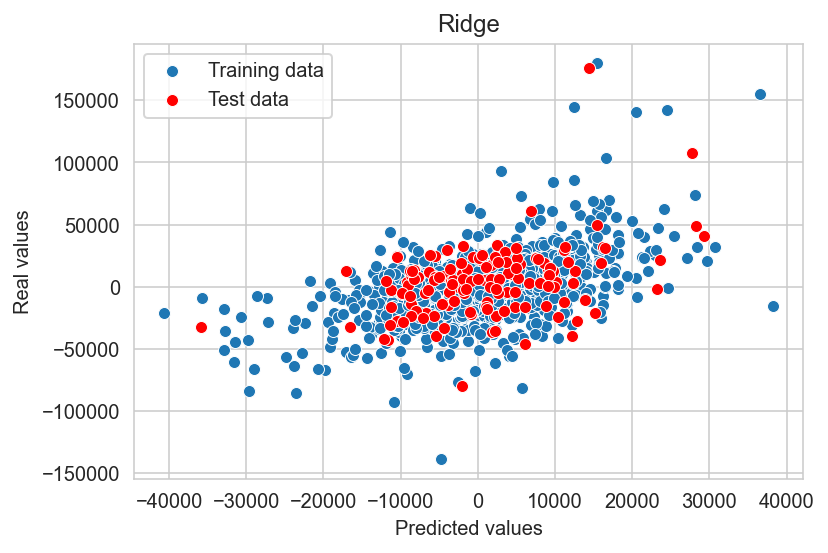

In [319]:
# plot predictions
plot_predictions(y_train_r, y_train_predict, y_test_r, y_predict, 'Ridge')

## 

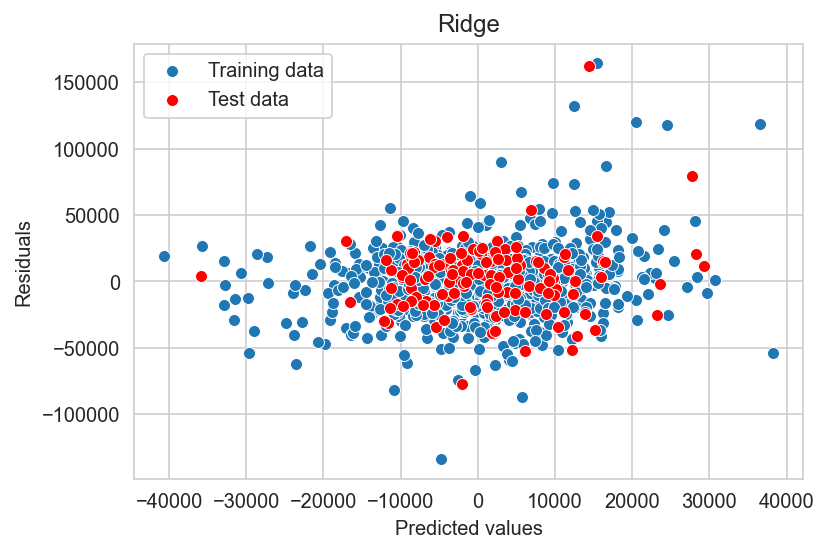

In [320]:
# Plot residuals
plot_residuals(y_train_r, y_train_predict, y_test_r, y_predict, 'Ridge')

## centred around zero, but lots of scatter/fan > 15k

mean: 3094.801054978611 median: 4552.956866162673 std: 25525.2631743589


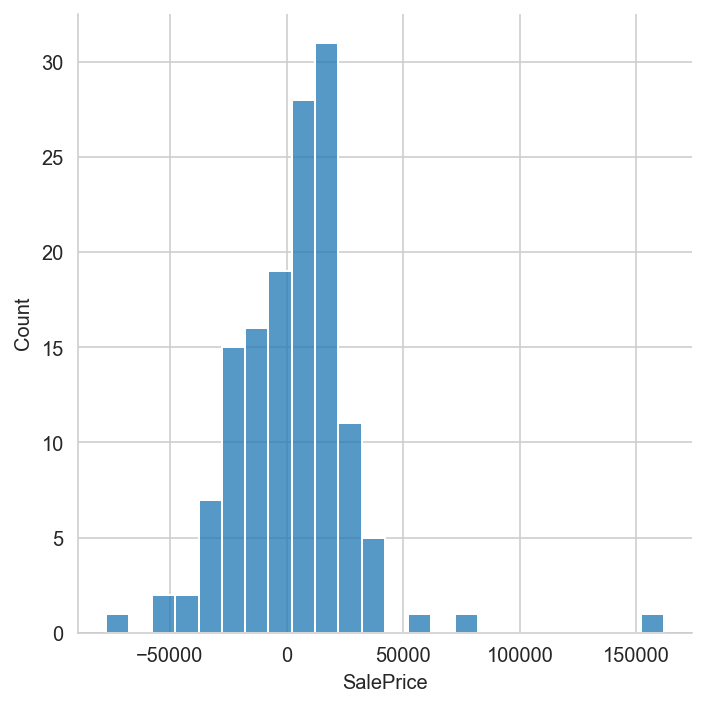

In [321]:
# plot distribution of residuals
plot_residual_dist(y_test_r, y_predict)

# mean ~$3k

In [322]:
# put features & coefs into a datafram
ridge_coefs = coefs_to_dataframe(list(X_train_r.columns), optimal_ridge.coef_)
ridge_coefs

## highest magnitude coefs are expected

,feature,coefs,abs_coefs
1,OverallCond,4313.369347,4313.369347
0,OverallQual,3306.825981,3306.825981
12,Functional,2764.806576,2764.806576
11,KitchenQual,2168.548740,2168.548740
3,ExterQual,1952.105400,1952.105400
...,...,...,...
91,SaleCondition_Family,20.634777,20.634777
44,Exterior2nd_AsphShn,-13.354925,13.354925
88,SaleType_WD,-10.219074,10.219074
86,SaleType_New,8.024356,8.024356


In [323]:
#look at top of magnitude
ridge_coefs.head(10)

,feature,coefs,abs_coefs
1,OverallCond,4313.369347,4313.369347
0,OverallQual,3306.825981,3306.825981
12,Functional,2764.806576,2764.806576
11,KitchenQual,2168.548740,2168.548740
3,ExterQual,1952.105400,1952.105400
5,BsmtCond,-1812.215185,1812.215185
32,Exterior1st_BrkFace,1263.951845,1263.951845
29,RoofMatl_WdShngl,1224.943499,1224.943499
64,Heating_OthW,-1148.186592,1148.186592
92,SaleCondition_Normal,1084.359140,1084.359140


In [324]:
# look at bottom of magnitude
ridge_coefs.tail(10)

,feature,coefs,abs_coefs
33,Exterior1st_CBlock,-92.090857,92.090857
83,SaleType_ConLD,88.013380,88.013380
4,ExterCond,73.976974,73.976974
80,MoSold_12,-32.441507,32.441507
74,MoSold_6,-30.559607,30.559607
91,SaleCondition_Family,20.634777,20.634777
44,Exterior2nd_AsphShn,-13.354925,13.354925
88,SaleType_WD,-10.219074,10.219074
86,SaleType_New,8.024356,8.024356
30,Exterior1st_AsphShn,0.000000,0.000000


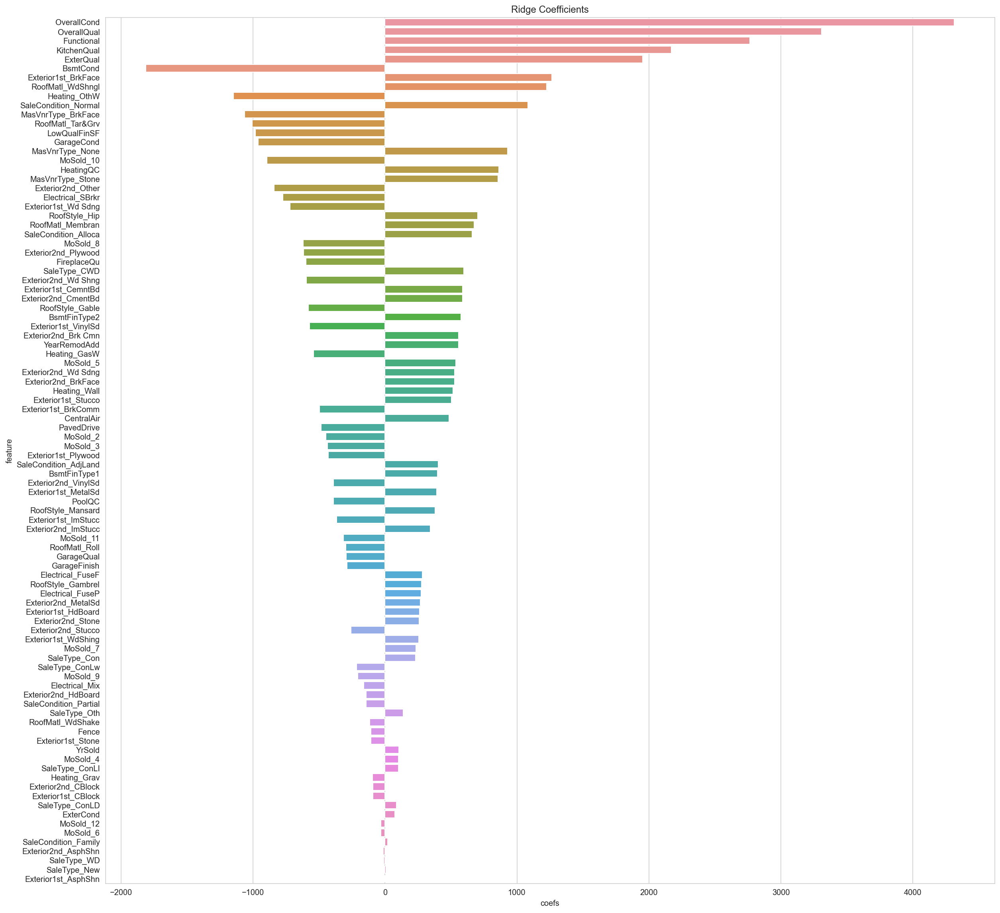

In [325]:
# visualise the coefficients
plt.figure(figsize=(20,20))

g = sns.barplot(data=ridge_coefs, y='feature', x='coefs', orient='h')
g.set_title('Ridge Coefficients');

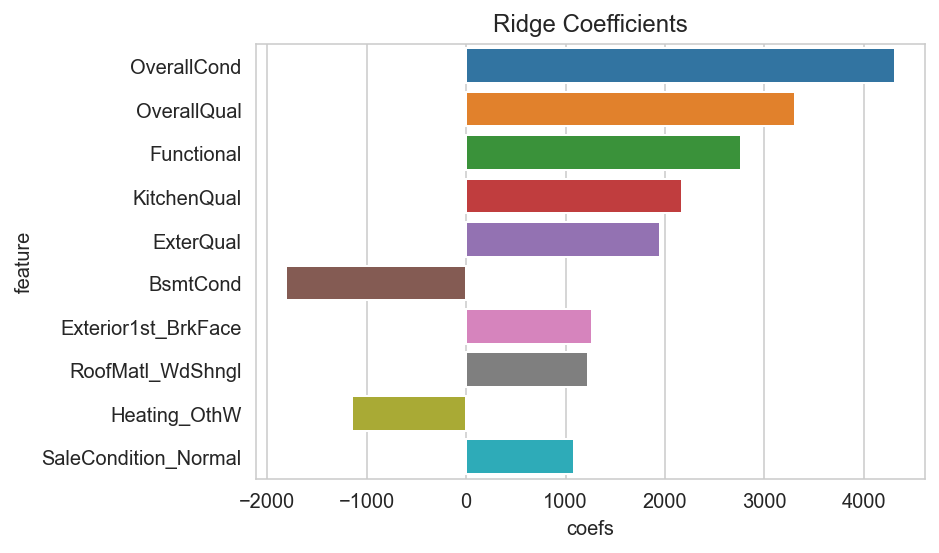

In [326]:
# visualise the top 10 coefficients
g = sns.barplot(data=ridge_coefs[0:10], y='feature', x='coefs', orient='h')
g.set_title('Ridge Coefficients');

In [327]:
## while Ridge CV has done well (R2) and provided top coefficients which are mostly intuitive,
## I'll try SGD to see how it goes on this dataset

##### <span style="color:purple">SGDRegressor</span>

In [328]:
from sklearn.linear_model import SGDRegressor
from sklearn.model_selection import GridSearchCV

In [329]:
# set up gridsearch parameters:
sgd_params = {
    'loss':['squared_loss','huber'],
    'penalty':['l1','l2'],
    'alpha':np.logspace(-5,1,50)
}

# initialise model
sgd_reg = SGDRegressor(max_iter=10000)
sgd_reg_gs = GridSearchCV(sgd_reg, sgd_params, cv=10, verbose=1)

In [330]:
# search for optimum parameters
sgd_reg_gs.fit(Xs_train_r, y_train_r)


Fitting 10 folds for each of 200 candidates, totalling 2000 fits


GridSearchCV(cv=10, estimator=SGDRegressor(max_iter=10000),
             param_grid={'alpha': array([1.00000000e-05, 1.32571137e-05, 1.75751062e-05, 2.32995181e-05,
       3.08884360e-05, 4.09491506e-05, 5.42867544e-05, 7.19685673e-05,
       9.54095476e-05, 1.26485522e-04, 1.67683294e-04, 2.22299648e-04,
       2.94705170e-04, 3.90693994e-04, 5.17947468e-04, 6.86648845e-04,
       9.10298178e-04, 1.20679264...
       2.68269580e-02, 3.55648031e-02, 4.71486636e-02, 6.25055193e-02,
       8.28642773e-02, 1.09854114e-01, 1.45634848e-01, 1.93069773e-01,
       2.55954792e-01, 3.39322177e-01, 4.49843267e-01, 5.96362332e-01,
       7.90604321e-01, 1.04811313e+00, 1.38949549e+00, 1.84206997e+00,
       2.44205309e+00, 3.23745754e+00, 4.29193426e+00, 5.68986603e+00,
       7.54312006e+00, 1.00000000e+01]),
                         'loss': ['squared_loss', 'huber'],
                         'penalty': ['l1', 'l2']},
             verbose=1)

In [331]:
# print best model & score 
print(sgd_reg_gs.best_params_)
print(sgd_reg_gs.best_score_)
sgd_reg = sgd_reg_gs.best_estimator_

# fit model
sgd_reg.fit(Xs_train_r, y_train_r)

# the gradient descent used ridge and squared loss.
# given the range in var of features >> go with standardised X
# model scored (~14%) with standardised X

{'alpha': 0.33932217718953295, 'loss': 'squared_loss', 'penalty': 'l2'}
0.12321098948093276


SGDRegressor(alpha=0.33932217718953295, max_iter=10000)

In [332]:
print('r2 train:',sgd_reg.score(Xs_train_r, y_train_r))
print('r2 test:', sgd_reg.score(Xs_test_r, y_test_r))

r2 train: 0.25114881412491574
r2 test: 0.15839559941219172


In [333]:
# get predictions
y_train_predict = sgd_reg.predict(Xs_train_r)
y_predict = sgd_reg.predict(Xs_test_r)

In [334]:
print(y_predict.min(), y_predict.max())
y_test_r.mean(), y_predict.mean(), y_predict.std()

-39208.93809780432 29844.467921682484


(4106.382496927094, 1593.3310385957589, 10371.099554880011)

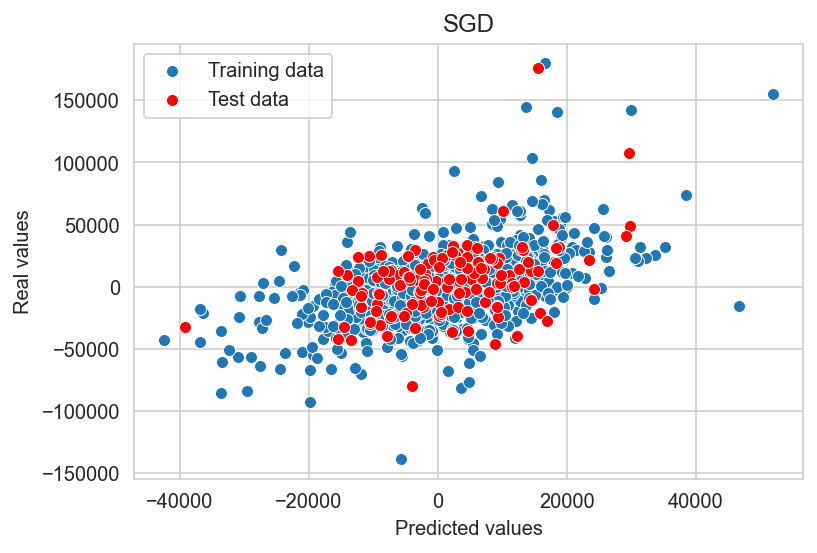

In [335]:
# plot predictions
plot_predictions(y_train_r, y_train_predict, y_test_r, y_predict, 'SGD')

## centred around zero, negative bias

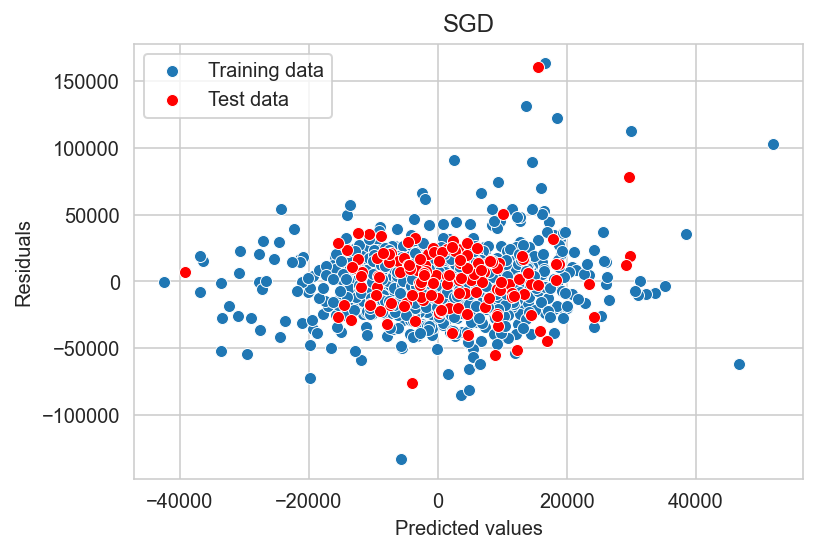

In [336]:
# Plot residuals
plot_residuals(y_train_r, y_train_predict, y_test_r, y_predict, 'SGD')

## generally centred around zero, scatter increases above +/- 10k

mean: 2513.051458331333 median: 4149.798137063104 std: 25362.785125748687


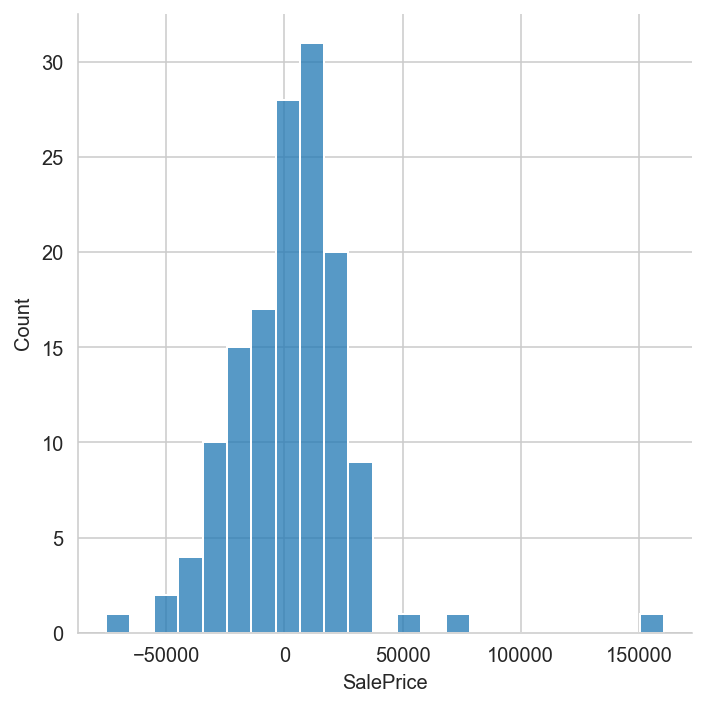

In [337]:
# plot distribution of residuals
plot_residual_dist(y_test_r, y_predict)

## mean ~3k

In [338]:
# put features & coefs into a datafram
sgd_coefs = coefs_to_dataframe(list(X_train_r.columns), sgd_reg.coef_)
sgd_coefs


,feature,coefs,abs_coefs
1,OverallCond,4995.595411,4995.595411
0,OverallQual,3988.026106,3988.026106
12,Functional,2887.425412,2887.425412
11,KitchenQual,2429.835752,2429.835752
5,BsmtCond,-2421.109170,2421.109170
...,...,...,...
49,Exterior2nd_HdBoard,-73.509463,73.509463
75,MoSold_7,55.185293,55.185293
85,SaleType_ConLw,-46.713308,46.713308
88,SaleType_WD,-11.650355,11.650355


In [339]:
#look at top of magnitude
sgd_coefs.head(10)

,feature,coefs,abs_coefs
1,OverallCond,4995.595411,4995.595411
0,OverallQual,3988.026106,3988.026106
12,Functional,2887.425412,2887.425412
11,KitchenQual,2429.835752,2429.835752
5,BsmtCond,-2421.109170,2421.109170
3,ExterQual,2220.142916,2220.142916
29,RoofMatl_WdShngl,1861.352935,1861.352935
92,SaleCondition_Normal,1682.690750,1682.690750
32,Exterior1st_BrkFace,1231.032184,1231.032184
16,GarageCond,-1216.312987,1216.312987


In [340]:
# look at bottom of magnitude
sgd_coefs.tail(10)

,feature,coefs,abs_coefs
15,GarageQual,-100.278594,100.278594
74,MoSold_6,98.855566,98.855566
31,Exterior1st_BrkComm,-92.602701,92.602701
63,Heating_Grav,90.421940,90.421940
86,SaleType_New,-84.280628,84.280628
49,Exterior2nd_HdBoard,-73.509463,73.509463
75,MoSold_7,55.185293,55.185293
85,SaleType_ConLw,-46.713308,46.713308
88,SaleType_WD,-11.650355,11.650355
30,Exterior1st_AsphShn,0.000000,0.000000


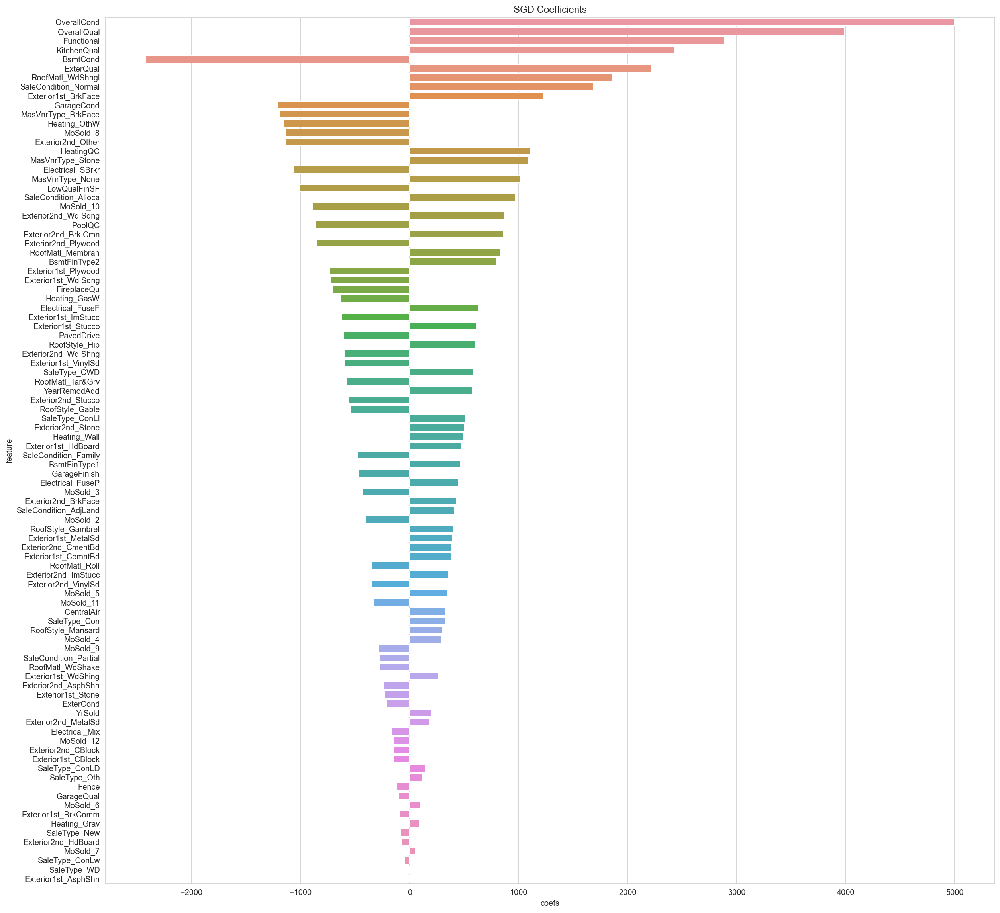

In [341]:
# visualise the coefficients
plt.figure(figsize=(20,20))

g = sns.barplot(data=sgd_coefs, y='feature', x='coefs', orient='h')
g.set_title('SGD Coefficients');

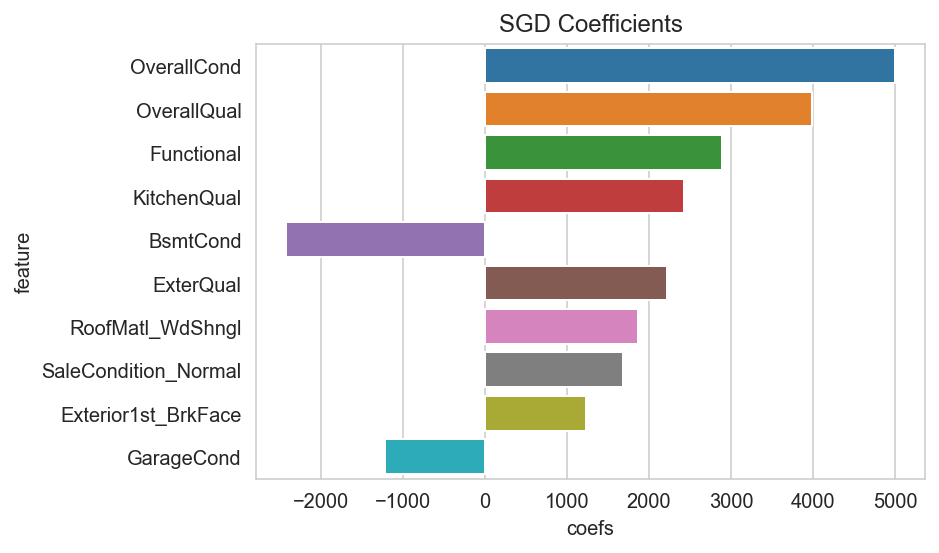

In [342]:
# visualise the top 10 coefficients
g = sns.barplot(data=sgd_coefs[0:10], y='feature', x='coefs', orient='h')
g.set_title('SGD Coefficients');

In [343]:
# compare SGD & Ridge coefs, looks like a similar group at the top
compare_df = pd.merge(left=sgd_coefs, 
                      right=ridge_coefs, how='outer', on='feature', 
                     suffixes=('_sgd', '_ridge'))

compare_df['sgd-ridge'] = compare_df.coefs_sgd - compare_df.coefs_ridge
compare_df.drop(columns=['abs_coefs_sgd', 'abs_coefs_ridge'], inplace=True)
compare_df[0:10]

,feature,coefs_sgd,coefs_ridge,sgd-ridge
0,OverallCond,4995.595411,4313.369347,682.226064
1,OverallQual,3988.026106,3306.825981,681.200125
2,Functional,2887.425412,2764.806576,122.618837
3,KitchenQual,2429.835752,2168.548740,261.287012
4,BsmtCond,-2421.109170,-1812.215185,-608.893985
5,ExterQual,2220.142916,1952.105400,268.037515
6,RoofMatl_WdShngl,1861.352935,1224.943499,636.409436
7,SaleCondition_Normal,1682.690750,1084.359140,598.331611
8,Exterior1st_BrkFace,1231.032184,1263.951845,-32.919660
9,GarageCond,-1216.312987,-961.823468,-254.489519


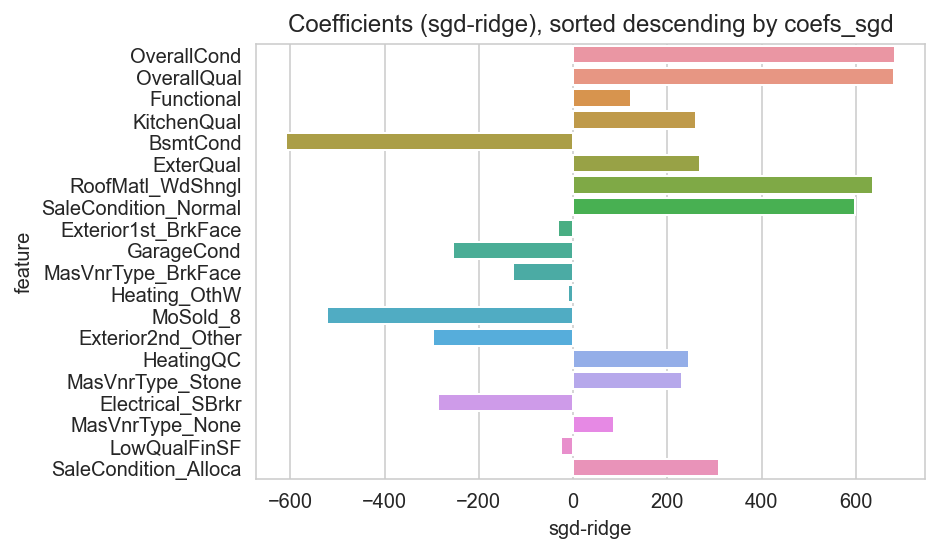

In [344]:
# visualise the difference between SGD & Ridge coefficients
g = sns.barplot(data=compare_df[0:20], 
                y='feature', x='sgd-ridge', orient='h')
g.set_title('Coefficients (sgd-ridge), sorted descending by coefs_sgd');


---
<a id='q2_summary'></a>
### <span style="color:purple">Question 2 Summary</span>

[back to index](#index)

Trialed 3 models:  
- Linear Regression
- Ridge CV
- SGD

Used **SGD** model's results for a number of reasons:  
* More relaxed assumptions around the data. (As compared with Linear Regression)
* Tighter grouping (by a small margin) of residuals than Ridge model.
* Because this model is using L2 (ridge) as the loss penalty, it is expected that it would have similar coefficients & residual distribution/plot.

This model:
* used ridge (L2) and squared loss.
* explained ~14% of the variance (R squared).
* residual mean of ~3k
* residuals vs y_hat plot: generally centred around zero, scatter increases above +/- 10k. 
  
Features influencing the model:  
* OverallCond
* OverallQual
* Functional
* KitchenQual
* ExterQual

The top influencing features are as I expected, with Overall Qual/Cond and Functionality leading. However, Kitchen Quality was a surprise to see so high as an influencer.

**Top renovate-able features to consider when buying a property**  

Are these easily/cheaply able to be improved?  
- Overall Condition/Quality	
- Functional (e.g. minor deductions)
- Kitchen Quality
- External Quality

---
---

<a id='further_analysis'></a>
### <span style="color:purple">Options for alternative analysis/predictions</span>

[back to index](#index)

A few of the options I considered for future/alternative analysis on this dataset:  

- Change ordinal variables into dummies.
- Feature engineering: create new summary variables, e.g. Total sqft, Total Bathrooms.
- Impute rather than drop LotFrontage nulls, OR drop feature rather than observations.
- Cull more outliers so there is less variability for models to deal with.

---
---